In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings ( "ignore" )
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler , LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score , classification_report , roc_auc_score , confusion_matrix

In [2]:
data = pd.read_csv ( "E:/Employee_Performance.csv" )

In [3]:
data.head ( )

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3


In [4]:
data.info ( )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
EmpNumber                       1200 non-null object
Age                             1200 non-null int64
Gender                          1200 non-null object
EducationBackground             1200 non-null object
MaritalStatus                   1200 non-null object
EmpDepartment                   1200 non-null object
EmpJobRole                      1200 non-null object
BusinessTravelFrequency         1200 non-null object
DistanceFromHome                1200 non-null int64
EmpEducationLevel               1200 non-null int64
EmpEnvironmentSatisfaction      1200 non-null int64
EmpHourlyRate                   1200 non-null int64
EmpJobInvolvement               1200 non-null int64
EmpJobLevel                     1200 non-null int64
EmpJobSatisfaction              1200 non-null int64
NumCompaniesWorked              1200 non-null int64
OverTime                        1200 non-null object
E

In [5]:
data.shape

(1200, 28)

In [6]:
data.isnull ( ).sum ( )

EmpNumber                       0
Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

In [7]:
data.describe ( exclude = "object" )

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [8]:
data.describe ( include = "object" )

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200,1200
unique,1200,2,6,3,6,19,3,2,2
top,E100672,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,1,725,492,548,373,270,846,847,1022


In [9]:
data.drop ( "EmpNumber" , axis = 1 , inplace = True )

In [10]:
numerical = data.select_dtypes ( exclude = "object" ).columns
categorical = data.select_dtypes ( include = "object" ).columns

In [11]:
print ( "Numerical columns:" , numerical )
print ( "Categorical columns:" , categorical )

Numerical columns: Index(['Age', 'DistanceFromHome', 'EmpEducationLevel',
       'EmpEnvironmentSatisfaction', 'EmpHourlyRate', 'EmpJobInvolvement',
       'EmpJobLevel', 'EmpJobSatisfaction', 'NumCompaniesWorked',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'PerformanceRating'],
      dtype='object')
Categorical columns: Index(['Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment',
       'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition'],
      dtype='object')


Distribution plot for Age
Skewness for Age is: 0.38414495910435587


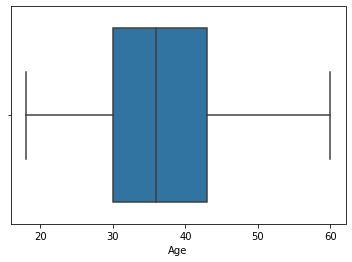

Distribution plot for DistanceFromHome
Skewness for DistanceFromHome is: 0.9629561160828001


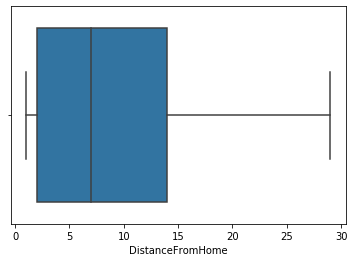

Distribution plot for EmpEducationLevel
Skewness for EmpEducationLevel is: -0.2509739549121143


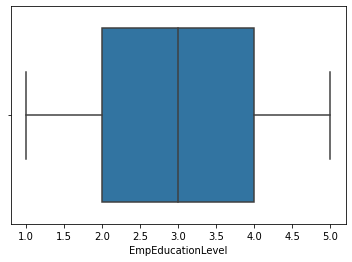

Distribution plot for EmpEnvironmentSatisfaction
Skewness for EmpEnvironmentSatisfaction is: -0.30766481317696426


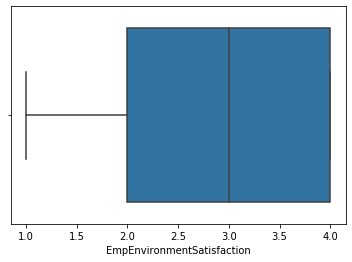

Distribution plot for EmpHourlyRate
Skewness for EmpHourlyRate is: -0.035164888157941436


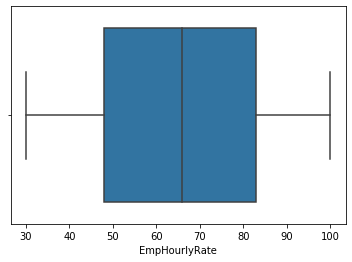

Distribution plot for EmpJobInvolvement
Skewness for EmpJobInvolvement is: -0.5578460669486782


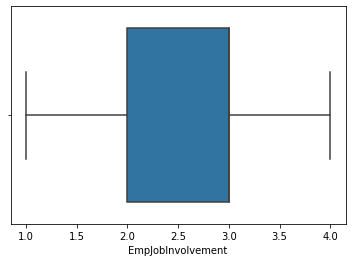

Distribution plot for EmpJobLevel
Skewness for EmpJobLevel is: 1.0240531444817913


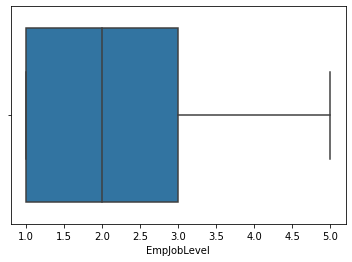

Distribution plot for EmpJobSatisfaction
Skewness for EmpJobSatisfaction is: -0.3242761983209276


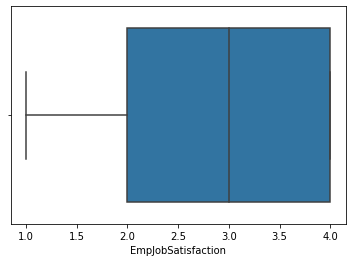

Distribution plot for NumCompaniesWorked
Skewness for NumCompaniesWorked is: 1.0486347545868095


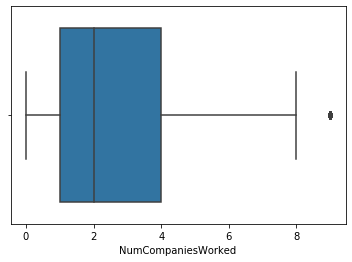

Distribution plot for EmpLastSalaryHikePercent
Skewness for EmpLastSalaryHikePercent is: 0.8086536332261228


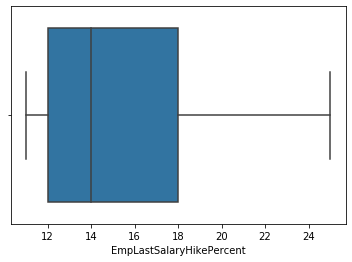

Distribution plot for EmpRelationshipSatisfaction
Skewness for EmpRelationshipSatisfaction is: -0.31856300290251793


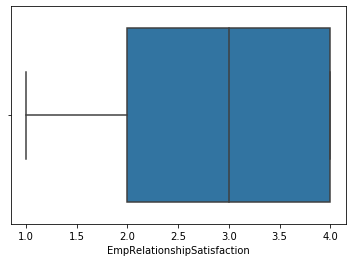

Distribution plot for TotalWorkExperienceInYears
Skewness for TotalWorkExperienceInYears is: 1.0868618597364565


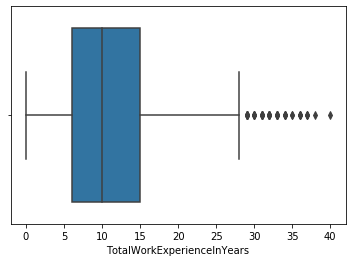

Distribution plot for TrainingTimesLastYear
Skewness for TrainingTimesLastYear is: 0.5320731985603981


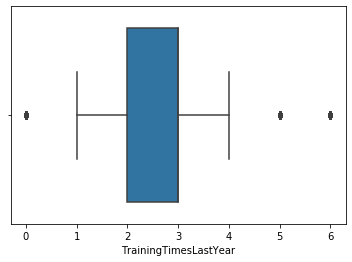

Distribution plot for EmpWorkLifeBalance
Skewness for EmpWorkLifeBalance is: -0.5392310584341446


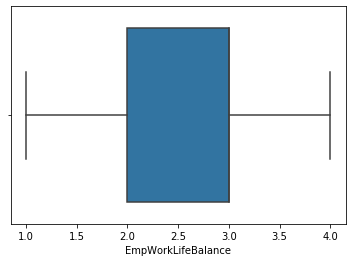

Distribution plot for ExperienceYearsAtThisCompany
Skewness for ExperienceYearsAtThisCompany is: 1.789054979919473


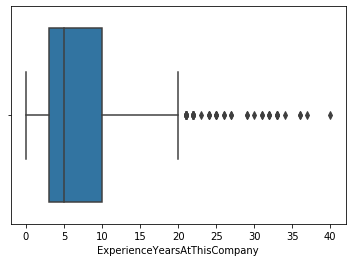

Distribution plot for ExperienceYearsInCurrentRole
Skewness for ExperienceYearsInCurrentRole is: 0.8881586703270758


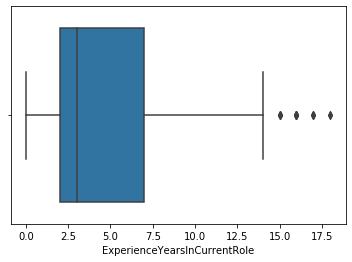

Distribution plot for YearsSinceLastPromotion
Skewness for YearsSinceLastPromotion is: 1.9749315589155791


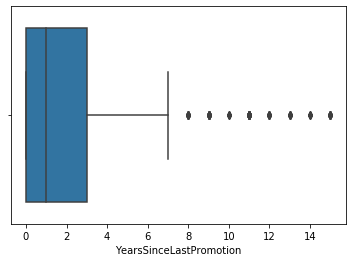

Distribution plot for YearsWithCurrManager
Skewness for YearsWithCurrManager is: 0.8131582957766446


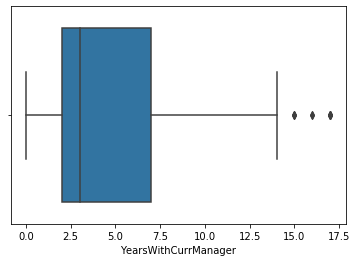

Distribution plot for PerformanceRating
Skewness for PerformanceRating is: -0.07057642842376263


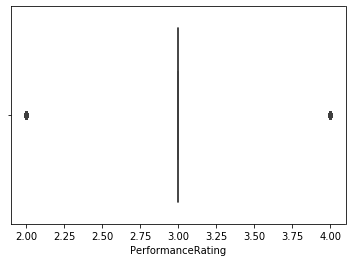

In [12]:
for i in numerical:
    print ( "Distribution plot for {}" .format ( i ) )
    print ( "Skewness for {} is: {}" .format ( i , data [ i ].skew ( ) ) )
    sns.boxplot ( data [ i ] )
    plt.show ( )

Countplot for Gender


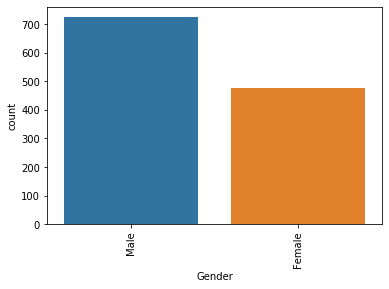

Countplot for EducationBackground


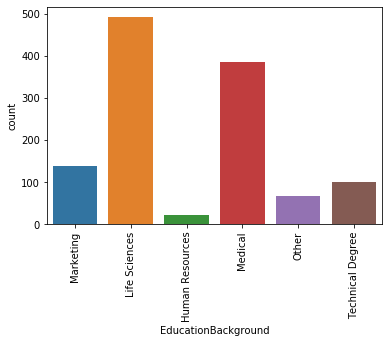

Countplot for MaritalStatus


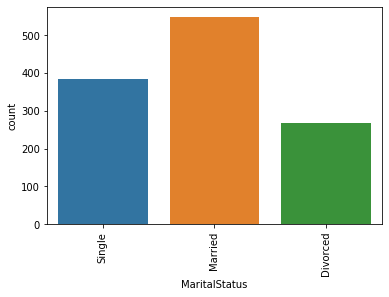

Countplot for EmpDepartment


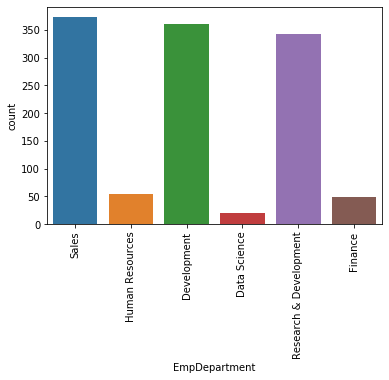

Countplot for EmpJobRole


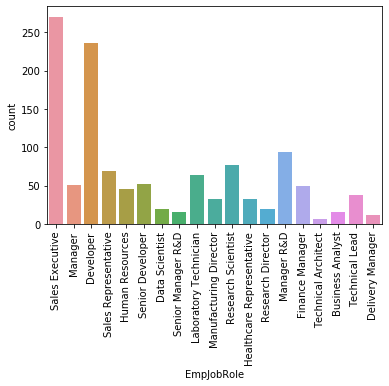

Countplot for BusinessTravelFrequency


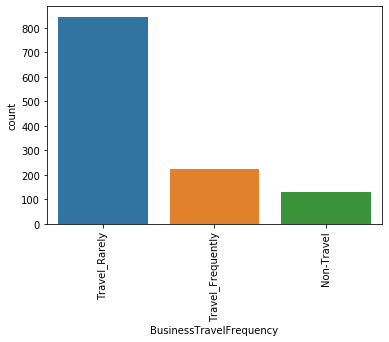

Countplot for OverTime


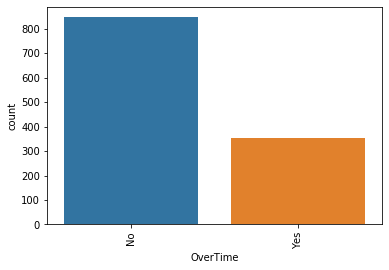

Countplot for Attrition


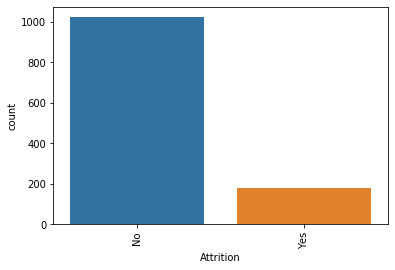

In [13]:
for i in categorical:
    print ( "Countplot for {}" .format ( i ) )
    sns.countplot ( data [ i ] )
    plt.xticks ( rotation = 90 )
    plt.show ( )

Scatterplot for Age and DistanceFromHome


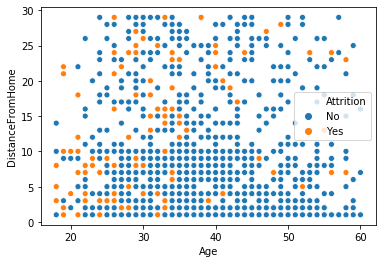

Scatterplot for Age and EmpEducationLevel


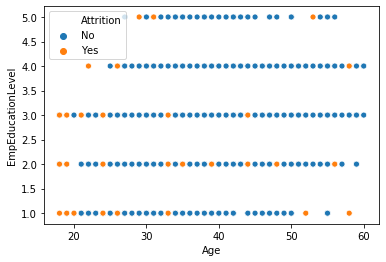

Scatterplot for Age and EmpEnvironmentSatisfaction


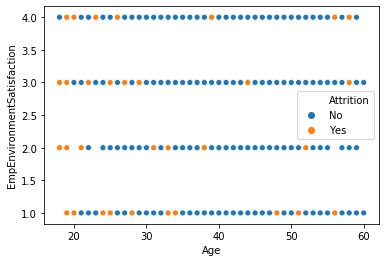

Scatterplot for Age and EmpHourlyRate


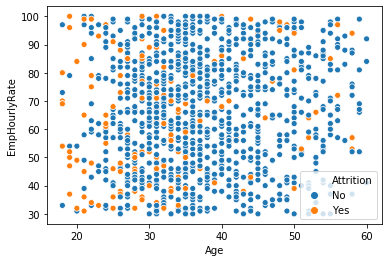

Scatterplot for Age and EmpJobInvolvement


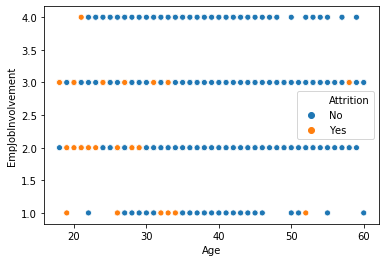

Scatterplot for Age and EmpJobLevel


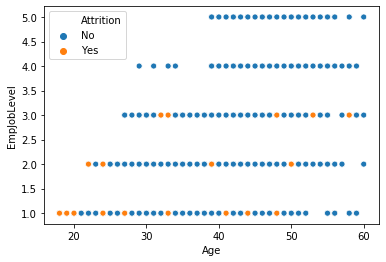

Scatterplot for Age and EmpJobSatisfaction


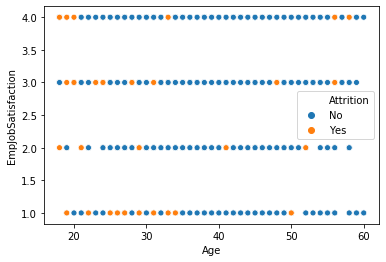

Scatterplot for Age and NumCompaniesWorked


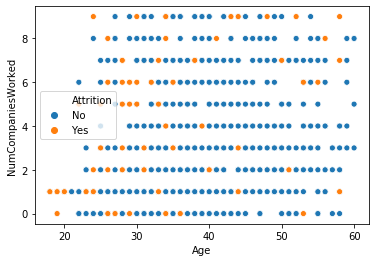

Scatterplot for Age and EmpLastSalaryHikePercent


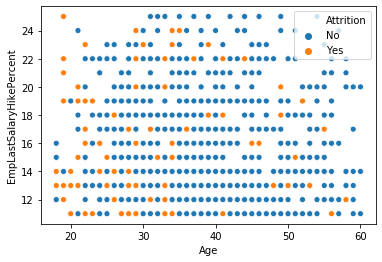

Scatterplot for Age and EmpRelationshipSatisfaction


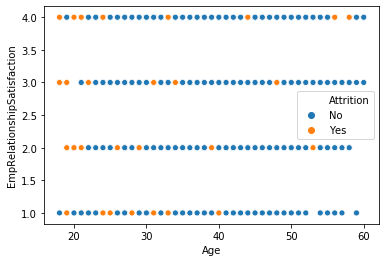

Scatterplot for Age and TotalWorkExperienceInYears


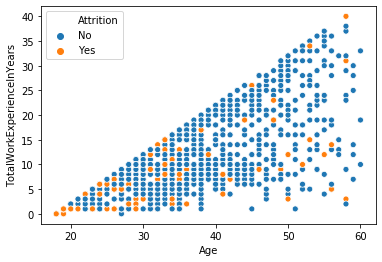

Scatterplot for Age and TrainingTimesLastYear


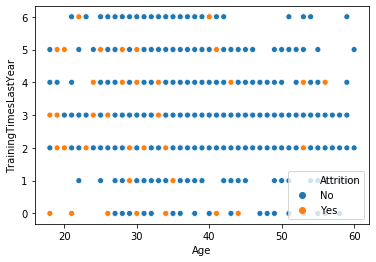

Scatterplot for Age and EmpWorkLifeBalance


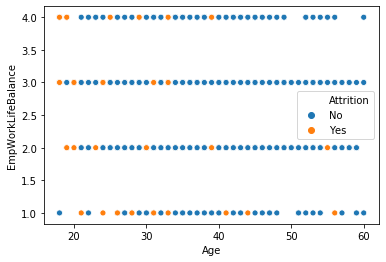

Scatterplot for Age and ExperienceYearsAtThisCompany


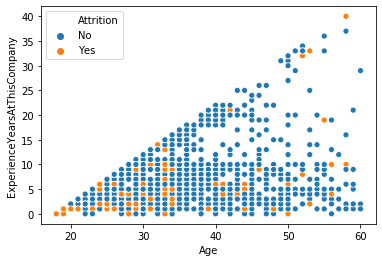

Scatterplot for Age and ExperienceYearsInCurrentRole


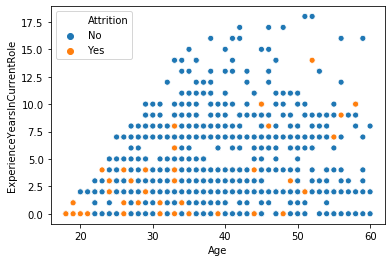

Scatterplot for Age and YearsSinceLastPromotion


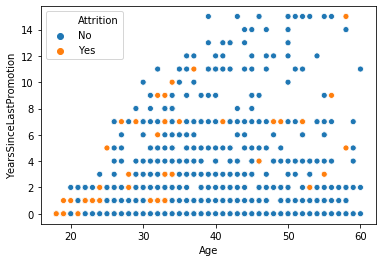

Scatterplot for Age and YearsWithCurrManager


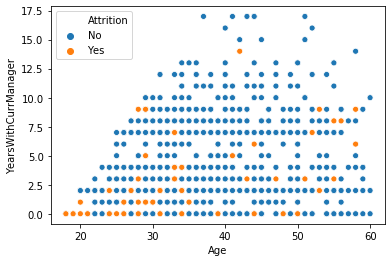

Scatterplot for Age and PerformanceRating


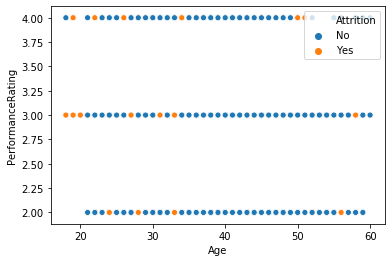

Scatterplot for DistanceFromHome and EmpEducationLevel


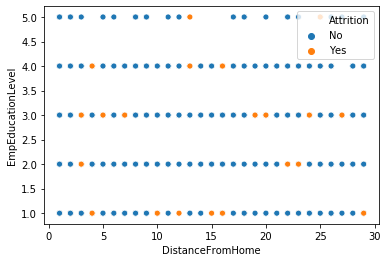

Scatterplot for DistanceFromHome and EmpEnvironmentSatisfaction


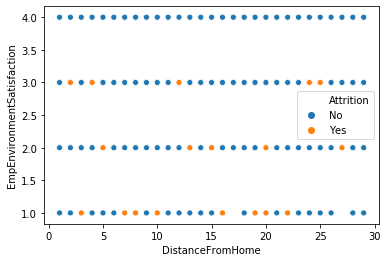

Scatterplot for DistanceFromHome and EmpHourlyRate


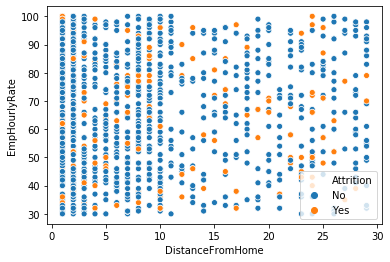

Scatterplot for DistanceFromHome and EmpJobInvolvement


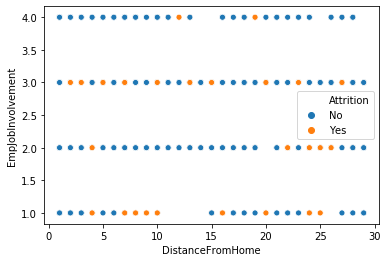

Scatterplot for DistanceFromHome and EmpJobLevel


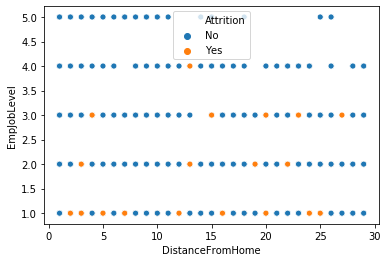

Scatterplot for DistanceFromHome and EmpJobSatisfaction


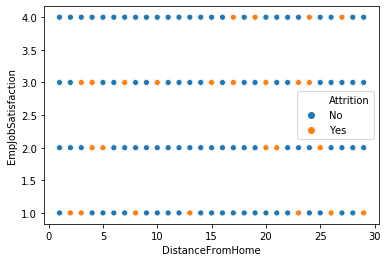

Scatterplot for DistanceFromHome and NumCompaniesWorked


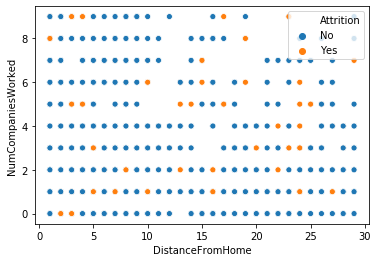

Scatterplot for DistanceFromHome and EmpLastSalaryHikePercent


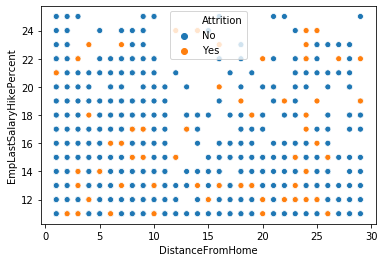

Scatterplot for DistanceFromHome and EmpRelationshipSatisfaction


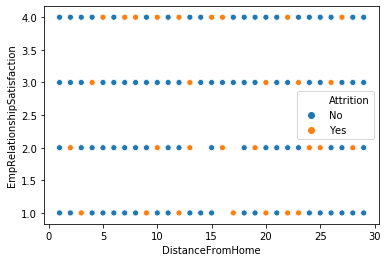

Scatterplot for DistanceFromHome and TotalWorkExperienceInYears


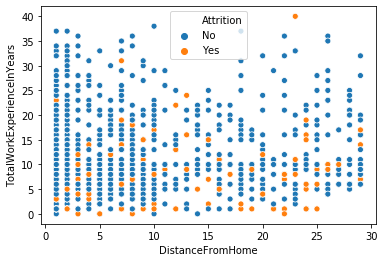

Scatterplot for DistanceFromHome and TrainingTimesLastYear


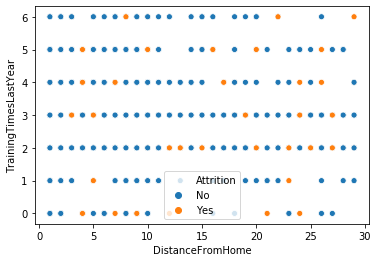

Scatterplot for DistanceFromHome and EmpWorkLifeBalance


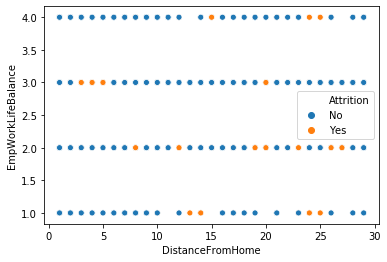

Scatterplot for DistanceFromHome and ExperienceYearsAtThisCompany


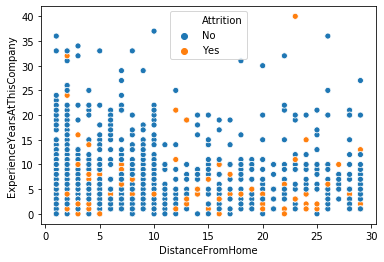

Scatterplot for DistanceFromHome and ExperienceYearsInCurrentRole


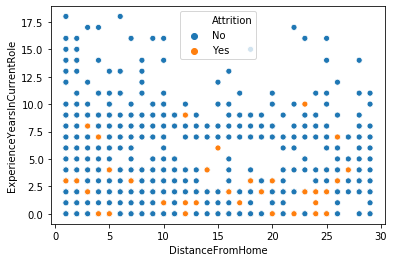

Scatterplot for DistanceFromHome and YearsSinceLastPromotion


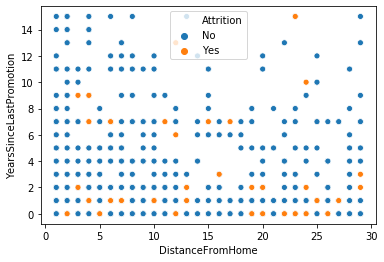

Scatterplot for DistanceFromHome and YearsWithCurrManager


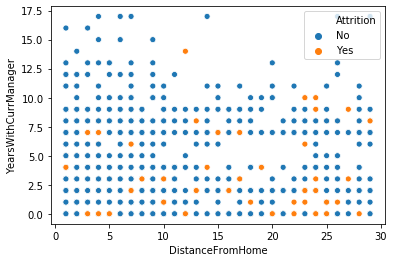

Scatterplot for DistanceFromHome and PerformanceRating


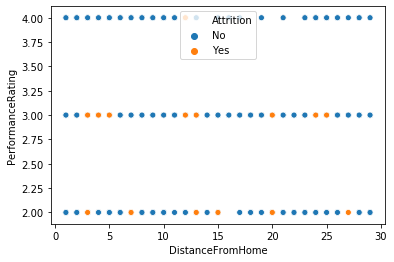

Scatterplot for EmpEducationLevel and EmpEnvironmentSatisfaction


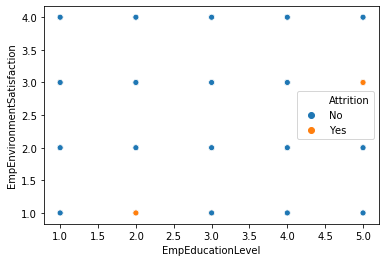

Scatterplot for EmpEducationLevel and EmpHourlyRate


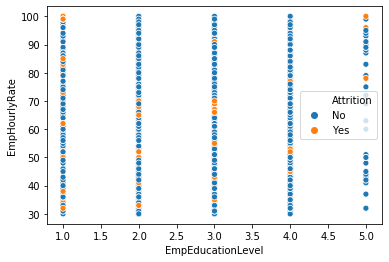

Scatterplot for EmpEducationLevel and EmpJobInvolvement


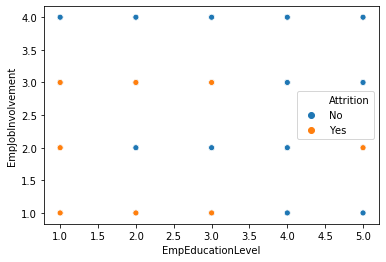

Scatterplot for EmpEducationLevel and EmpJobLevel


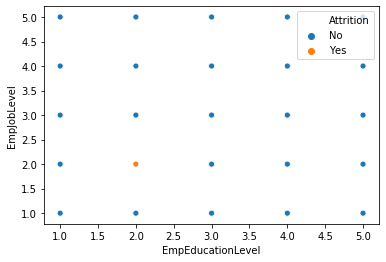

Scatterplot for EmpEducationLevel and EmpJobSatisfaction


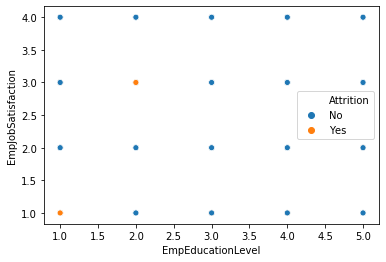

Scatterplot for EmpEducationLevel and NumCompaniesWorked


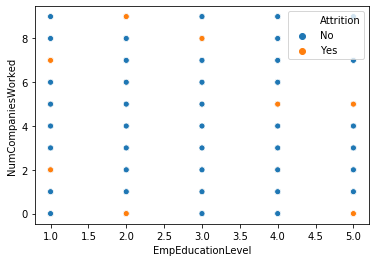

Scatterplot for EmpEducationLevel and EmpLastSalaryHikePercent


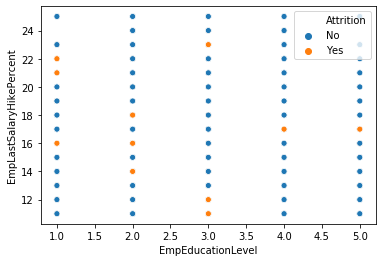

Scatterplot for EmpEducationLevel and EmpRelationshipSatisfaction


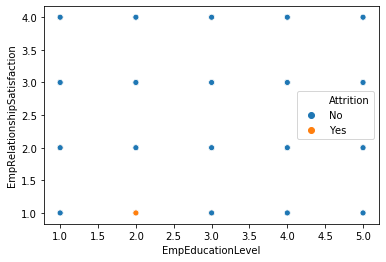

Scatterplot for EmpEducationLevel and TotalWorkExperienceInYears


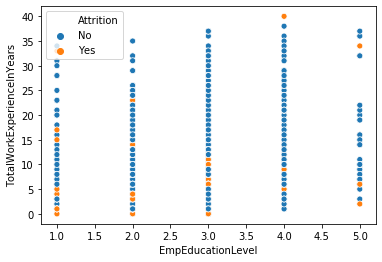

Scatterplot for EmpEducationLevel and TrainingTimesLastYear


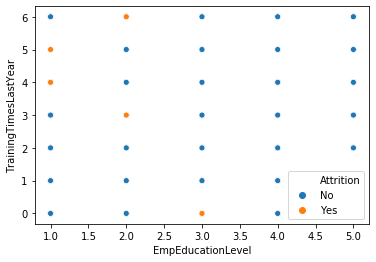

Scatterplot for EmpEducationLevel and EmpWorkLifeBalance


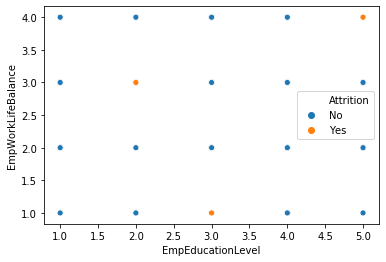

Scatterplot for EmpEducationLevel and ExperienceYearsAtThisCompany


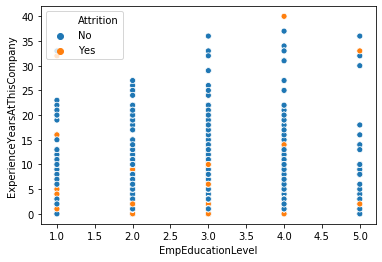

Scatterplot for EmpEducationLevel and ExperienceYearsInCurrentRole


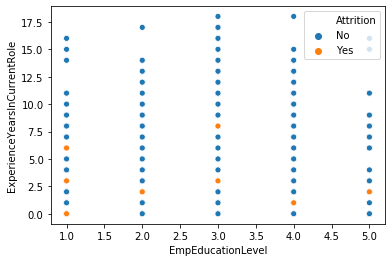

Scatterplot for EmpEducationLevel and YearsSinceLastPromotion


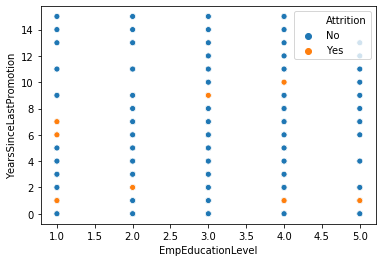

Scatterplot for EmpEducationLevel and YearsWithCurrManager


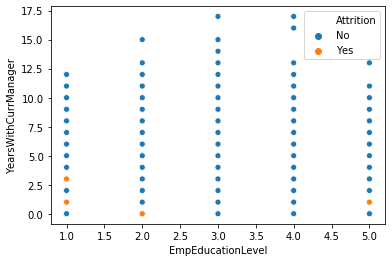

Scatterplot for EmpEducationLevel and PerformanceRating


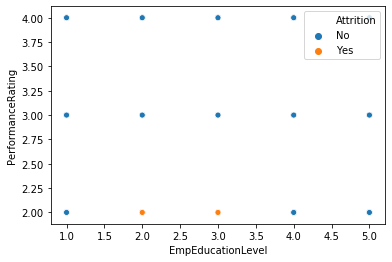

Scatterplot for EmpEnvironmentSatisfaction and EmpHourlyRate


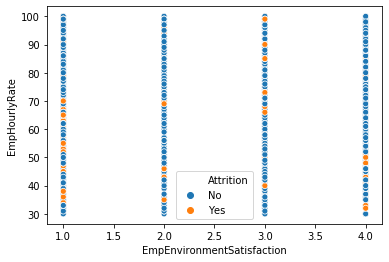

Scatterplot for EmpEnvironmentSatisfaction and EmpJobInvolvement


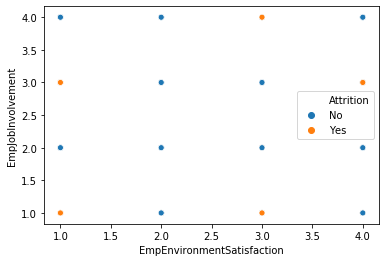

Scatterplot for EmpEnvironmentSatisfaction and EmpJobLevel


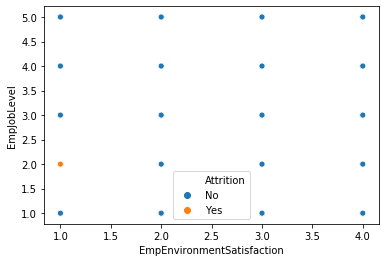

Scatterplot for EmpEnvironmentSatisfaction and EmpJobSatisfaction


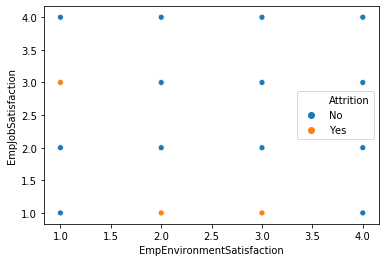

Scatterplot for EmpEnvironmentSatisfaction and NumCompaniesWorked


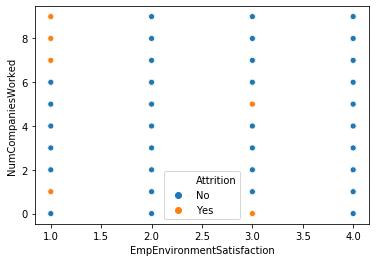

Scatterplot for EmpEnvironmentSatisfaction and EmpLastSalaryHikePercent


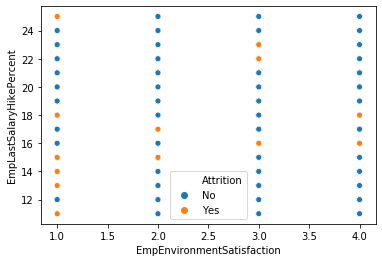

Scatterplot for EmpEnvironmentSatisfaction and EmpRelationshipSatisfaction


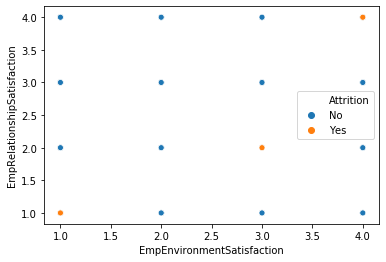

Scatterplot for EmpEnvironmentSatisfaction and TotalWorkExperienceInYears


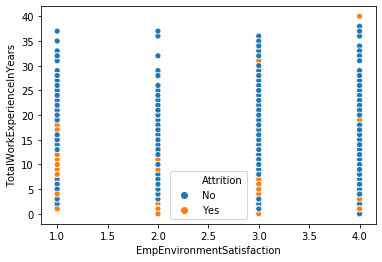

Scatterplot for EmpEnvironmentSatisfaction and TrainingTimesLastYear


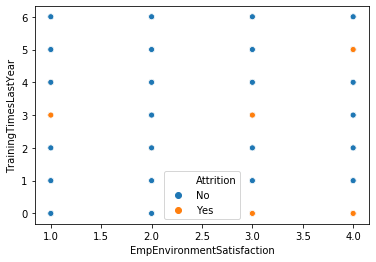

Scatterplot for EmpEnvironmentSatisfaction and EmpWorkLifeBalance


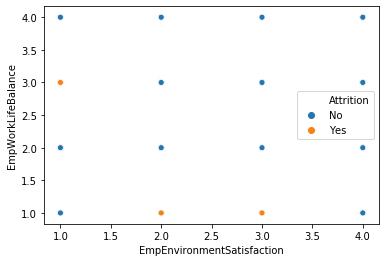

Scatterplot for EmpEnvironmentSatisfaction and ExperienceYearsAtThisCompany


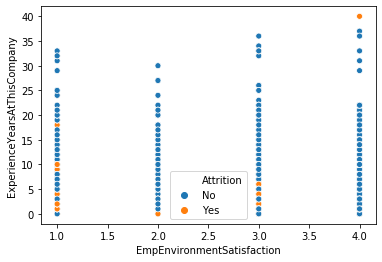

Scatterplot for EmpEnvironmentSatisfaction and ExperienceYearsInCurrentRole


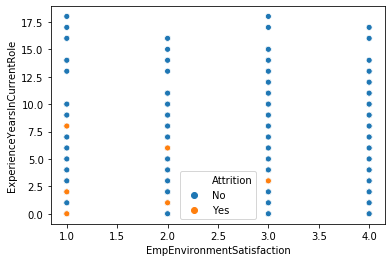

Scatterplot for EmpEnvironmentSatisfaction and YearsSinceLastPromotion


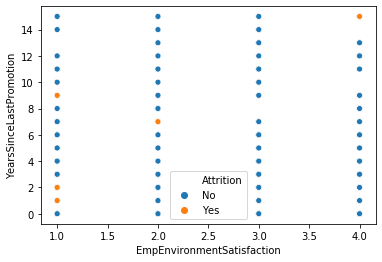

Scatterplot for EmpEnvironmentSatisfaction and YearsWithCurrManager


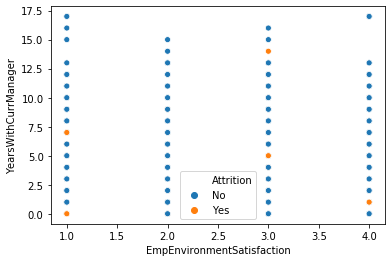

Scatterplot for EmpEnvironmentSatisfaction and PerformanceRating


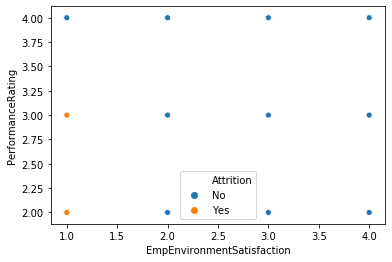

Scatterplot for EmpHourlyRate and EmpJobInvolvement


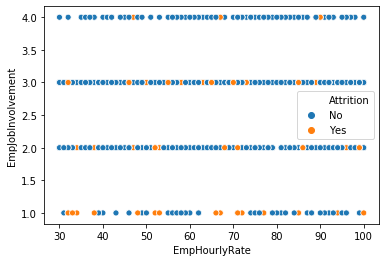

Scatterplot for EmpHourlyRate and EmpJobLevel


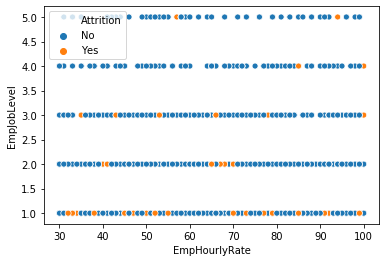

Scatterplot for EmpHourlyRate and EmpJobSatisfaction


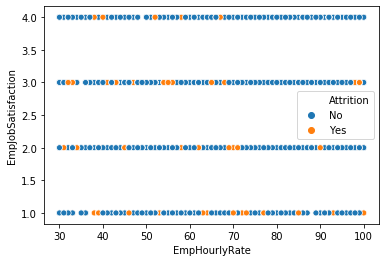

Scatterplot for EmpHourlyRate and NumCompaniesWorked


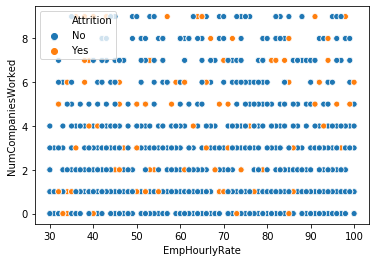

Scatterplot for EmpHourlyRate and EmpLastSalaryHikePercent


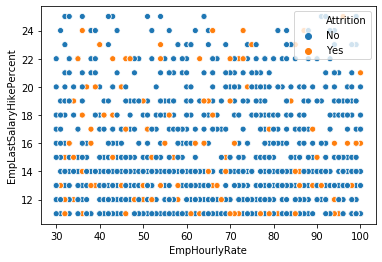

Scatterplot for EmpHourlyRate and EmpRelationshipSatisfaction


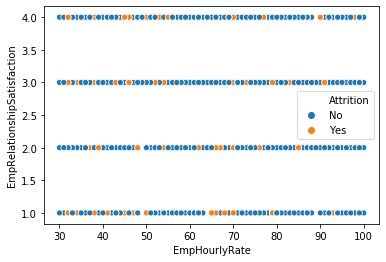

Scatterplot for EmpHourlyRate and TotalWorkExperienceInYears


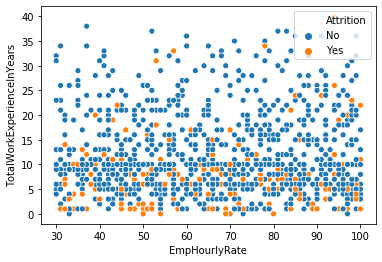

Scatterplot for EmpHourlyRate and TrainingTimesLastYear


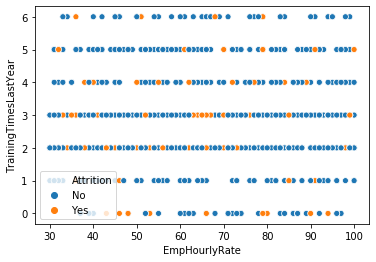

Scatterplot for EmpHourlyRate and EmpWorkLifeBalance


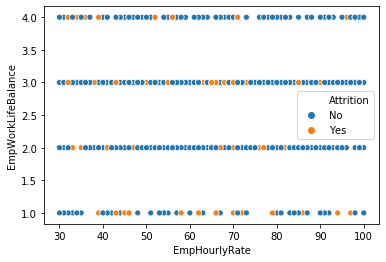

Scatterplot for EmpHourlyRate and ExperienceYearsAtThisCompany


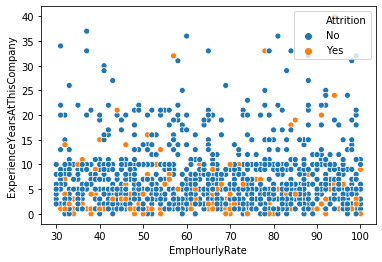

Scatterplot for EmpHourlyRate and ExperienceYearsInCurrentRole


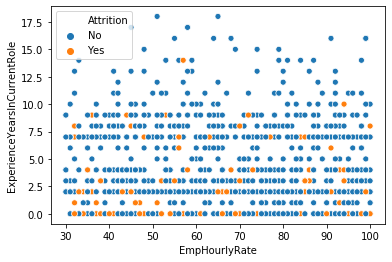

Scatterplot for EmpHourlyRate and YearsSinceLastPromotion


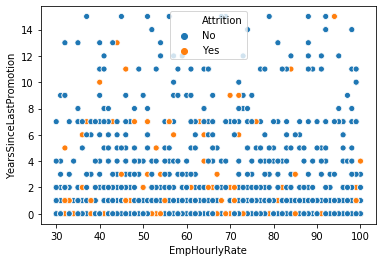

Scatterplot for EmpHourlyRate and YearsWithCurrManager


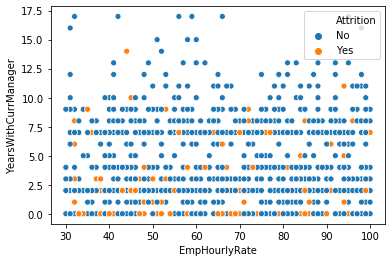

Scatterplot for EmpHourlyRate and PerformanceRating


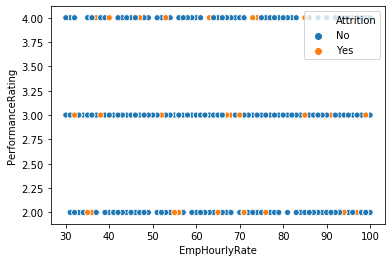

Scatterplot for EmpJobInvolvement and EmpJobLevel


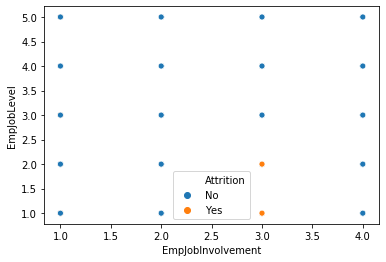

Scatterplot for EmpJobInvolvement and EmpJobSatisfaction


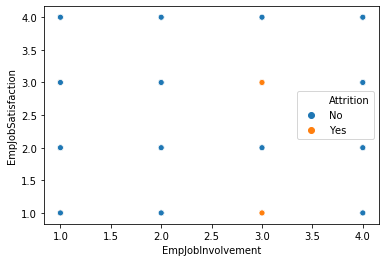

Scatterplot for EmpJobInvolvement and NumCompaniesWorked


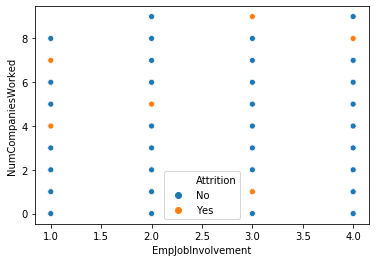

Scatterplot for EmpJobInvolvement and EmpLastSalaryHikePercent


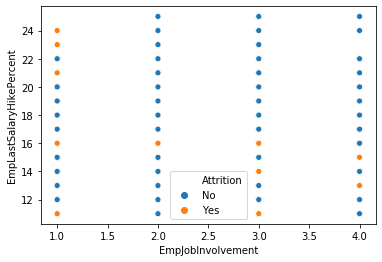

Scatterplot for EmpJobInvolvement and EmpRelationshipSatisfaction


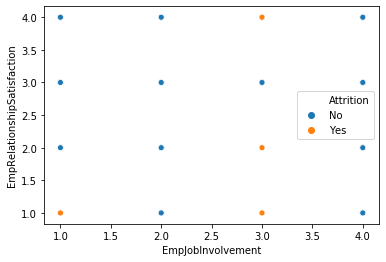

Scatterplot for EmpJobInvolvement and TotalWorkExperienceInYears


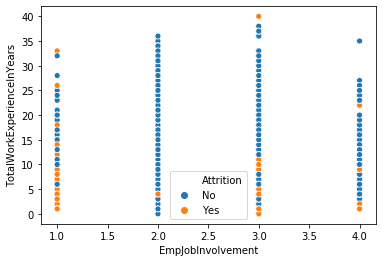

Scatterplot for EmpJobInvolvement and TrainingTimesLastYear


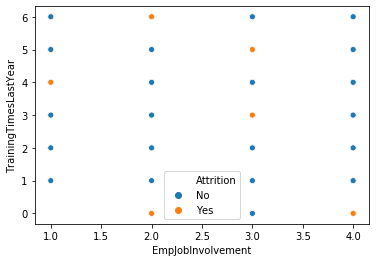

Scatterplot for EmpJobInvolvement and EmpWorkLifeBalance


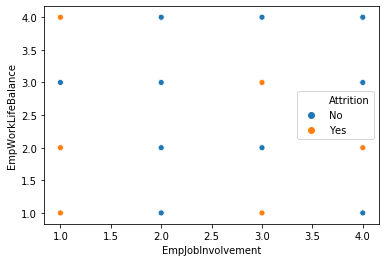

Scatterplot for EmpJobInvolvement and ExperienceYearsAtThisCompany


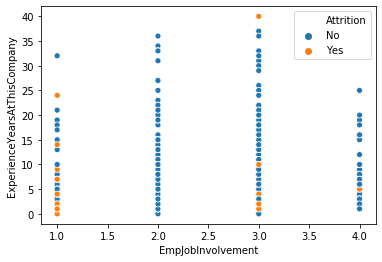

Scatterplot for EmpJobInvolvement and ExperienceYearsInCurrentRole


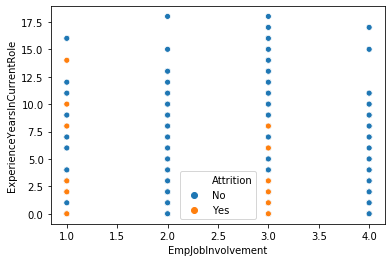

Scatterplot for EmpJobInvolvement and YearsSinceLastPromotion


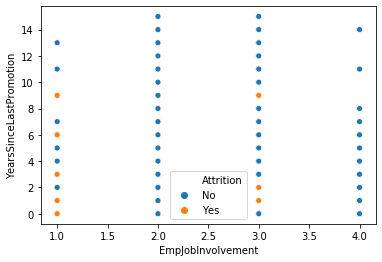

Scatterplot for EmpJobInvolvement and YearsWithCurrManager


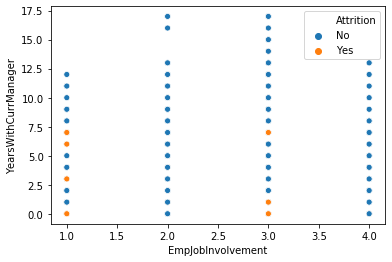

Scatterplot for EmpJobInvolvement and PerformanceRating


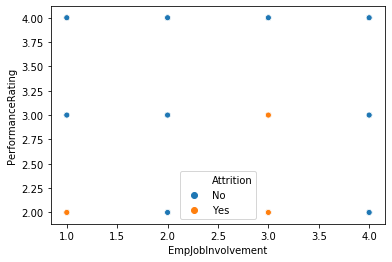

Scatterplot for EmpJobLevel and EmpJobSatisfaction


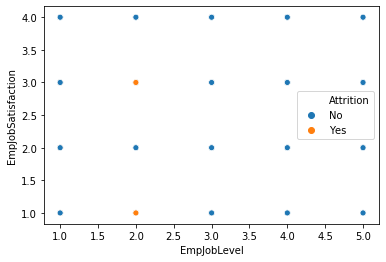

Scatterplot for EmpJobLevel and NumCompaniesWorked


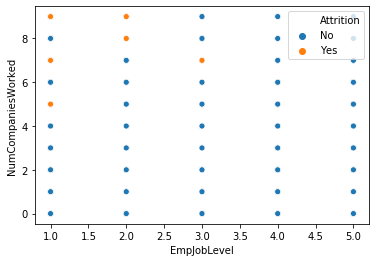

Scatterplot for EmpJobLevel and EmpLastSalaryHikePercent


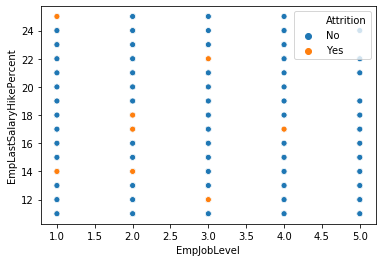

Scatterplot for EmpJobLevel and EmpRelationshipSatisfaction


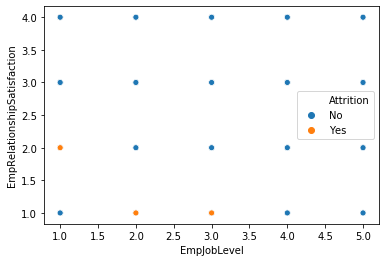

Scatterplot for EmpJobLevel and TotalWorkExperienceInYears


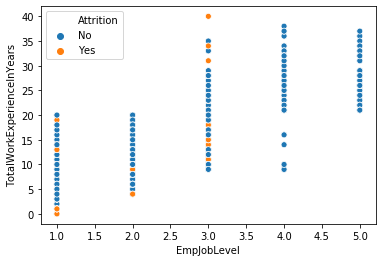

Scatterplot for EmpJobLevel and TrainingTimesLastYear


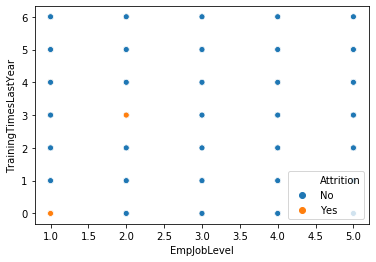

Scatterplot for EmpJobLevel and EmpWorkLifeBalance


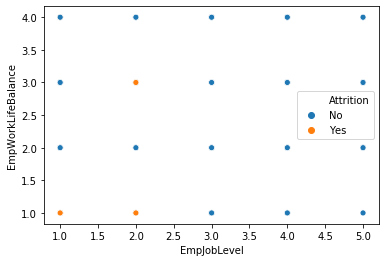

Scatterplot for EmpJobLevel and ExperienceYearsAtThisCompany


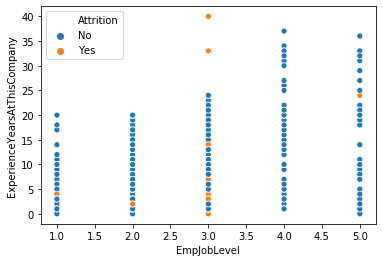

Scatterplot for EmpJobLevel and ExperienceYearsInCurrentRole


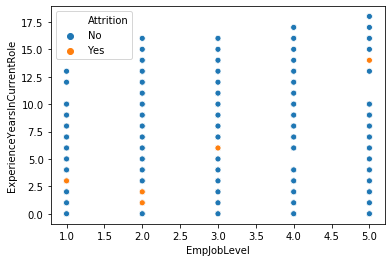

Scatterplot for EmpJobLevel and YearsSinceLastPromotion


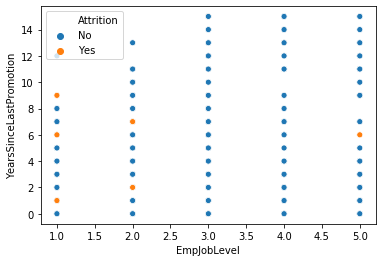

Scatterplot for EmpJobLevel and YearsWithCurrManager


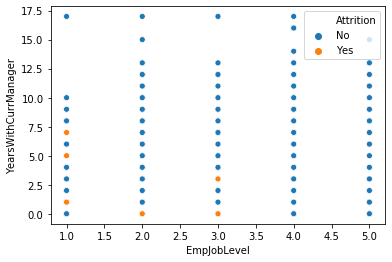

Scatterplot for EmpJobLevel and PerformanceRating


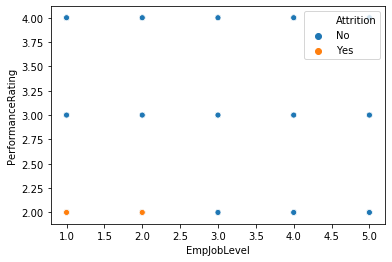

Scatterplot for EmpJobSatisfaction and NumCompaniesWorked


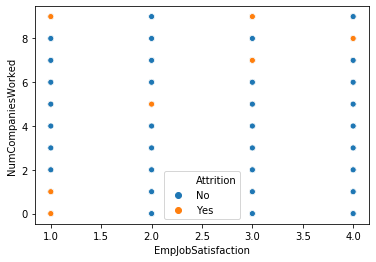

Scatterplot for EmpJobSatisfaction and EmpLastSalaryHikePercent


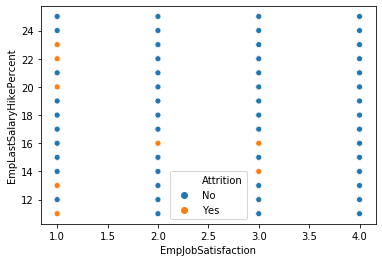

Scatterplot for EmpJobSatisfaction and EmpRelationshipSatisfaction


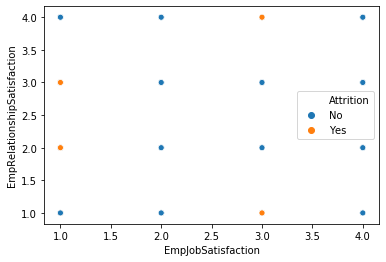

Scatterplot for EmpJobSatisfaction and TotalWorkExperienceInYears


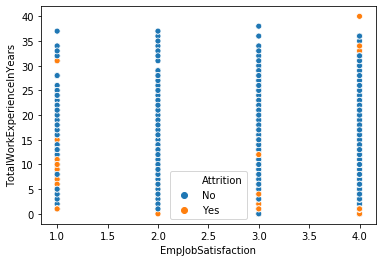

Scatterplot for EmpJobSatisfaction and TrainingTimesLastYear


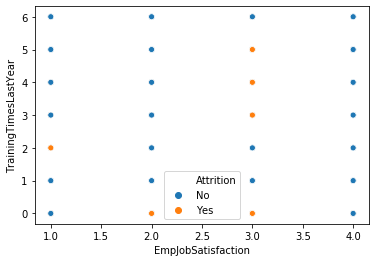

Scatterplot for EmpJobSatisfaction and EmpWorkLifeBalance


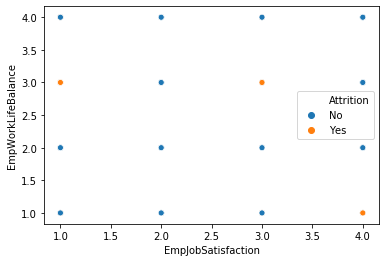

Scatterplot for EmpJobSatisfaction and ExperienceYearsAtThisCompany


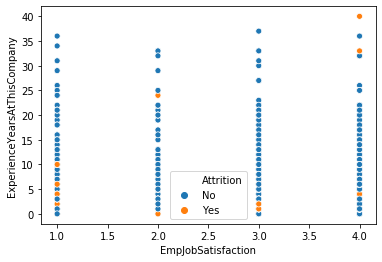

Scatterplot for EmpJobSatisfaction and ExperienceYearsInCurrentRole


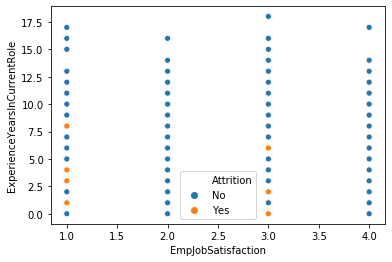

Scatterplot for EmpJobSatisfaction and YearsSinceLastPromotion


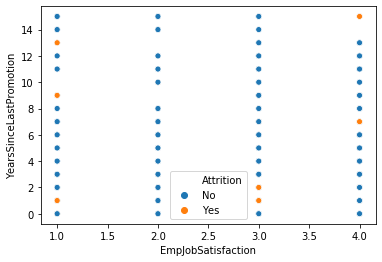

Scatterplot for EmpJobSatisfaction and YearsWithCurrManager


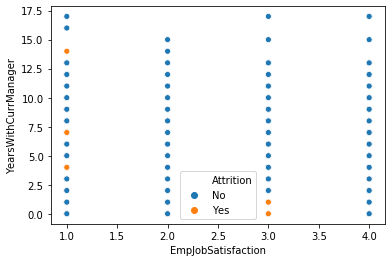

Scatterplot for EmpJobSatisfaction and PerformanceRating


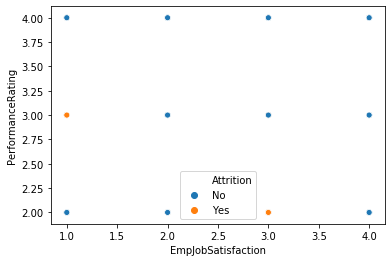

Scatterplot for NumCompaniesWorked and EmpLastSalaryHikePercent


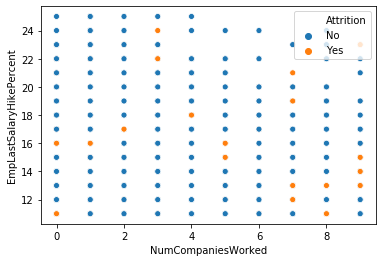

Scatterplot for NumCompaniesWorked and EmpRelationshipSatisfaction


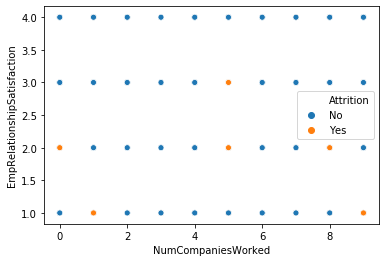

Scatterplot for NumCompaniesWorked and TotalWorkExperienceInYears


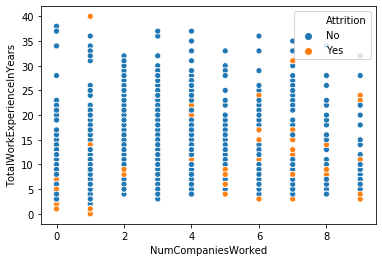

Scatterplot for NumCompaniesWorked and TrainingTimesLastYear


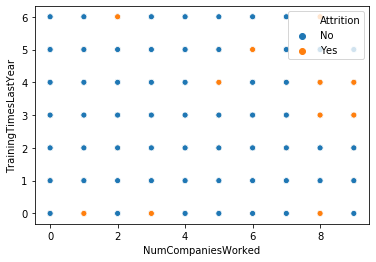

Scatterplot for NumCompaniesWorked and EmpWorkLifeBalance


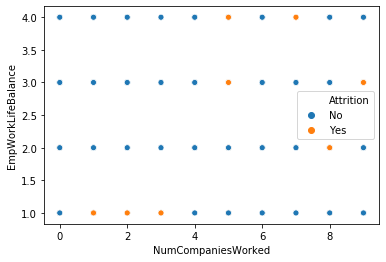

Scatterplot for NumCompaniesWorked and ExperienceYearsAtThisCompany


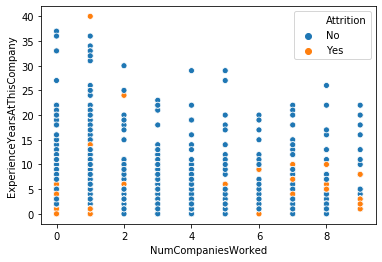

Scatterplot for NumCompaniesWorked and ExperienceYearsInCurrentRole


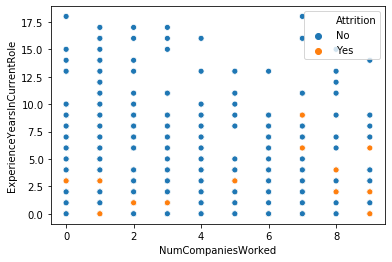

Scatterplot for NumCompaniesWorked and YearsSinceLastPromotion


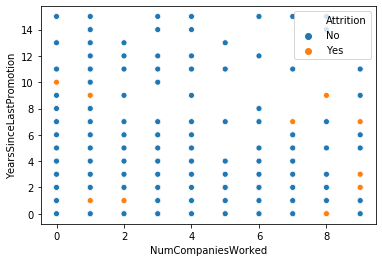

Scatterplot for NumCompaniesWorked and YearsWithCurrManager


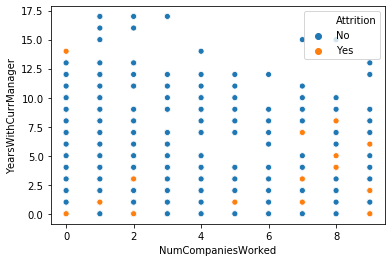

Scatterplot for NumCompaniesWorked and PerformanceRating


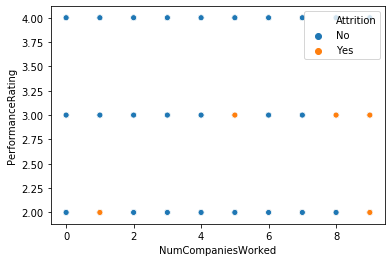

Scatterplot for EmpLastSalaryHikePercent and EmpRelationshipSatisfaction


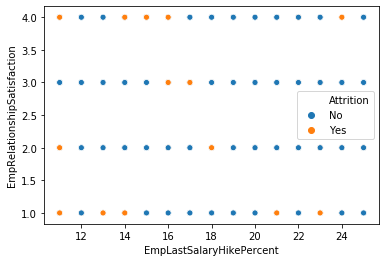

Scatterplot for EmpLastSalaryHikePercent and TotalWorkExperienceInYears


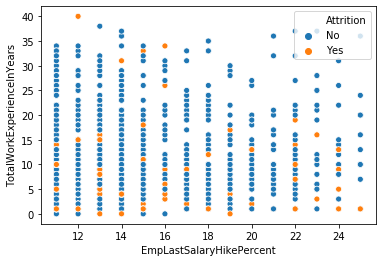

Scatterplot for EmpLastSalaryHikePercent and TrainingTimesLastYear


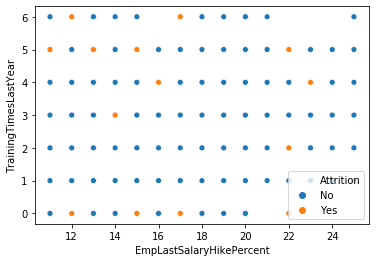

Scatterplot for EmpLastSalaryHikePercent and EmpWorkLifeBalance


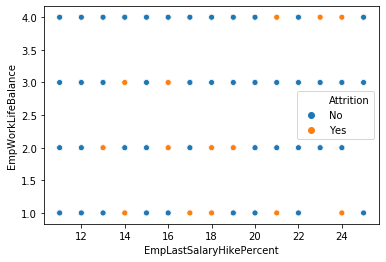

Scatterplot for EmpLastSalaryHikePercent and ExperienceYearsAtThisCompany


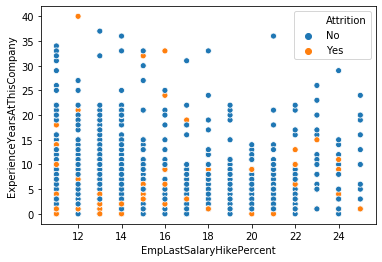

Scatterplot for EmpLastSalaryHikePercent and ExperienceYearsInCurrentRole


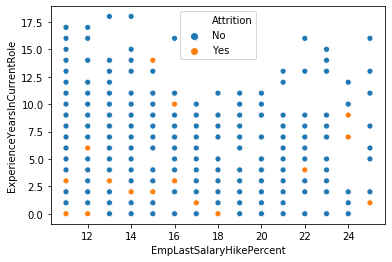

Scatterplot for EmpLastSalaryHikePercent and YearsSinceLastPromotion


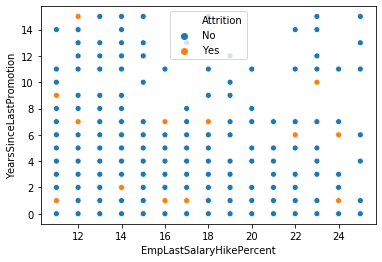

Scatterplot for EmpLastSalaryHikePercent and YearsWithCurrManager


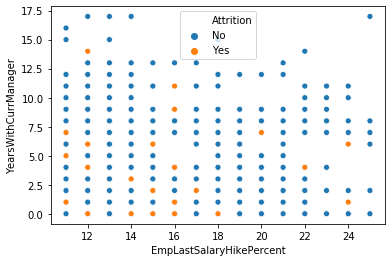

Scatterplot for EmpLastSalaryHikePercent and PerformanceRating


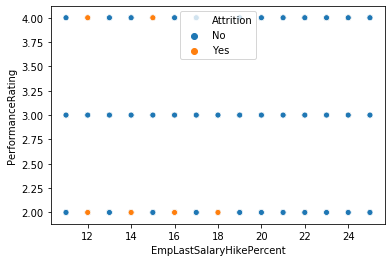

Scatterplot for EmpRelationshipSatisfaction and TotalWorkExperienceInYears


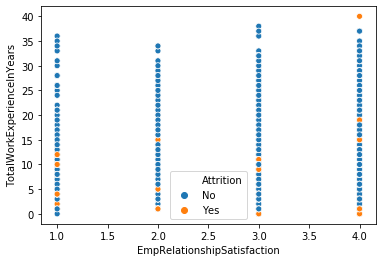

Scatterplot for EmpRelationshipSatisfaction and TrainingTimesLastYear


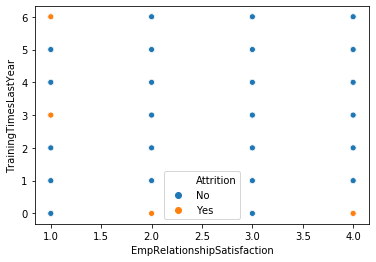

Scatterplot for EmpRelationshipSatisfaction and EmpWorkLifeBalance


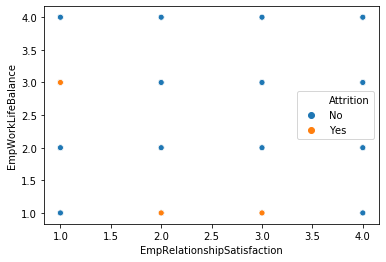

Scatterplot for EmpRelationshipSatisfaction and ExperienceYearsAtThisCompany


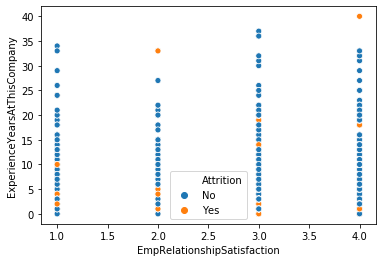

Scatterplot for EmpRelationshipSatisfaction and ExperienceYearsInCurrentRole


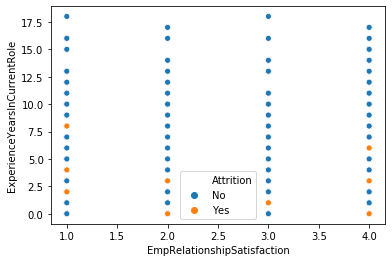

Scatterplot for EmpRelationshipSatisfaction and YearsSinceLastPromotion


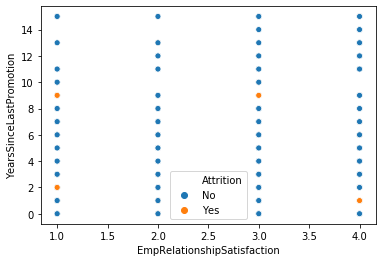

Scatterplot for EmpRelationshipSatisfaction and YearsWithCurrManager


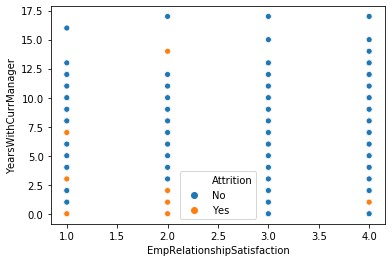

Scatterplot for EmpRelationshipSatisfaction and PerformanceRating


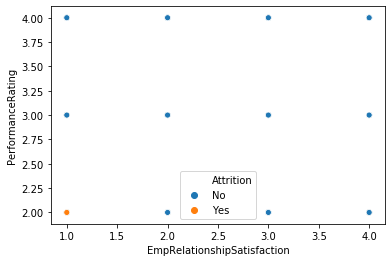

Scatterplot for TotalWorkExperienceInYears and TrainingTimesLastYear


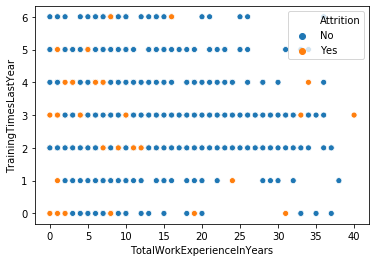

Scatterplot for TotalWorkExperienceInYears and EmpWorkLifeBalance


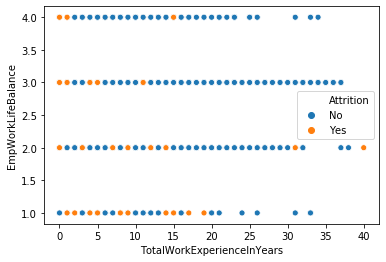

Scatterplot for TotalWorkExperienceInYears and ExperienceYearsAtThisCompany


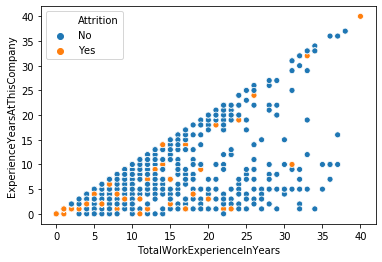

Scatterplot for TotalWorkExperienceInYears and ExperienceYearsInCurrentRole


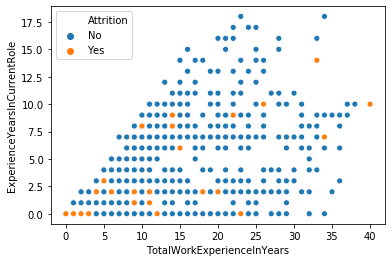

Scatterplot for TotalWorkExperienceInYears and YearsSinceLastPromotion


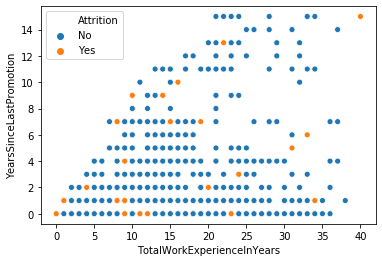

Scatterplot for TotalWorkExperienceInYears and YearsWithCurrManager


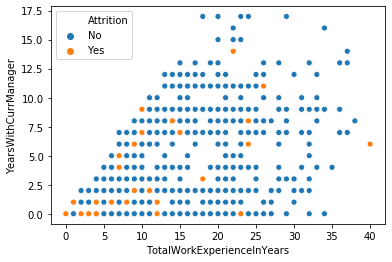

Scatterplot for TotalWorkExperienceInYears and PerformanceRating


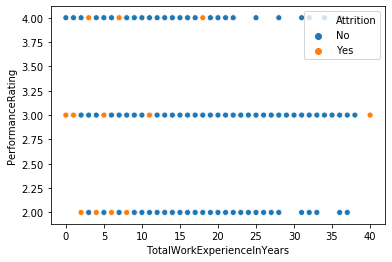

Scatterplot for TrainingTimesLastYear and EmpWorkLifeBalance


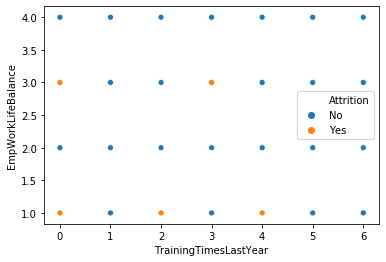

Scatterplot for TrainingTimesLastYear and ExperienceYearsAtThisCompany


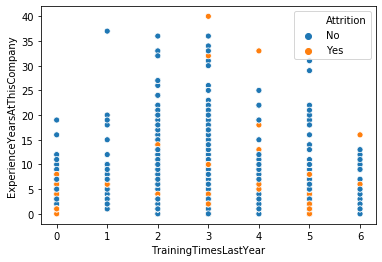

Scatterplot for TrainingTimesLastYear and ExperienceYearsInCurrentRole


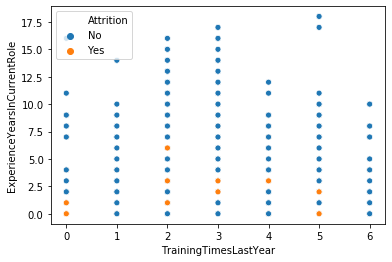

Scatterplot for TrainingTimesLastYear and YearsSinceLastPromotion


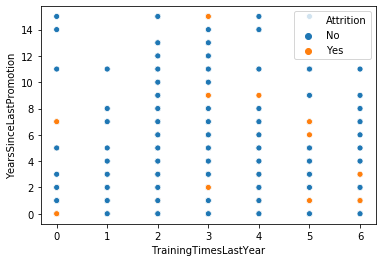

Scatterplot for TrainingTimesLastYear and YearsWithCurrManager


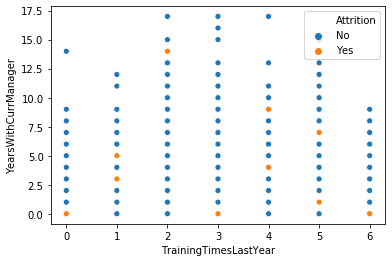

Scatterplot for TrainingTimesLastYear and PerformanceRating


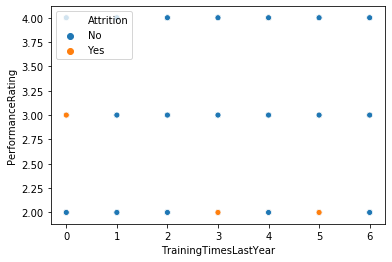

Scatterplot for EmpWorkLifeBalance and ExperienceYearsAtThisCompany


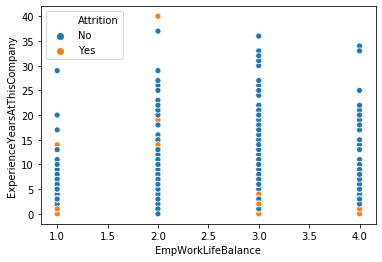

Scatterplot for EmpWorkLifeBalance and ExperienceYearsInCurrentRole


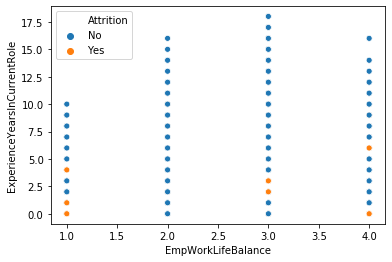

Scatterplot for EmpWorkLifeBalance and YearsSinceLastPromotion


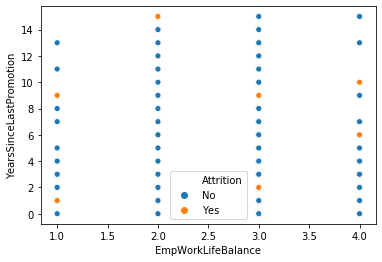

Scatterplot for EmpWorkLifeBalance and YearsWithCurrManager


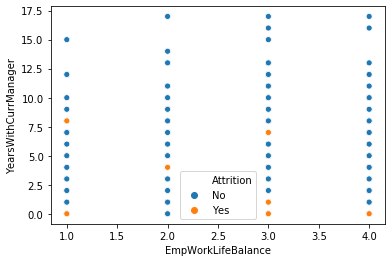

Scatterplot for EmpWorkLifeBalance and PerformanceRating


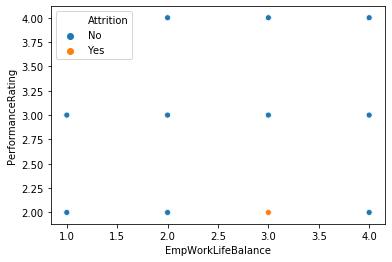

Scatterplot for ExperienceYearsAtThisCompany and ExperienceYearsInCurrentRole


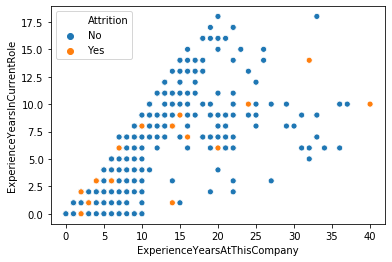

Scatterplot for ExperienceYearsAtThisCompany and YearsSinceLastPromotion


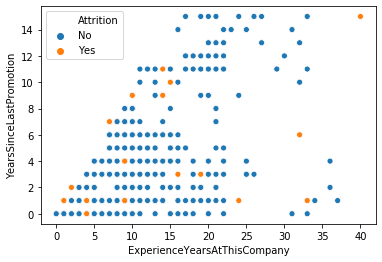

Scatterplot for ExperienceYearsAtThisCompany and YearsWithCurrManager


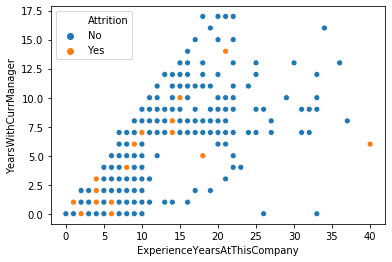

Scatterplot for ExperienceYearsAtThisCompany and PerformanceRating


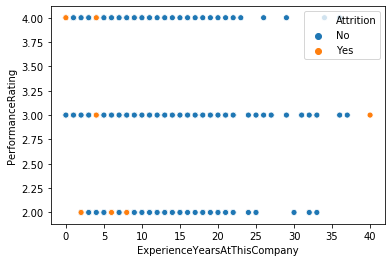

Scatterplot for ExperienceYearsInCurrentRole and YearsSinceLastPromotion


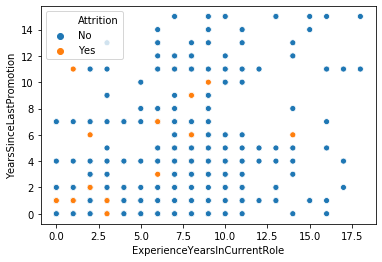

Scatterplot for ExperienceYearsInCurrentRole and YearsWithCurrManager


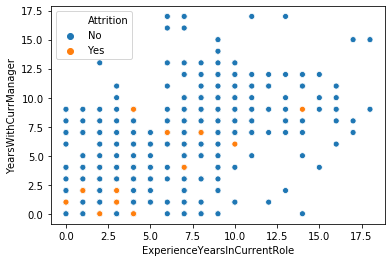

Scatterplot for ExperienceYearsInCurrentRole and PerformanceRating


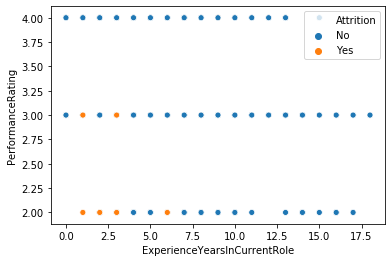

Scatterplot for YearsSinceLastPromotion and YearsWithCurrManager


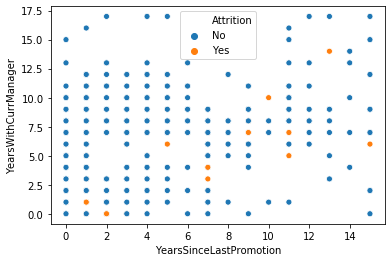

Scatterplot for YearsSinceLastPromotion and PerformanceRating


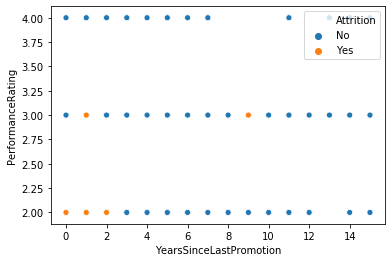

Scatterplot for YearsWithCurrManager and PerformanceRating


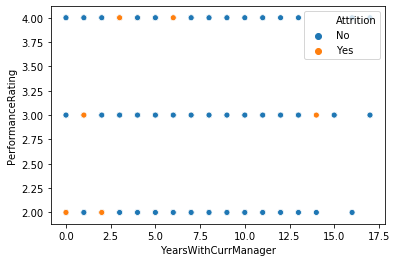

In [14]:
for i in range ( len ( numerical ) ):
    for j in range ( i , len ( numerical ) ):
        if i != j:
            print ( "Scatterplot for {} and {}" .format ( numerical [ i ] , numerical [ j ] ) )
            sns.scatterplot ( data [ numerical [ i ] ] , data [ numerical [ j ] ] , hue = data [ "Attrition" ] )
            plt.show ( )

Boxplot for Gender and Age


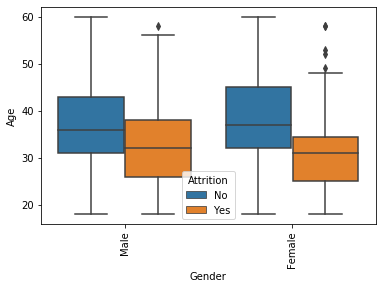

Boxplot for Gender and DistanceFromHome


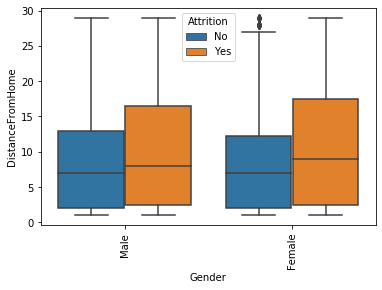

Boxplot for Gender and EmpEducationLevel


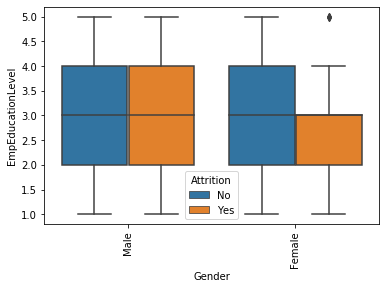

Boxplot for Gender and EmpEnvironmentSatisfaction


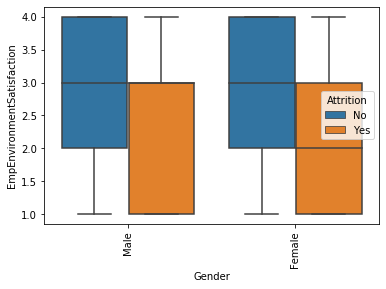

Boxplot for Gender and EmpHourlyRate


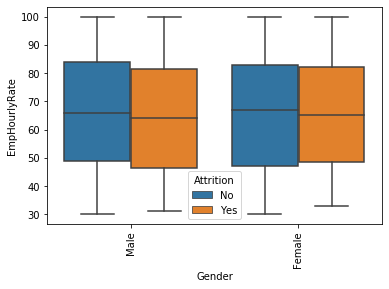

Boxplot for Gender and EmpJobInvolvement


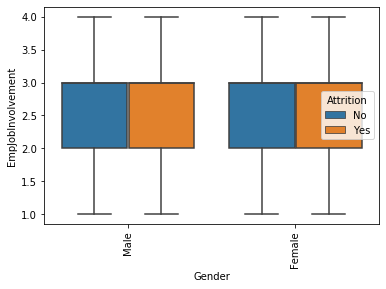

Boxplot for Gender and EmpJobLevel


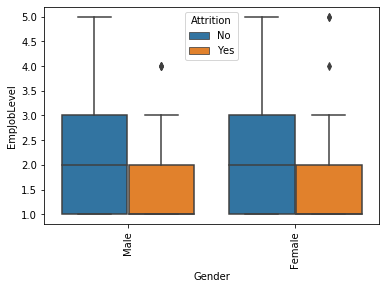

Boxplot for Gender and EmpJobSatisfaction


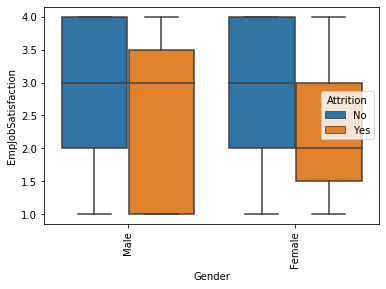

Boxplot for Gender and NumCompaniesWorked


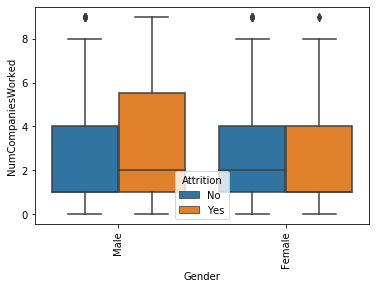

Boxplot for Gender and EmpLastSalaryHikePercent


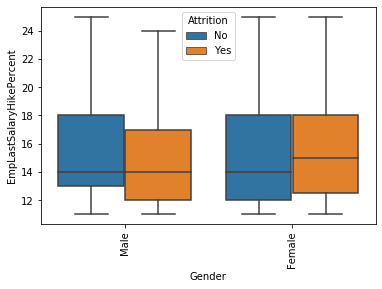

Boxplot for Gender and EmpRelationshipSatisfaction


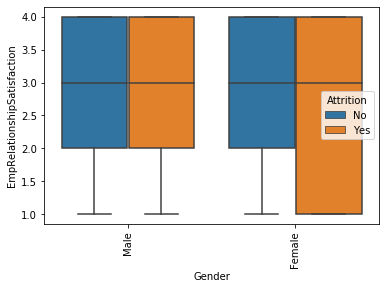

Boxplot for Gender and TotalWorkExperienceInYears


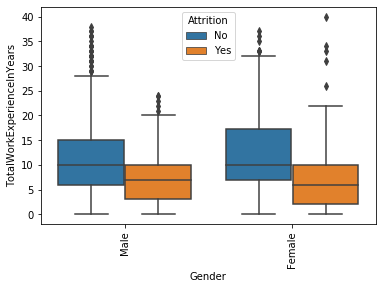

Boxplot for Gender and TrainingTimesLastYear


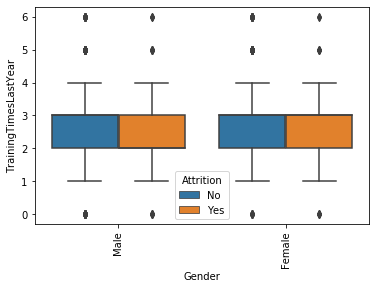

Boxplot for Gender and EmpWorkLifeBalance


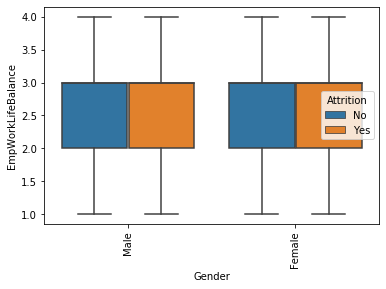

Boxplot for Gender and ExperienceYearsAtThisCompany


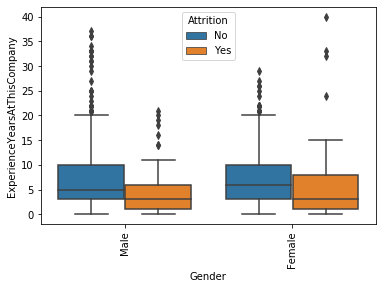

Boxplot for Gender and ExperienceYearsInCurrentRole


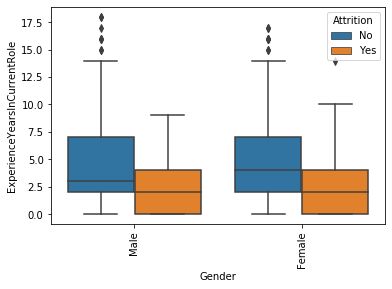

Boxplot for Gender and YearsSinceLastPromotion


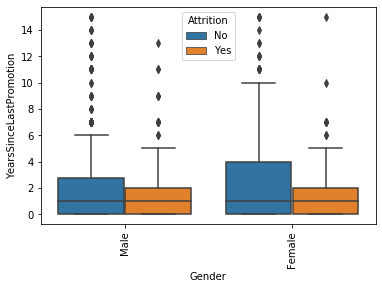

Boxplot for Gender and YearsWithCurrManager


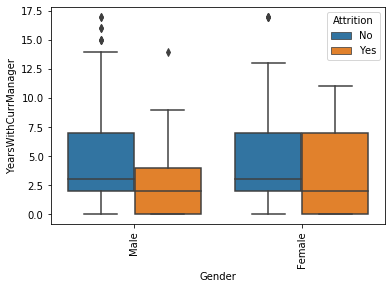

Boxplot for Gender and PerformanceRating


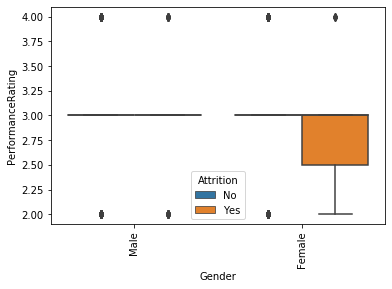

Boxplot for EducationBackground and Age


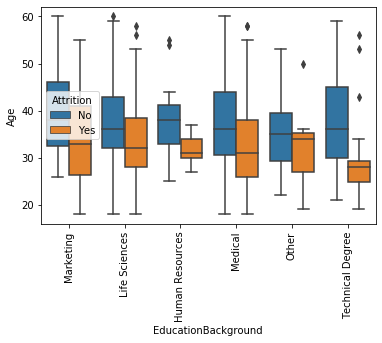

Boxplot for EducationBackground and DistanceFromHome


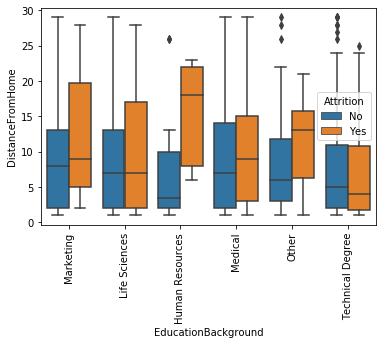

Boxplot for EducationBackground and EmpEducationLevel


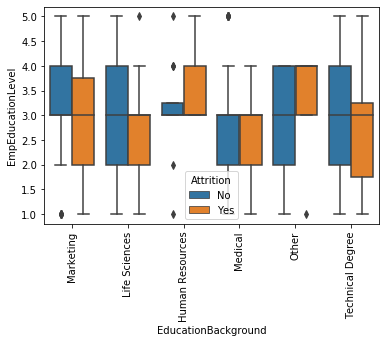

Boxplot for EducationBackground and EmpEnvironmentSatisfaction


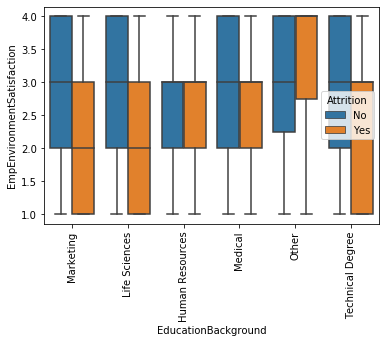

Boxplot for EducationBackground and EmpHourlyRate


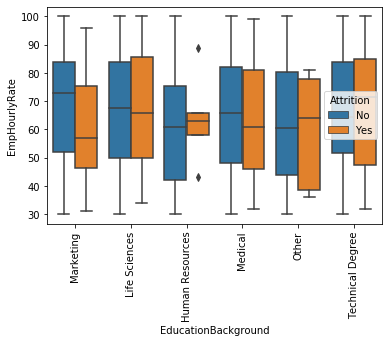

Boxplot for EducationBackground and EmpJobInvolvement


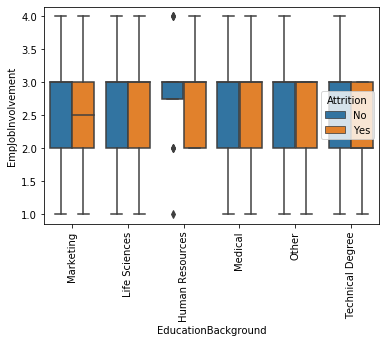

Boxplot for EducationBackground and EmpJobLevel


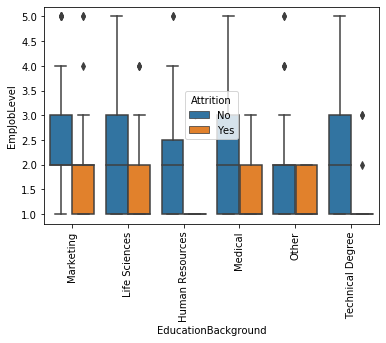

Boxplot for EducationBackground and EmpJobSatisfaction


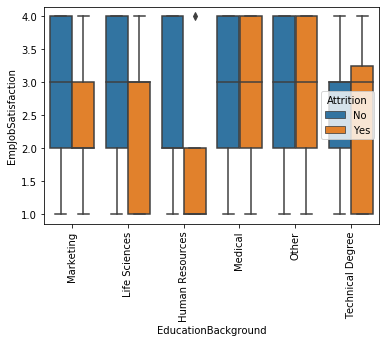

Boxplot for EducationBackground and NumCompaniesWorked


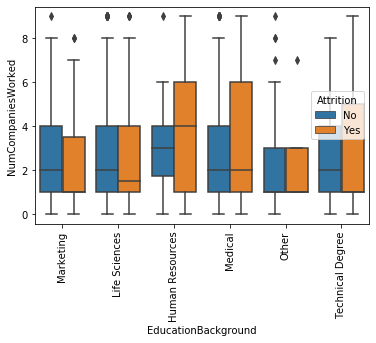

Boxplot for EducationBackground and EmpLastSalaryHikePercent


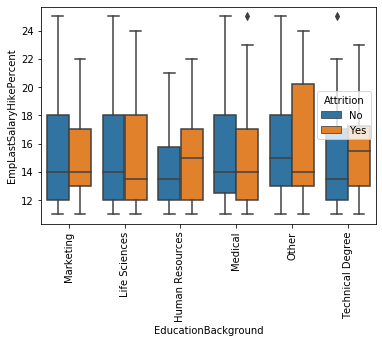

Boxplot for EducationBackground and EmpRelationshipSatisfaction


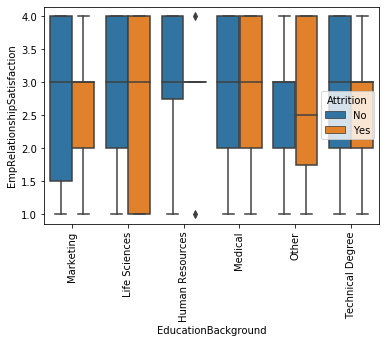

Boxplot for EducationBackground and TotalWorkExperienceInYears


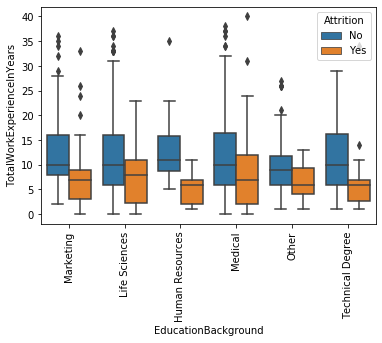

Boxplot for EducationBackground and TrainingTimesLastYear


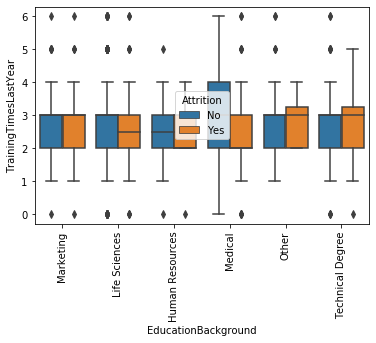

Boxplot for EducationBackground and EmpWorkLifeBalance


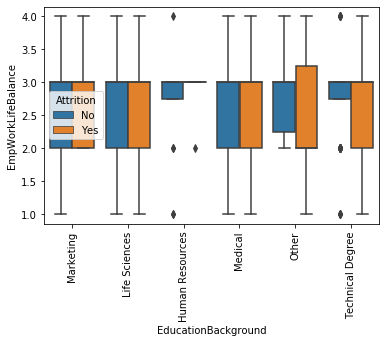

Boxplot for EducationBackground and ExperienceYearsAtThisCompany


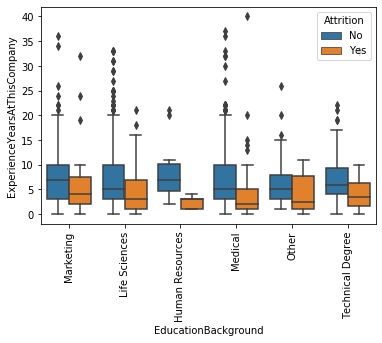

Boxplot for EducationBackground and ExperienceYearsInCurrentRole


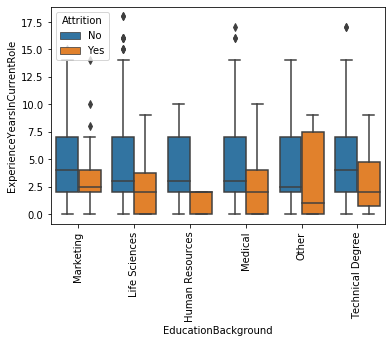

Boxplot for EducationBackground and YearsSinceLastPromotion


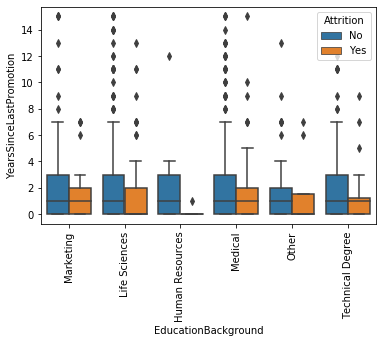

Boxplot for EducationBackground and YearsWithCurrManager


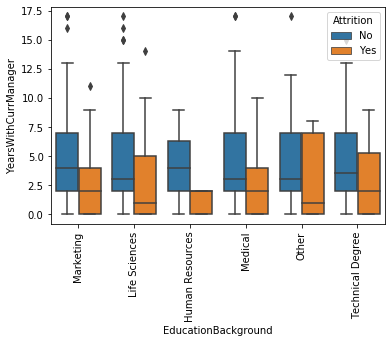

Boxplot for EducationBackground and PerformanceRating


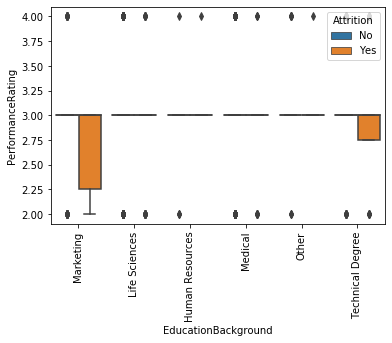

Boxplot for MaritalStatus and Age


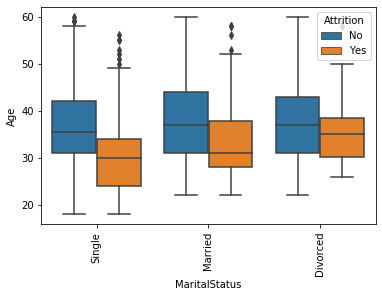

Boxplot for MaritalStatus and DistanceFromHome


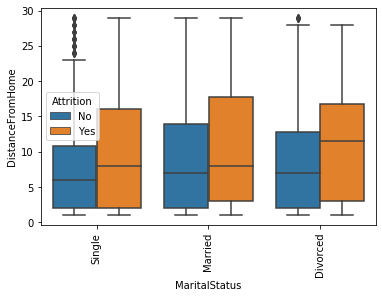

Boxplot for MaritalStatus and EmpEducationLevel


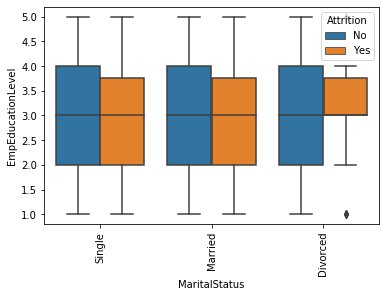

Boxplot for MaritalStatus and EmpEnvironmentSatisfaction


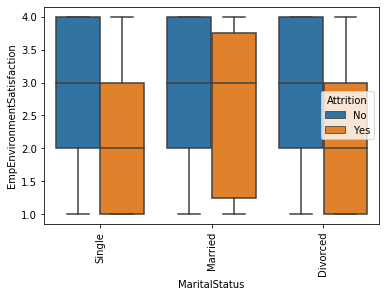

Boxplot for MaritalStatus and EmpHourlyRate


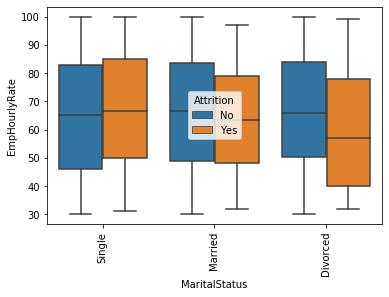

Boxplot for MaritalStatus and EmpJobInvolvement


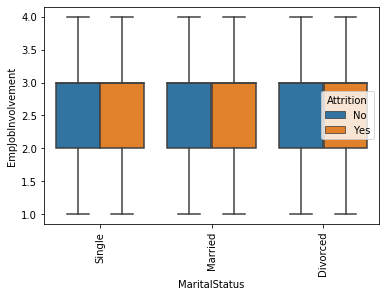

Boxplot for MaritalStatus and EmpJobLevel


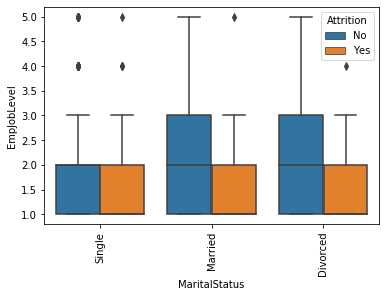

Boxplot for MaritalStatus and EmpJobSatisfaction


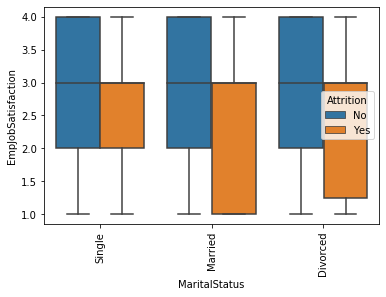

Boxplot for MaritalStatus and NumCompaniesWorked


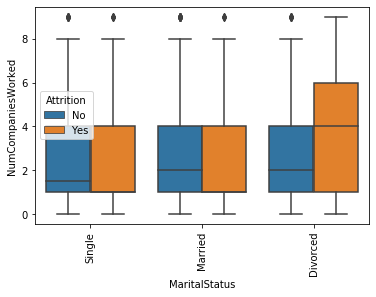

Boxplot for MaritalStatus and EmpLastSalaryHikePercent


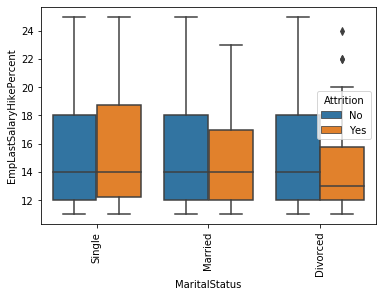

Boxplot for MaritalStatus and EmpRelationshipSatisfaction


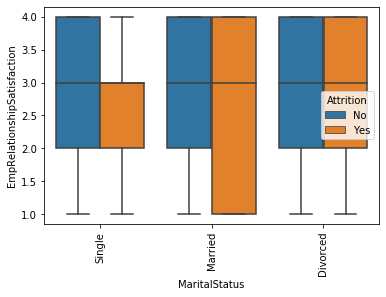

Boxplot for MaritalStatus and TotalWorkExperienceInYears


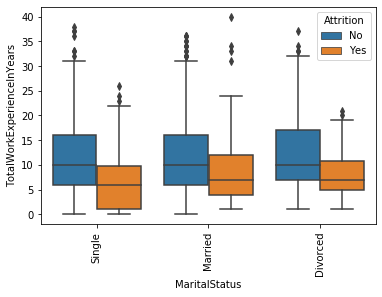

Boxplot for MaritalStatus and TrainingTimesLastYear


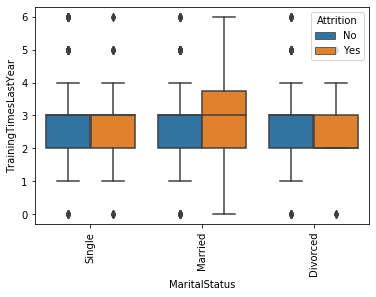

Boxplot for MaritalStatus and EmpWorkLifeBalance


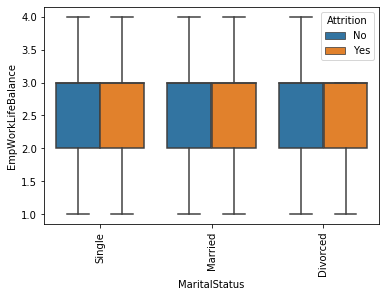

Boxplot for MaritalStatus and ExperienceYearsAtThisCompany


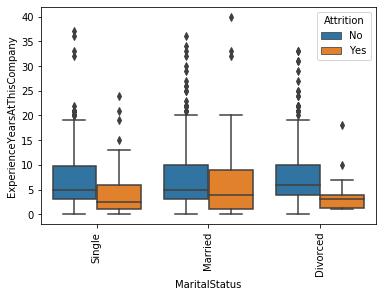

Boxplot for MaritalStatus and ExperienceYearsInCurrentRole


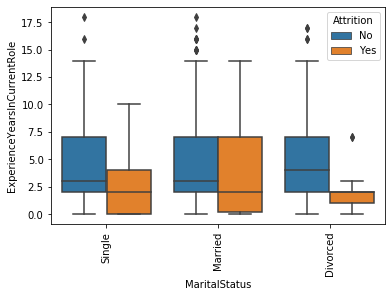

Boxplot for MaritalStatus and YearsSinceLastPromotion


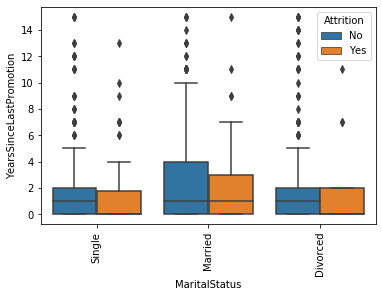

Boxplot for MaritalStatus and YearsWithCurrManager


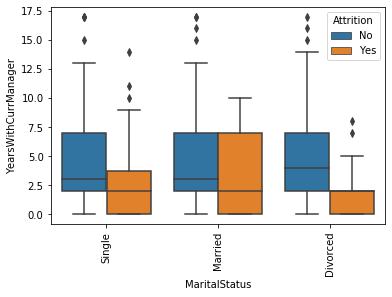

Boxplot for MaritalStatus and PerformanceRating


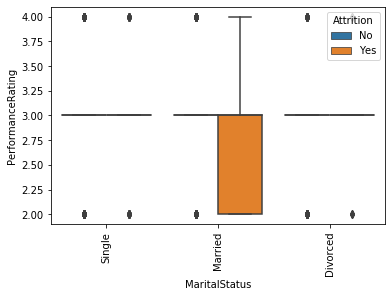

Boxplot for EmpDepartment and Age


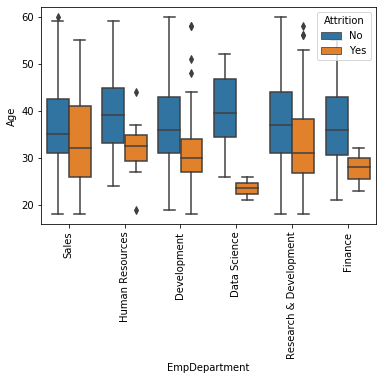

Boxplot for EmpDepartment and DistanceFromHome


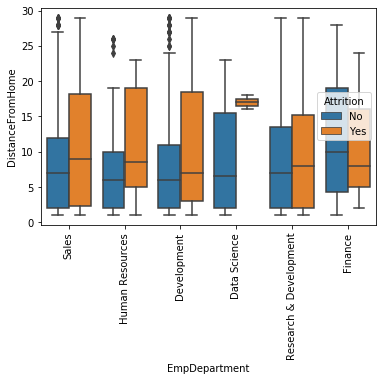

Boxplot for EmpDepartment and EmpEducationLevel


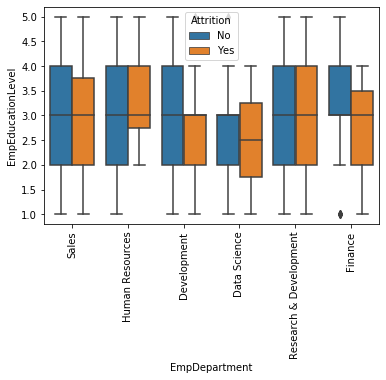

Boxplot for EmpDepartment and EmpEnvironmentSatisfaction


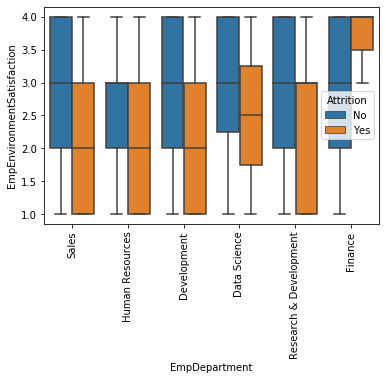

Boxplot for EmpDepartment and EmpHourlyRate


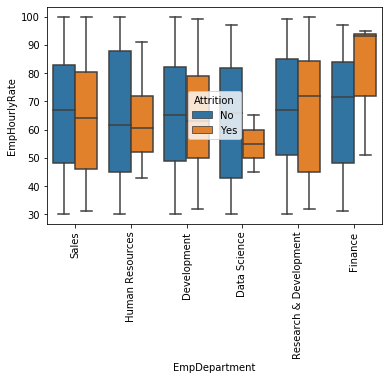

Boxplot for EmpDepartment and EmpJobInvolvement


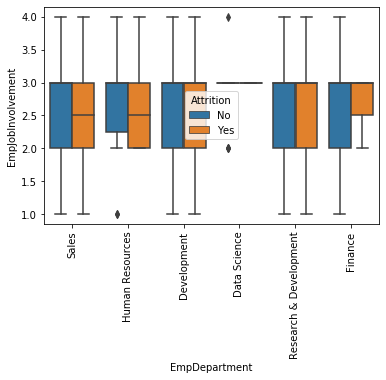

Boxplot for EmpDepartment and EmpJobLevel


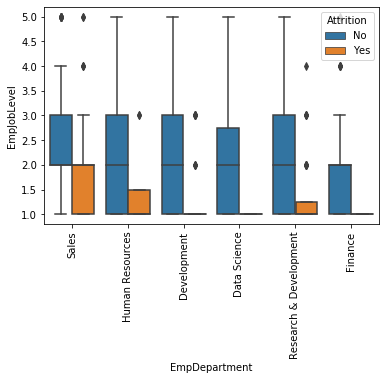

Boxplot for EmpDepartment and EmpJobSatisfaction


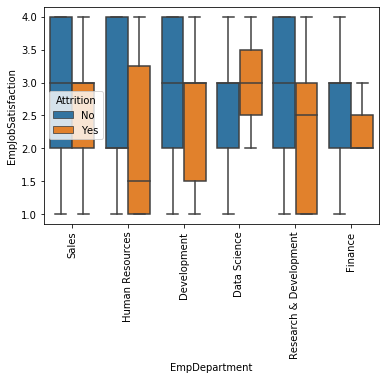

Boxplot for EmpDepartment and NumCompaniesWorked


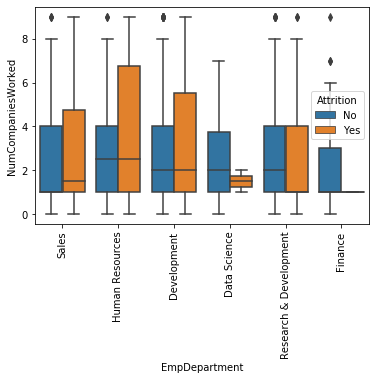

Boxplot for EmpDepartment and EmpLastSalaryHikePercent


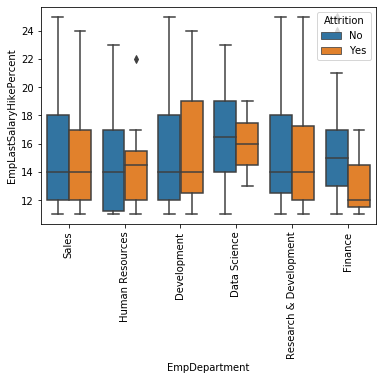

Boxplot for EmpDepartment and EmpRelationshipSatisfaction


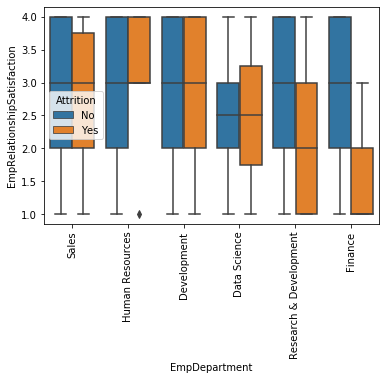

Boxplot for EmpDepartment and TotalWorkExperienceInYears


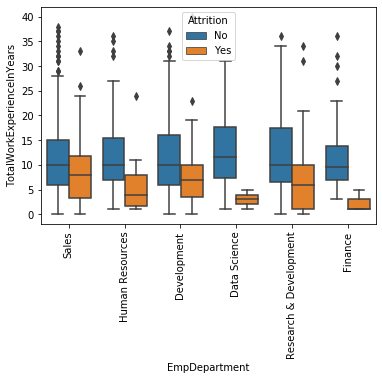

Boxplot for EmpDepartment and TrainingTimesLastYear


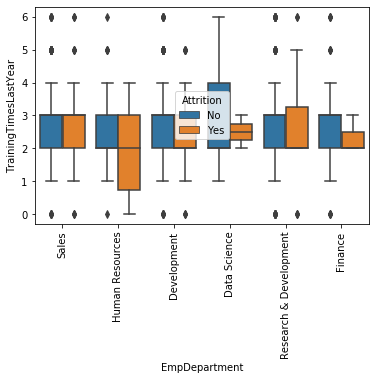

Boxplot for EmpDepartment and EmpWorkLifeBalance


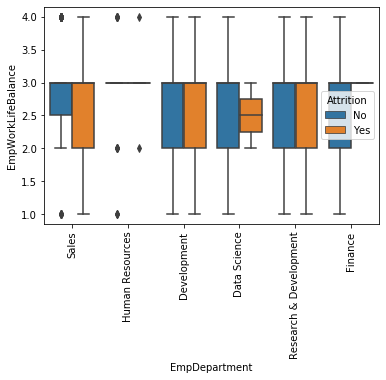

Boxplot for EmpDepartment and ExperienceYearsAtThisCompany


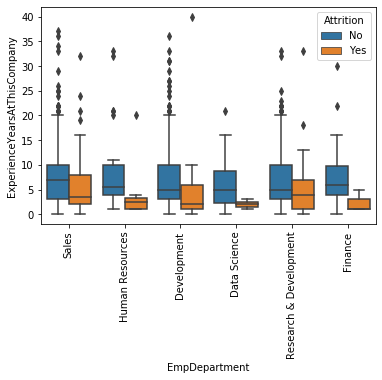

Boxplot for EmpDepartment and ExperienceYearsInCurrentRole


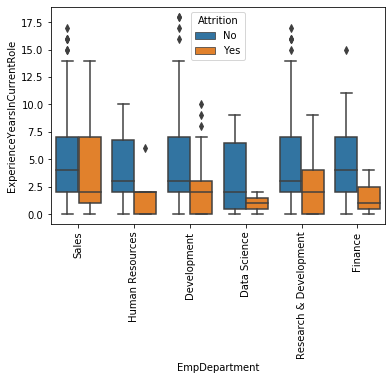

Boxplot for EmpDepartment and YearsSinceLastPromotion


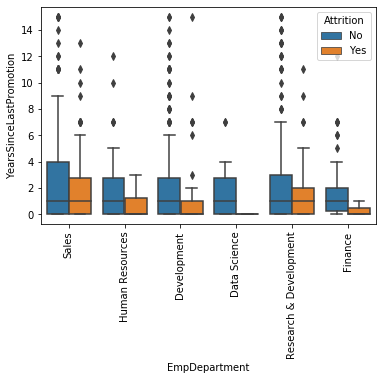

Boxplot for EmpDepartment and YearsWithCurrManager


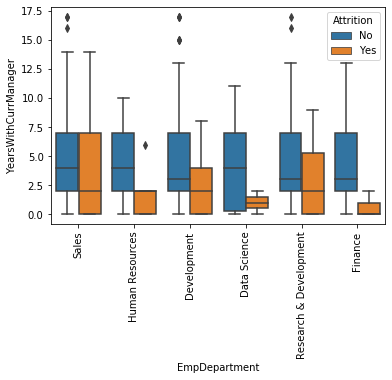

Boxplot for EmpDepartment and PerformanceRating


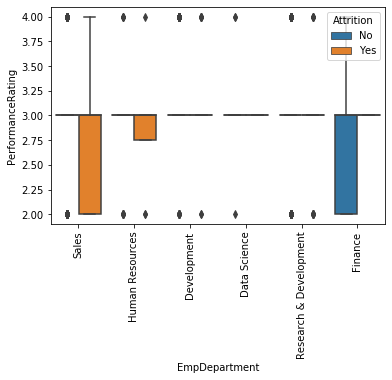

Boxplot for EmpJobRole and Age


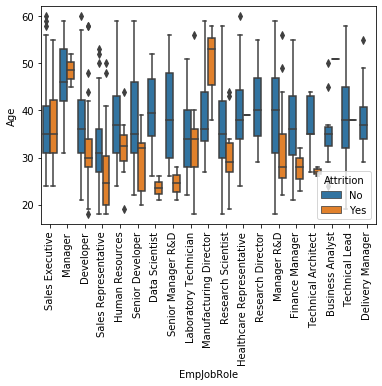

Boxplot for EmpJobRole and DistanceFromHome


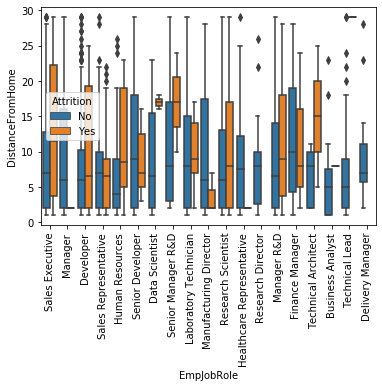

Boxplot for EmpJobRole and EmpEducationLevel


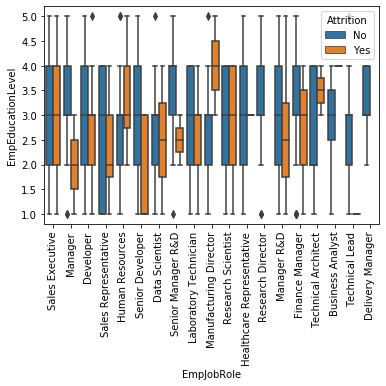

Boxplot for EmpJobRole and EmpEnvironmentSatisfaction


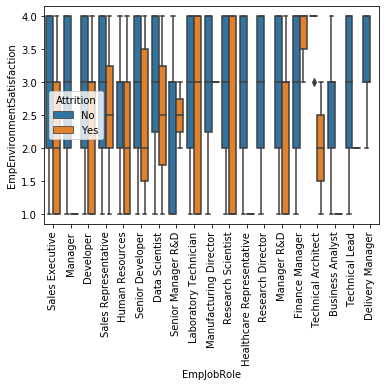

Boxplot for EmpJobRole and EmpHourlyRate


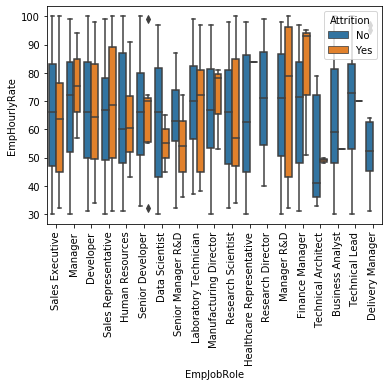

Boxplot for EmpJobRole and EmpJobInvolvement


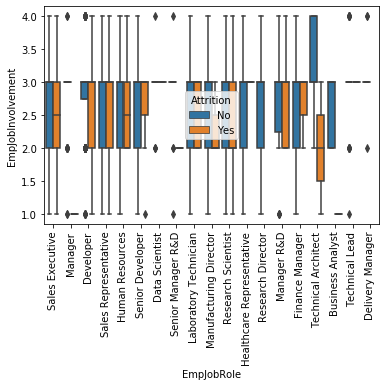

Boxplot for EmpJobRole and EmpJobLevel


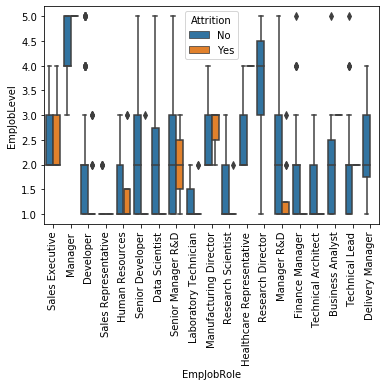

Boxplot for EmpJobRole and EmpJobSatisfaction


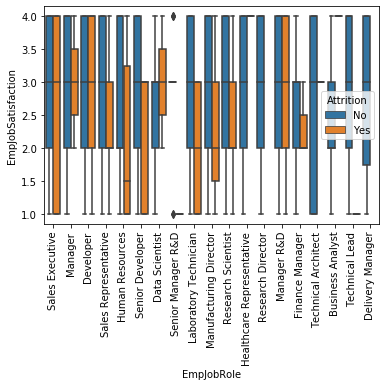

Boxplot for EmpJobRole and NumCompaniesWorked


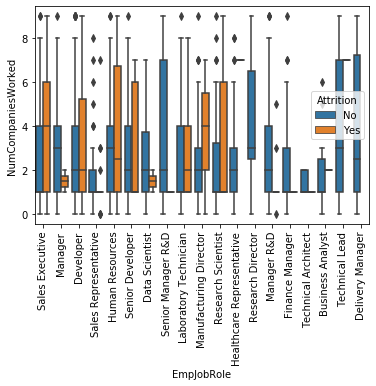

Boxplot for EmpJobRole and EmpLastSalaryHikePercent


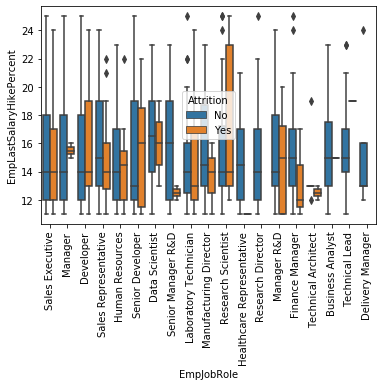

Boxplot for EmpJobRole and EmpRelationshipSatisfaction


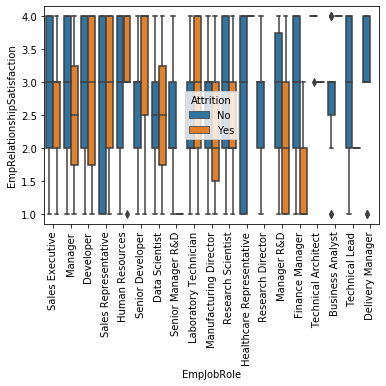

Boxplot for EmpJobRole and TotalWorkExperienceInYears


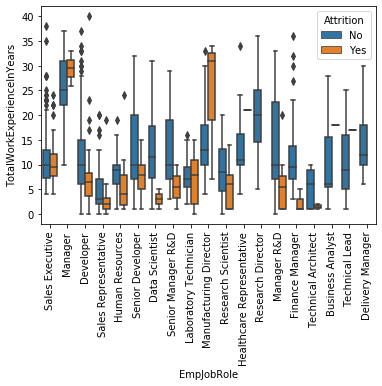

Boxplot for EmpJobRole and TrainingTimesLastYear


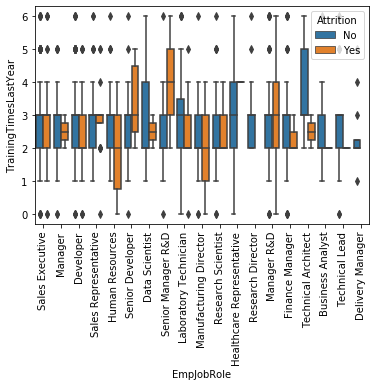

Boxplot for EmpJobRole and EmpWorkLifeBalance


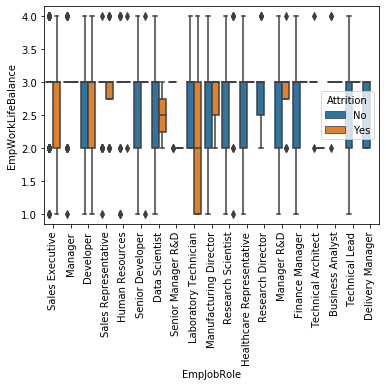

Boxplot for EmpJobRole and ExperienceYearsAtThisCompany


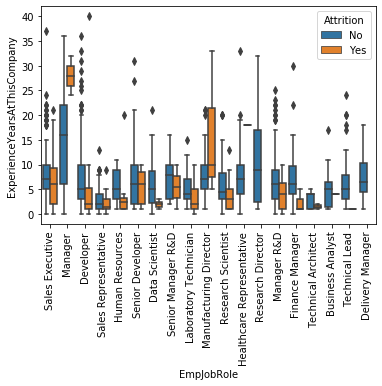

Boxplot for EmpJobRole and ExperienceYearsInCurrentRole


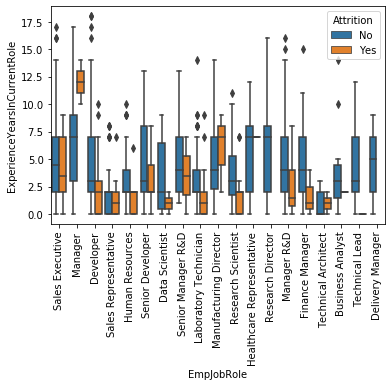

Boxplot for EmpJobRole and YearsSinceLastPromotion


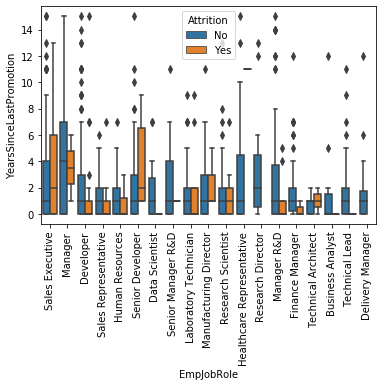

Boxplot for EmpJobRole and YearsWithCurrManager


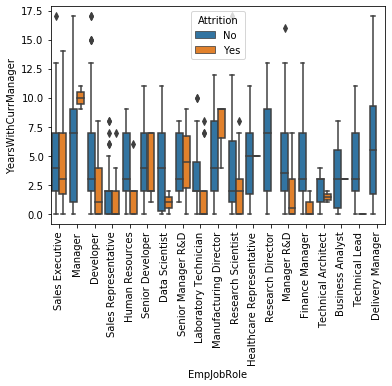

Boxplot for EmpJobRole and PerformanceRating


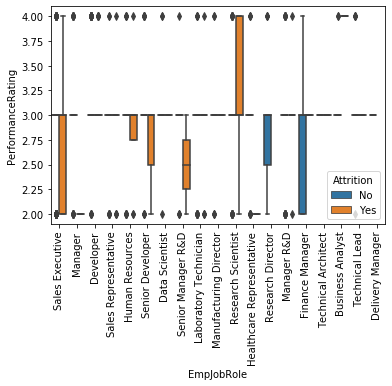

Boxplot for BusinessTravelFrequency and Age


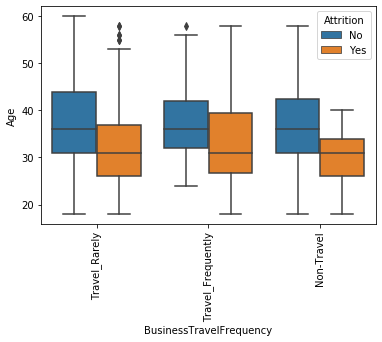

Boxplot for BusinessTravelFrequency and DistanceFromHome


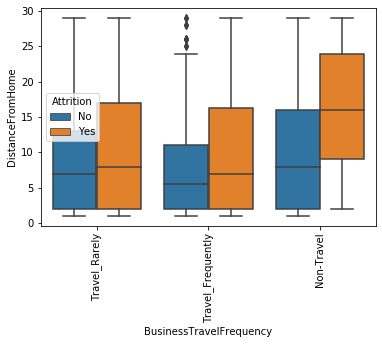

Boxplot for BusinessTravelFrequency and EmpEducationLevel


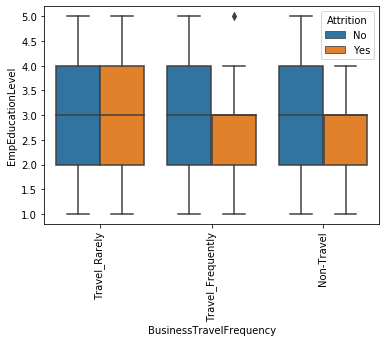

Boxplot for BusinessTravelFrequency and EmpEnvironmentSatisfaction


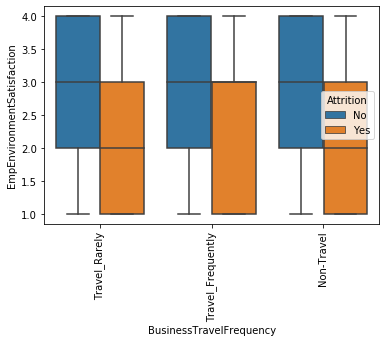

Boxplot for BusinessTravelFrequency and EmpHourlyRate


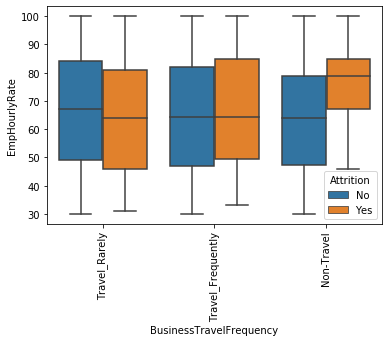

Boxplot for BusinessTravelFrequency and EmpJobInvolvement


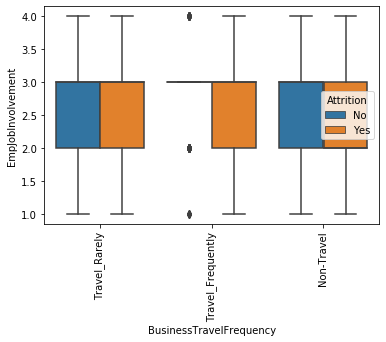

Boxplot for BusinessTravelFrequency and EmpJobLevel


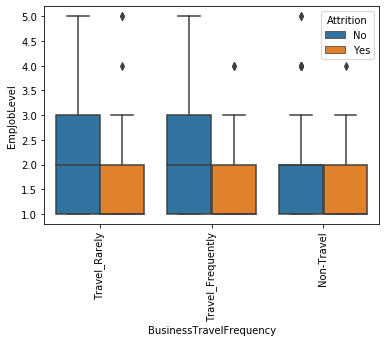

Boxplot for BusinessTravelFrequency and EmpJobSatisfaction


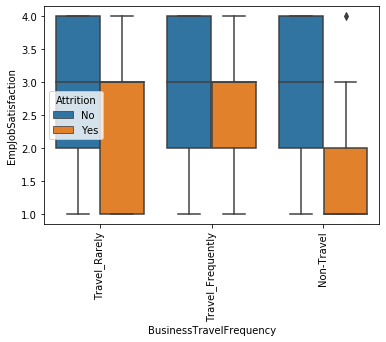

Boxplot for BusinessTravelFrequency and NumCompaniesWorked


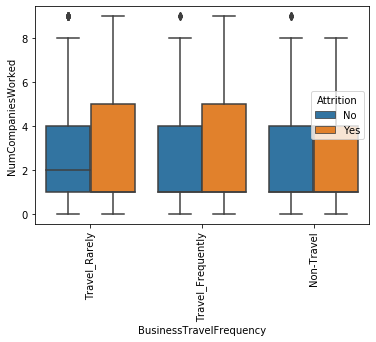

Boxplot for BusinessTravelFrequency and EmpLastSalaryHikePercent


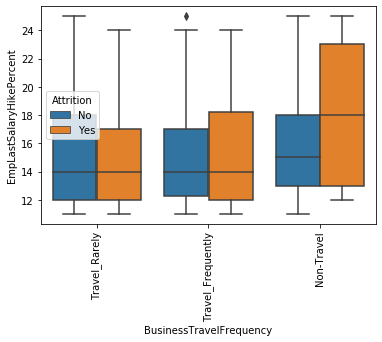

Boxplot for BusinessTravelFrequency and EmpRelationshipSatisfaction


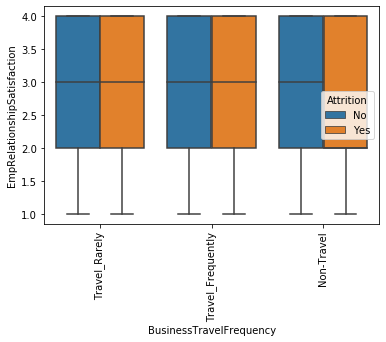

Boxplot for BusinessTravelFrequency and TotalWorkExperienceInYears


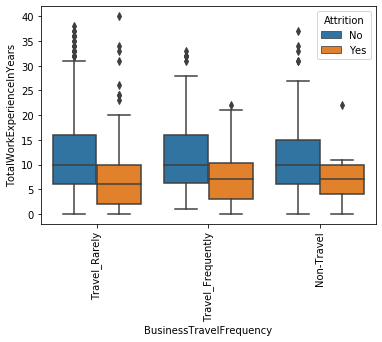

Boxplot for BusinessTravelFrequency and TrainingTimesLastYear


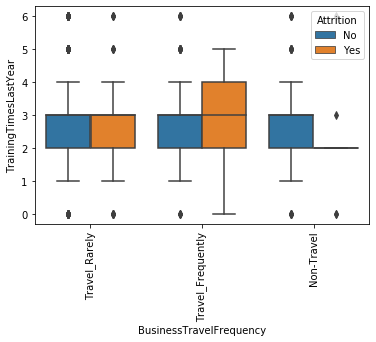

Boxplot for BusinessTravelFrequency and EmpWorkLifeBalance


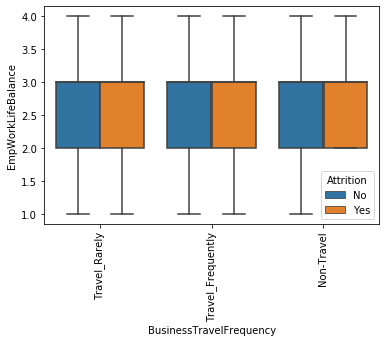

Boxplot for BusinessTravelFrequency and ExperienceYearsAtThisCompany


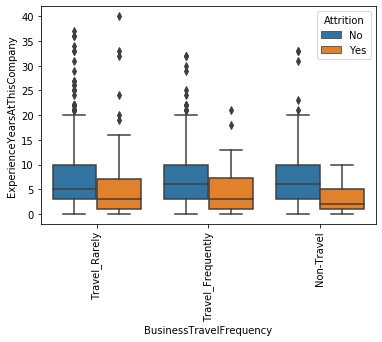

Boxplot for BusinessTravelFrequency and ExperienceYearsInCurrentRole


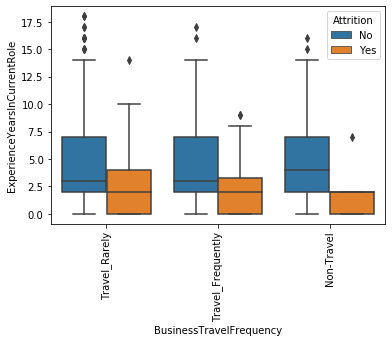

Boxplot for BusinessTravelFrequency and YearsSinceLastPromotion


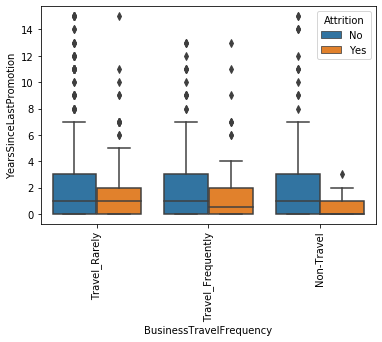

Boxplot for BusinessTravelFrequency and YearsWithCurrManager


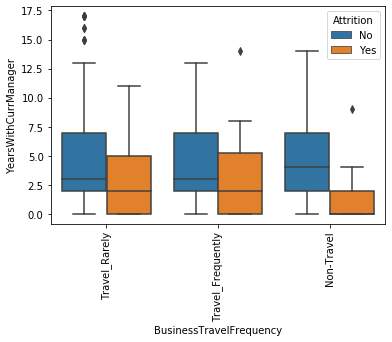

Boxplot for BusinessTravelFrequency and PerformanceRating


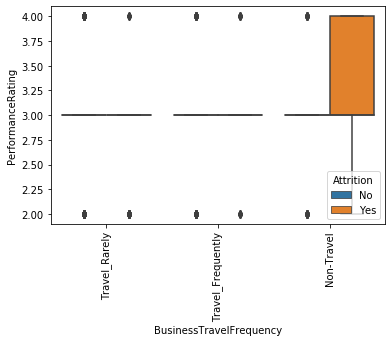

Boxplot for OverTime and Age


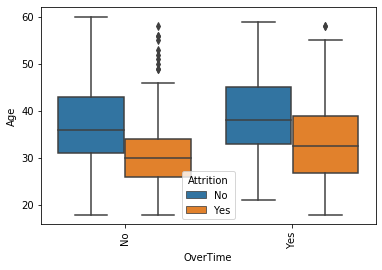

Boxplot for OverTime and DistanceFromHome


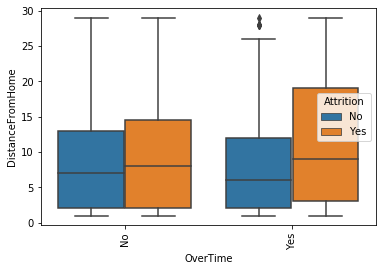

Boxplot for OverTime and EmpEducationLevel


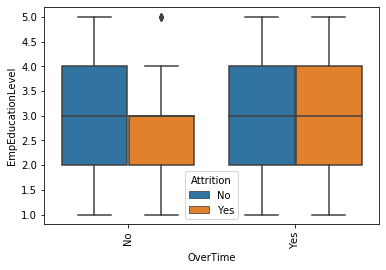

Boxplot for OverTime and EmpEnvironmentSatisfaction


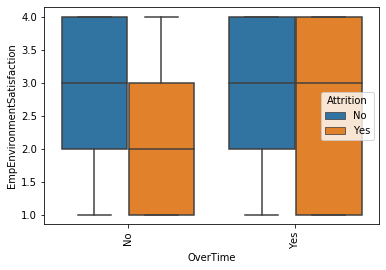

Boxplot for OverTime and EmpHourlyRate


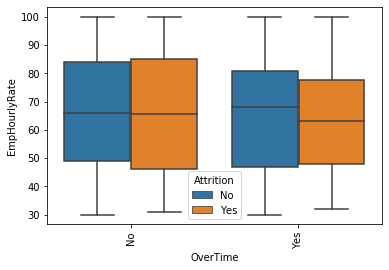

Boxplot for OverTime and EmpJobInvolvement


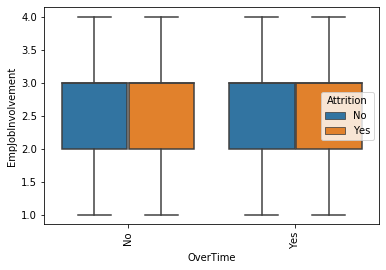

Boxplot for OverTime and EmpJobLevel


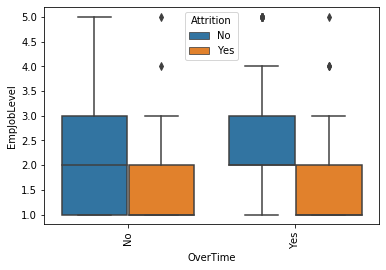

Boxplot for OverTime and EmpJobSatisfaction


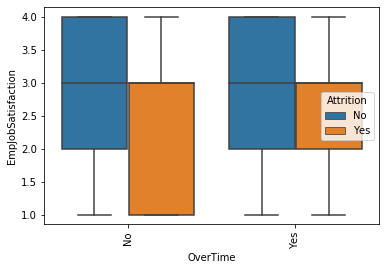

Boxplot for OverTime and NumCompaniesWorked


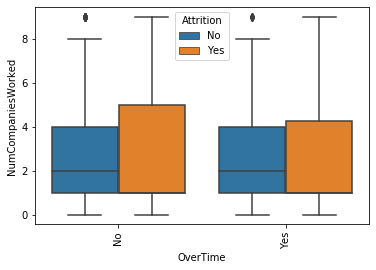

Boxplot for OverTime and EmpLastSalaryHikePercent


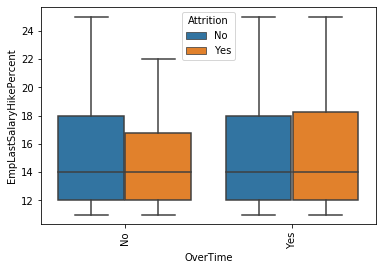

Boxplot for OverTime and EmpRelationshipSatisfaction


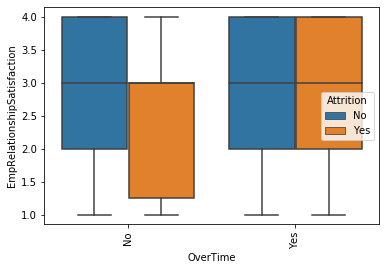

Boxplot for OverTime and TotalWorkExperienceInYears


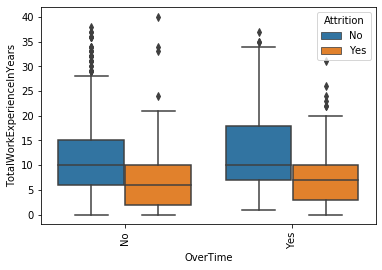

Boxplot for OverTime and TrainingTimesLastYear


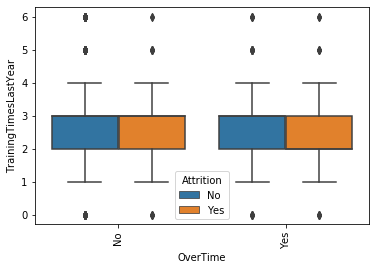

Boxplot for OverTime and EmpWorkLifeBalance


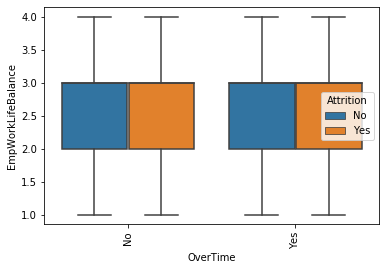

Boxplot for OverTime and ExperienceYearsAtThisCompany


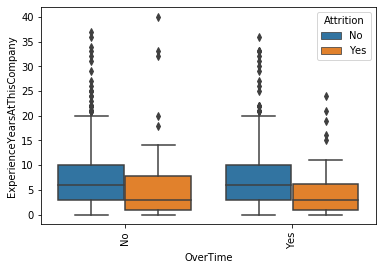

Boxplot for OverTime and ExperienceYearsInCurrentRole


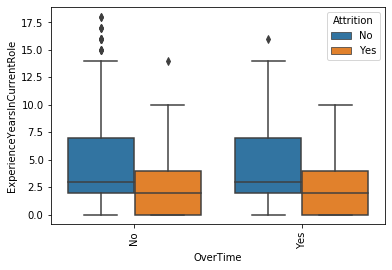

Boxplot for OverTime and YearsSinceLastPromotion


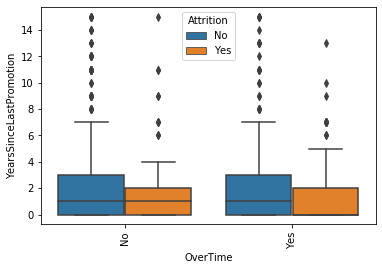

Boxplot for OverTime and YearsWithCurrManager


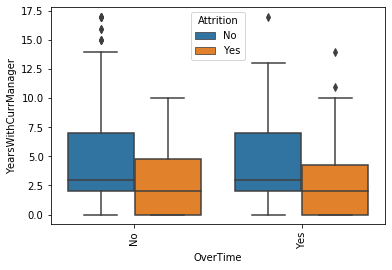

Boxplot for OverTime and PerformanceRating


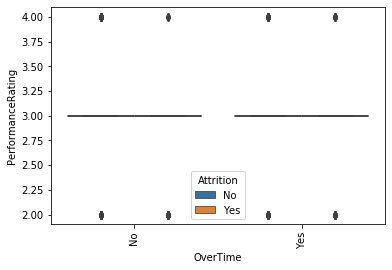

Boxplot for Attrition and Age


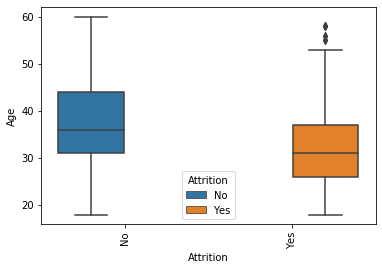

Boxplot for Attrition and DistanceFromHome


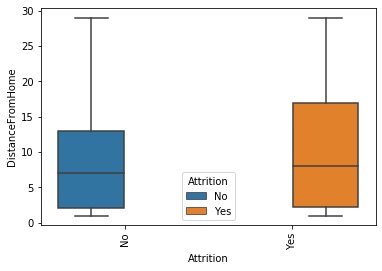

Boxplot for Attrition and EmpEducationLevel


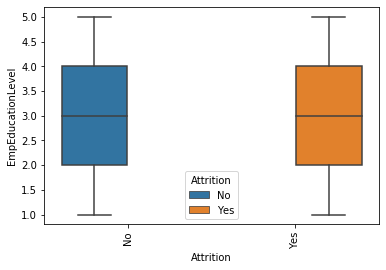

Boxplot for Attrition and EmpEnvironmentSatisfaction


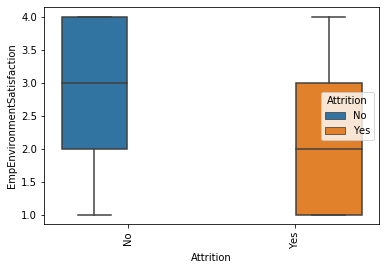

Boxplot for Attrition and EmpHourlyRate


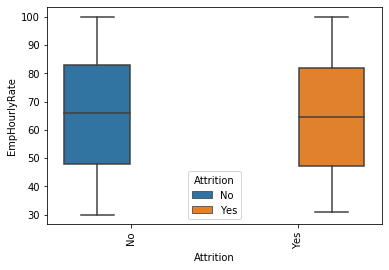

Boxplot for Attrition and EmpJobInvolvement


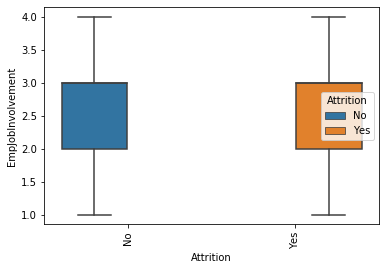

Boxplot for Attrition and EmpJobLevel


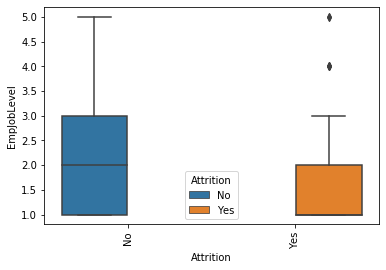

Boxplot for Attrition and EmpJobSatisfaction


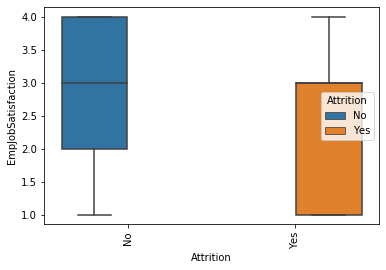

Boxplot for Attrition and NumCompaniesWorked


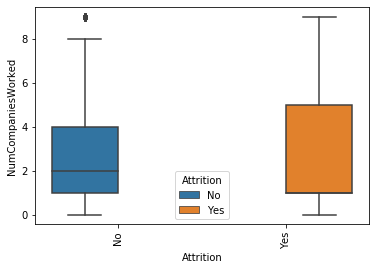

Boxplot for Attrition and EmpLastSalaryHikePercent


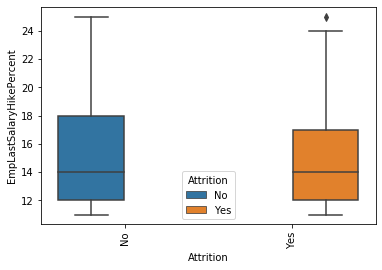

Boxplot for Attrition and EmpRelationshipSatisfaction


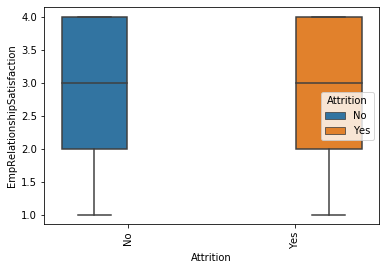

Boxplot for Attrition and TotalWorkExperienceInYears


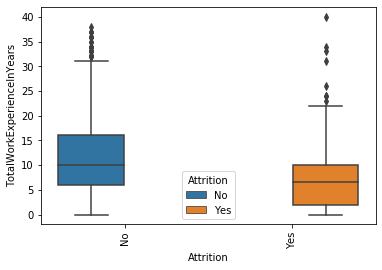

Boxplot for Attrition and TrainingTimesLastYear


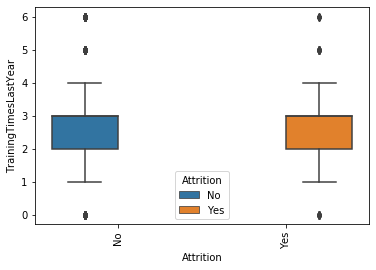

Boxplot for Attrition and EmpWorkLifeBalance


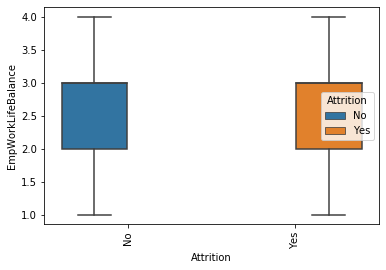

Boxplot for Attrition and ExperienceYearsAtThisCompany


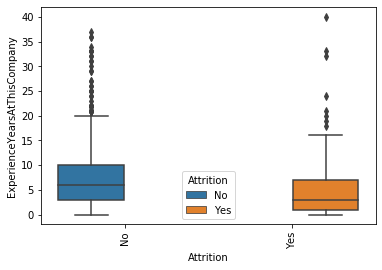

Boxplot for Attrition and ExperienceYearsInCurrentRole


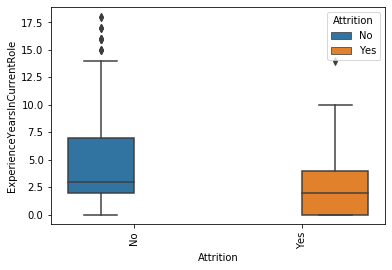

Boxplot for Attrition and YearsSinceLastPromotion


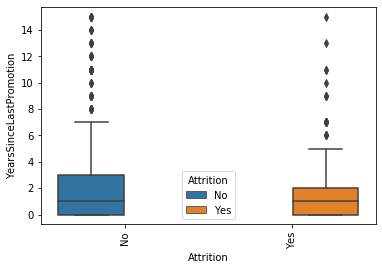

Boxplot for Attrition and YearsWithCurrManager


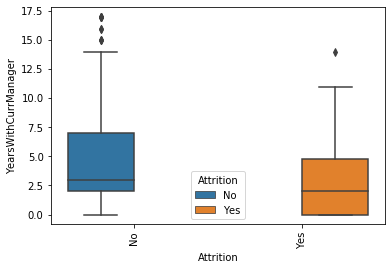

Boxplot for Attrition and PerformanceRating


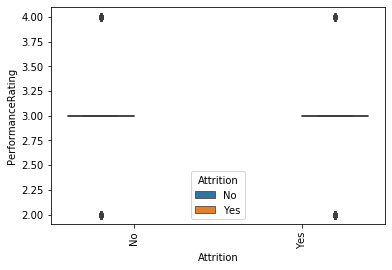

In [15]:
for i in categorical:
    for j in numerical:
        if i != j:
            print ( "Boxplot for {} and {}" .format ( i , j ) )
            sns.boxplot ( data [ i ] , data [ j ] , hue = data [ "Attrition" ] )
            plt.xticks ( rotation = 90 )
            plt.show ( )

## 1.

In [16]:
data.groupby ( "EmpDepartment" ) [ "PerformanceRating" ].mean ( ).sort_values ( ascending = False )

EmpDepartment
Development               3.085873
Data Science              3.050000
Human Resources           2.925926
Research & Development    2.921283
Sales                     2.860590
Finance                   2.775510
Name: PerformanceRating, dtype: float64

Boxplot for Gender and Age


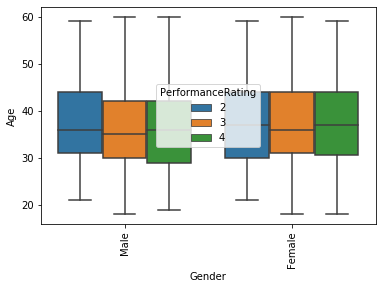

Boxplot for Gender and DistanceFromHome


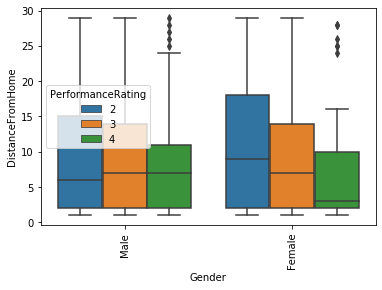

Boxplot for Gender and EmpEducationLevel


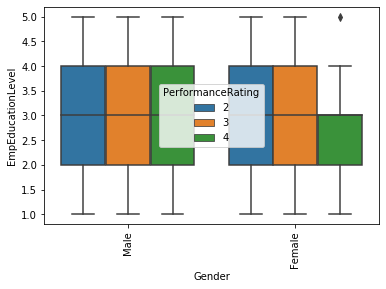

Boxplot for Gender and EmpEnvironmentSatisfaction


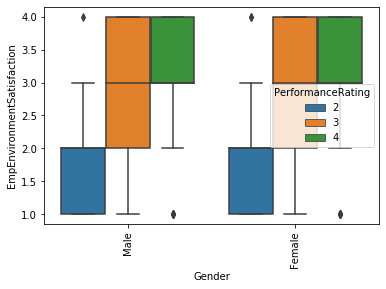

Boxplot for Gender and EmpHourlyRate


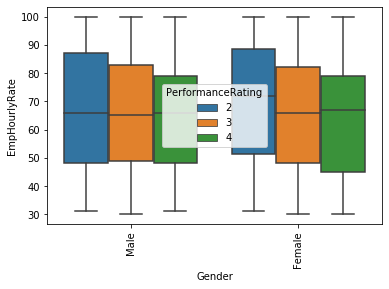

Boxplot for Gender and EmpJobInvolvement


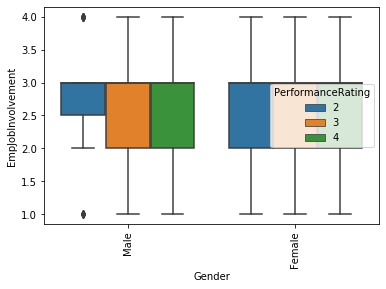

Boxplot for Gender and EmpJobLevel


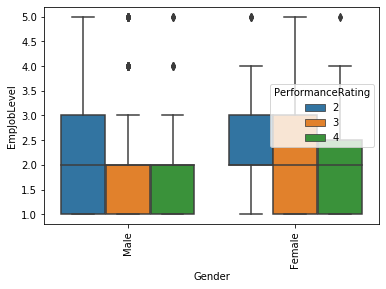

Boxplot for Gender and EmpJobSatisfaction


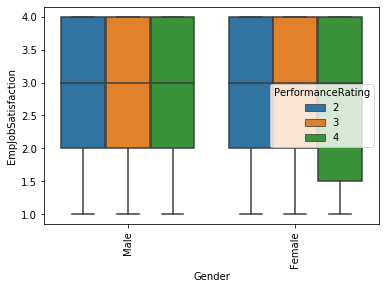

Boxplot for Gender and NumCompaniesWorked


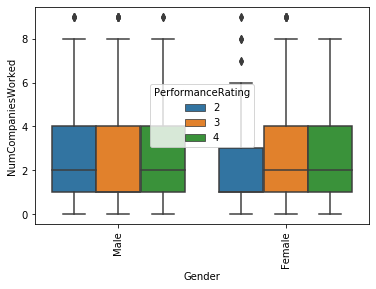

Boxplot for Gender and EmpLastSalaryHikePercent


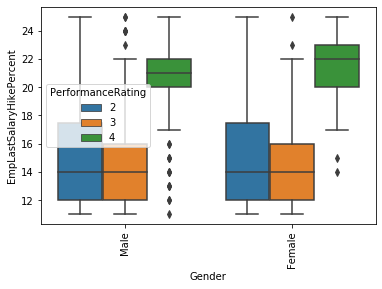

Boxplot for Gender and EmpRelationshipSatisfaction


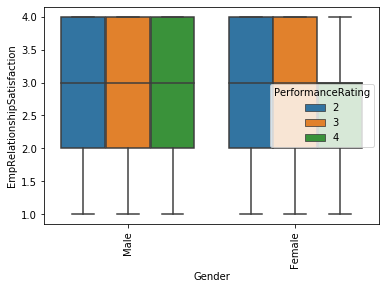

Boxplot for Gender and TotalWorkExperienceInYears


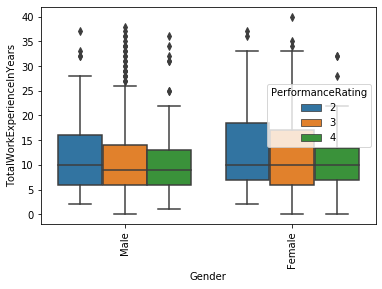

Boxplot for Gender and TrainingTimesLastYear


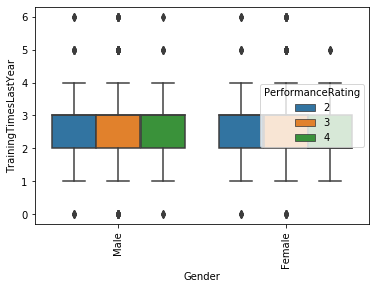

Boxplot for Gender and EmpWorkLifeBalance


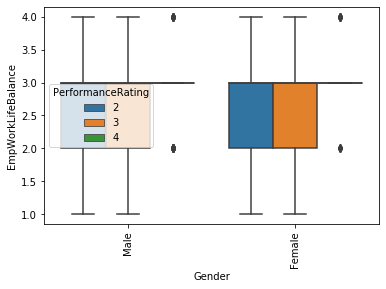

Boxplot for Gender and ExperienceYearsAtThisCompany


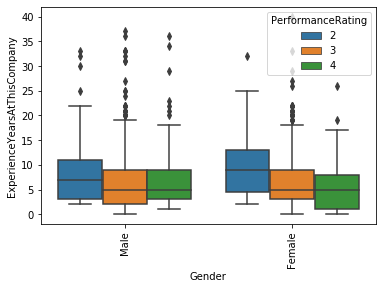

Boxplot for Gender and ExperienceYearsInCurrentRole


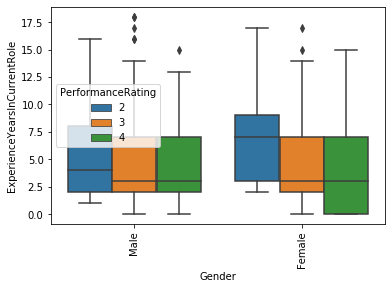

Boxplot for Gender and YearsSinceLastPromotion


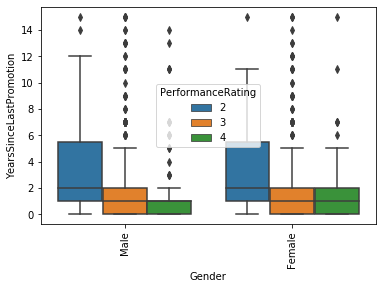

Boxplot for Gender and YearsWithCurrManager


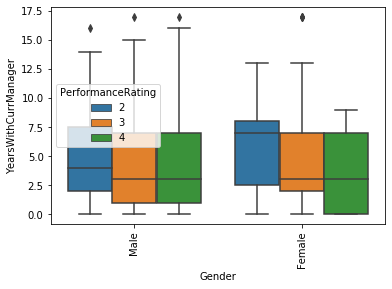

Boxplot for Gender and PerformanceRating


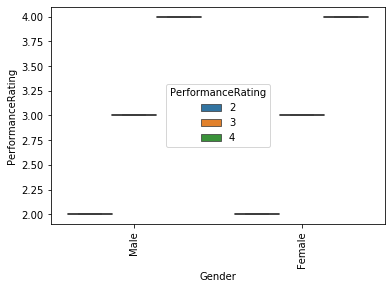

Boxplot for EducationBackground and Age


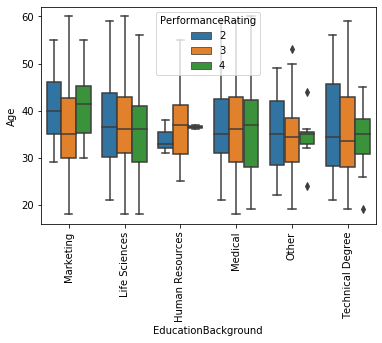

Boxplot for EducationBackground and DistanceFromHome


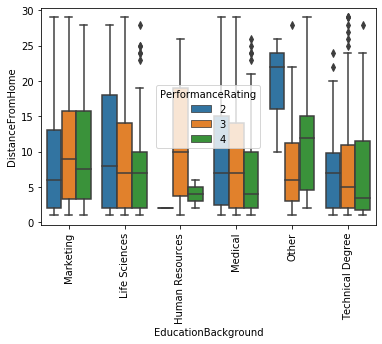

Boxplot for EducationBackground and EmpEducationLevel


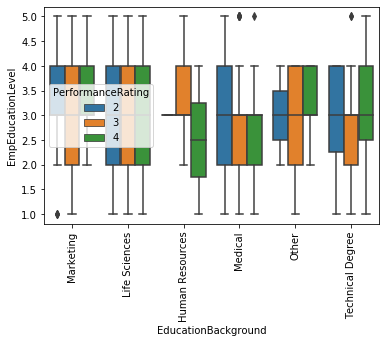

Boxplot for EducationBackground and EmpEnvironmentSatisfaction


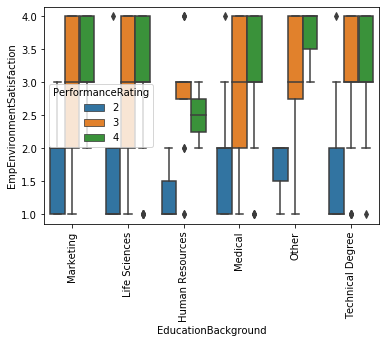

Boxplot for EducationBackground and EmpHourlyRate


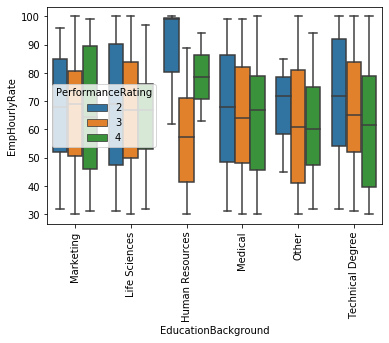

Boxplot for EducationBackground and EmpJobInvolvement


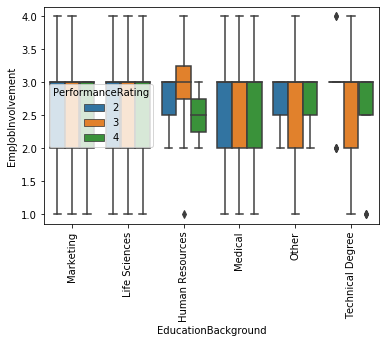

Boxplot for EducationBackground and EmpJobLevel


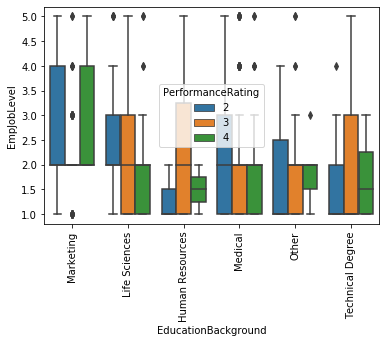

Boxplot for EducationBackground and EmpJobSatisfaction


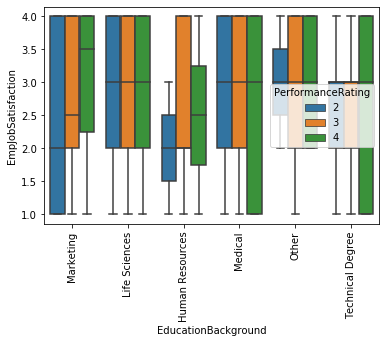

Boxplot for EducationBackground and NumCompaniesWorked


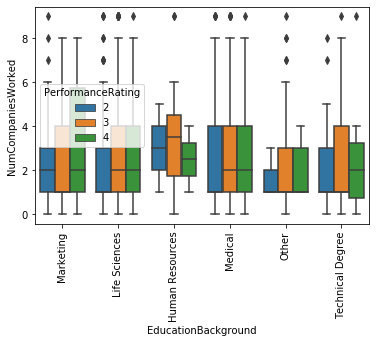

Boxplot for EducationBackground and EmpLastSalaryHikePercent


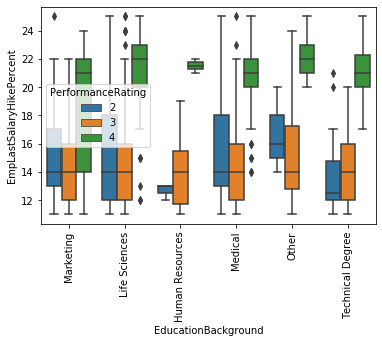

Boxplot for EducationBackground and EmpRelationshipSatisfaction


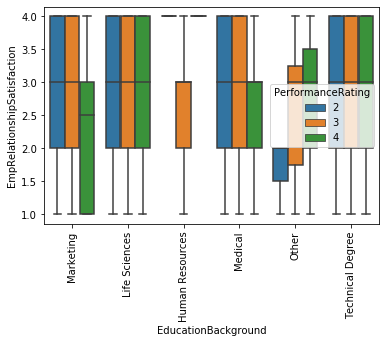

Boxplot for EducationBackground and TotalWorkExperienceInYears


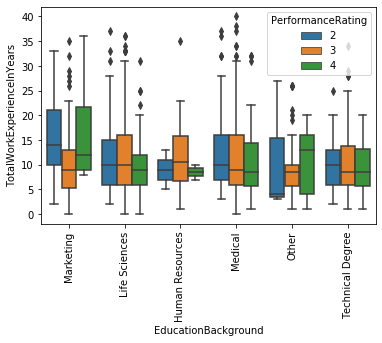

Boxplot for EducationBackground and TrainingTimesLastYear


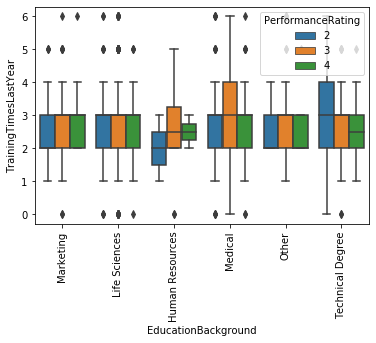

Boxplot for EducationBackground and EmpWorkLifeBalance


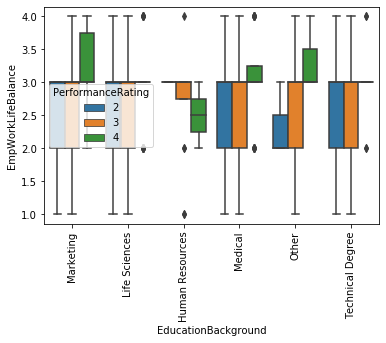

Boxplot for EducationBackground and ExperienceYearsAtThisCompany


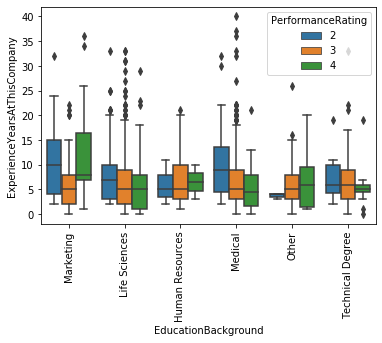

Boxplot for EducationBackground and ExperienceYearsInCurrentRole


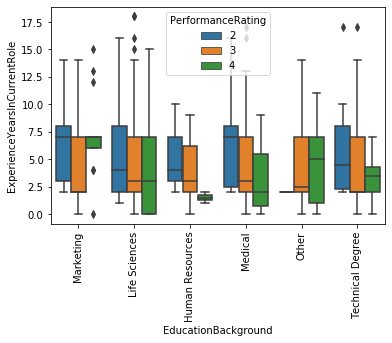

Boxplot for EducationBackground and YearsSinceLastPromotion


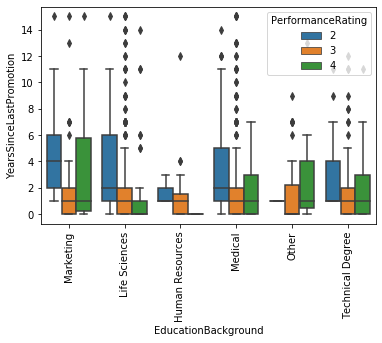

Boxplot for EducationBackground and YearsWithCurrManager


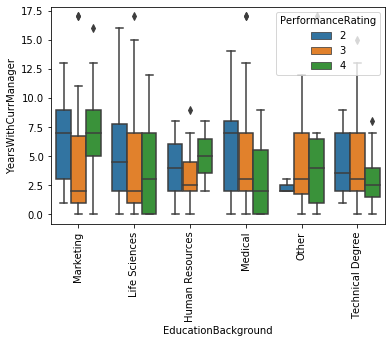

Boxplot for EducationBackground and PerformanceRating


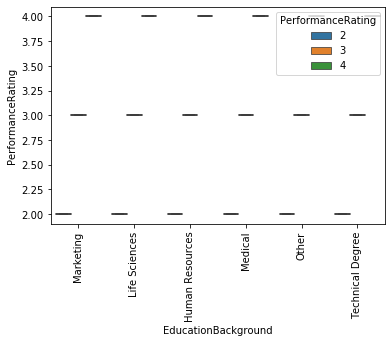

Boxplot for MaritalStatus and Age


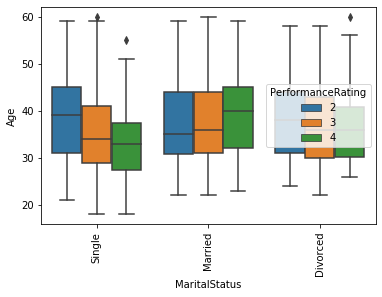

Boxplot for MaritalStatus and DistanceFromHome


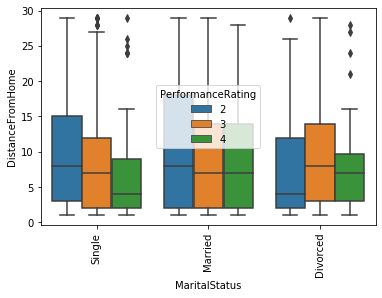

Boxplot for MaritalStatus and EmpEducationLevel


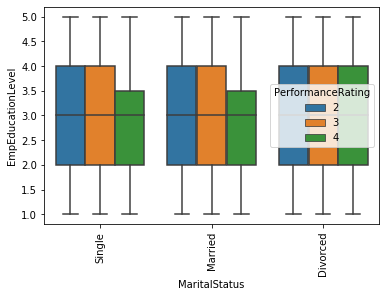

Boxplot for MaritalStatus and EmpEnvironmentSatisfaction


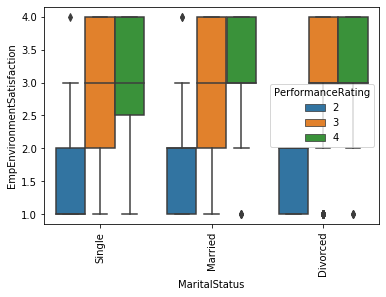

Boxplot for MaritalStatus and EmpHourlyRate


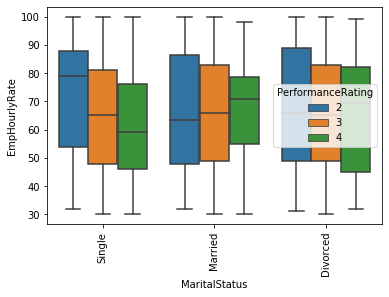

Boxplot for MaritalStatus and EmpJobInvolvement


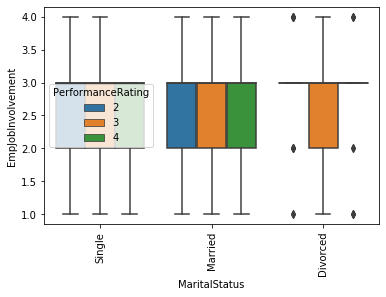

Boxplot for MaritalStatus and EmpJobLevel


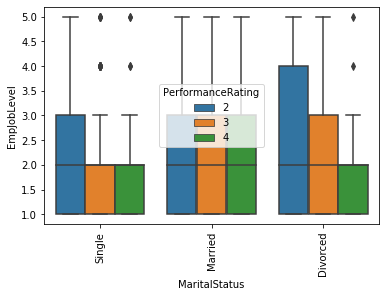

Boxplot for MaritalStatus and EmpJobSatisfaction


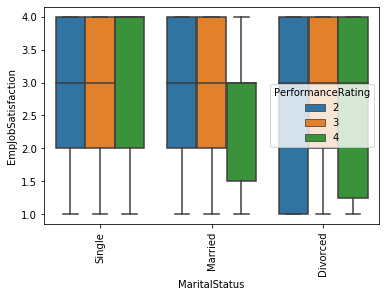

Boxplot for MaritalStatus and NumCompaniesWorked


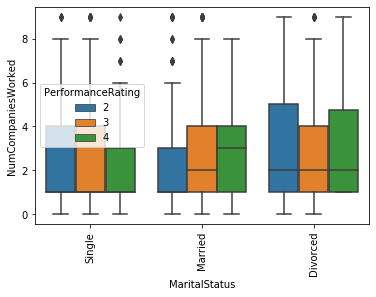

Boxplot for MaritalStatus and EmpLastSalaryHikePercent


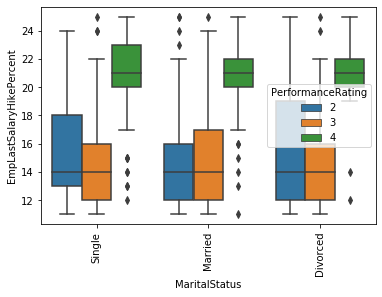

Boxplot for MaritalStatus and EmpRelationshipSatisfaction


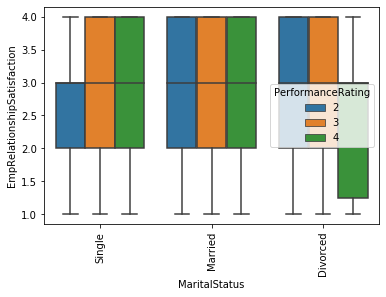

Boxplot for MaritalStatus and TotalWorkExperienceInYears


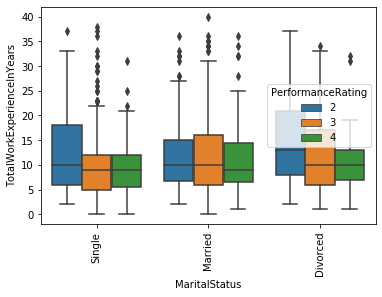

Boxplot for MaritalStatus and TrainingTimesLastYear


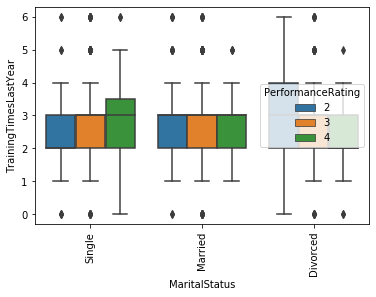

Boxplot for MaritalStatus and EmpWorkLifeBalance


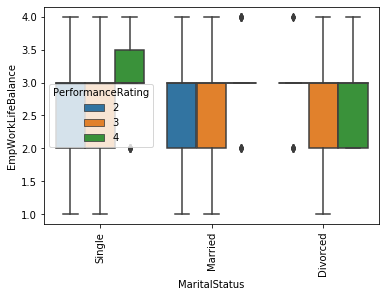

Boxplot for MaritalStatus and ExperienceYearsAtThisCompany


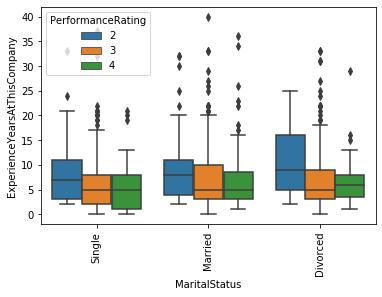

Boxplot for MaritalStatus and ExperienceYearsInCurrentRole


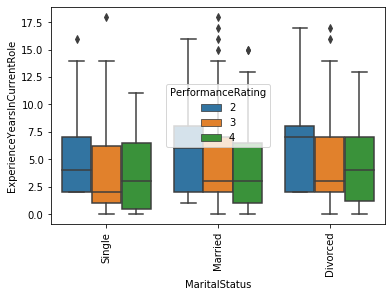

Boxplot for MaritalStatus and YearsSinceLastPromotion


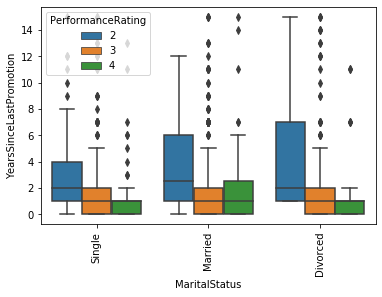

Boxplot for MaritalStatus and YearsWithCurrManager


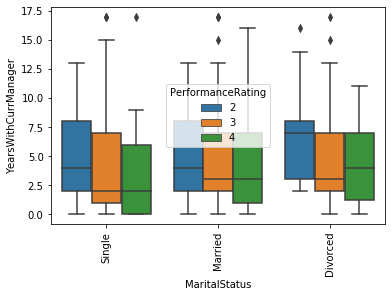

Boxplot for MaritalStatus and PerformanceRating


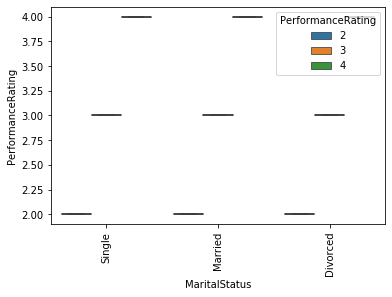

Boxplot for EmpDepartment and Age


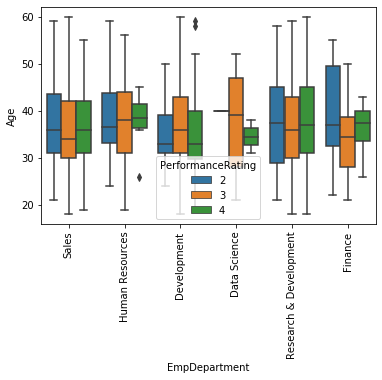

Boxplot for EmpDepartment and DistanceFromHome


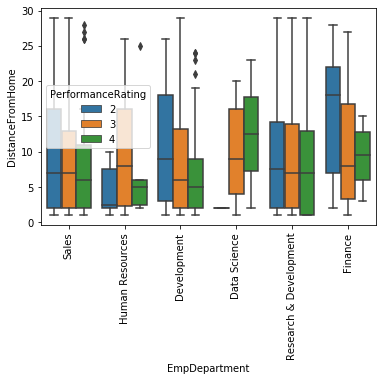

Boxplot for EmpDepartment and EmpEducationLevel


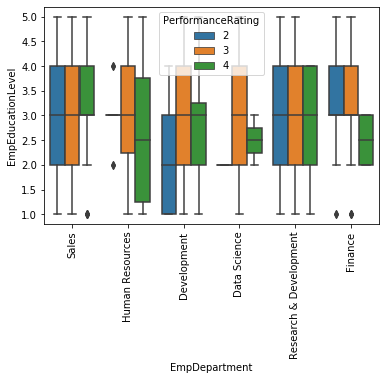

Boxplot for EmpDepartment and EmpEnvironmentSatisfaction


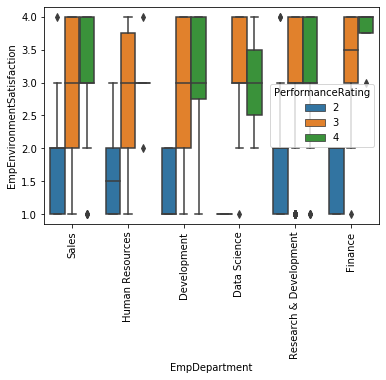

Boxplot for EmpDepartment and EmpHourlyRate


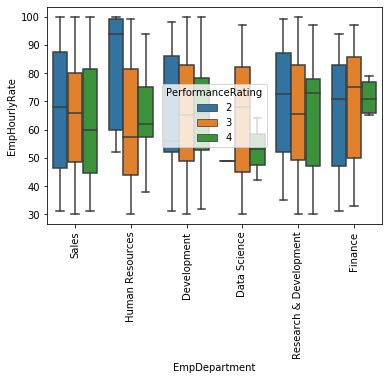

Boxplot for EmpDepartment and EmpJobInvolvement


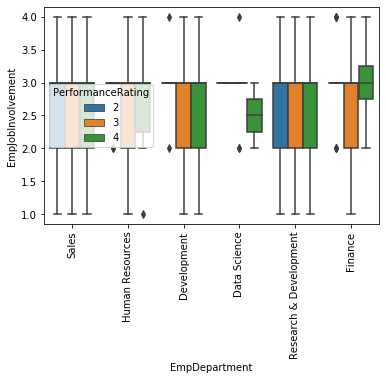

Boxplot for EmpDepartment and EmpJobLevel


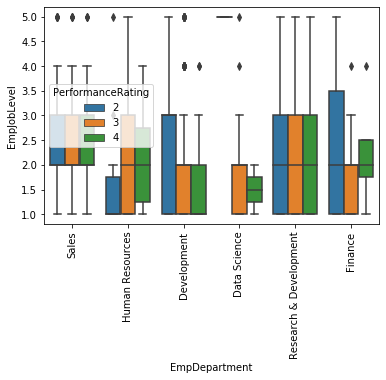

Boxplot for EmpDepartment and EmpJobSatisfaction


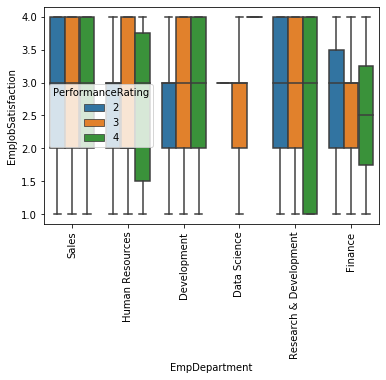

Boxplot for EmpDepartment and NumCompaniesWorked


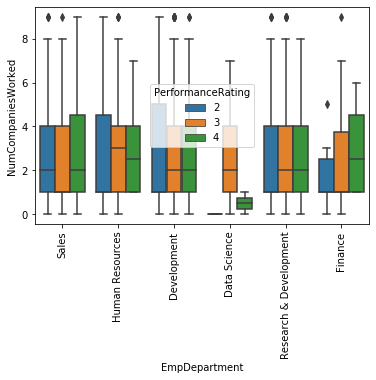

Boxplot for EmpDepartment and EmpLastSalaryHikePercent


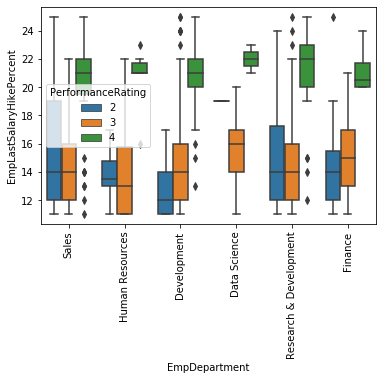

Boxplot for EmpDepartment and EmpRelationshipSatisfaction


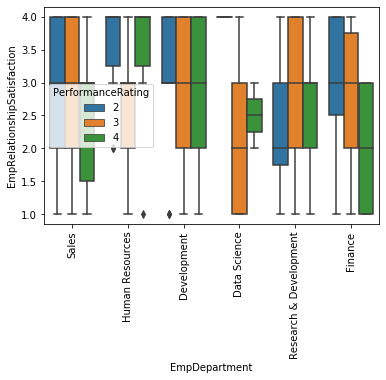

Boxplot for EmpDepartment and TotalWorkExperienceInYears


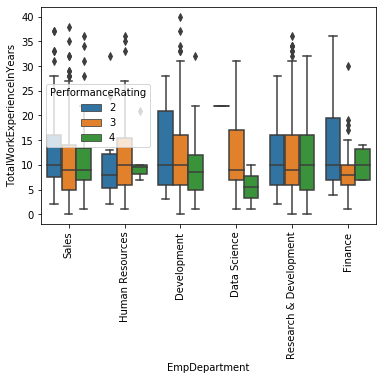

Boxplot for EmpDepartment and TrainingTimesLastYear


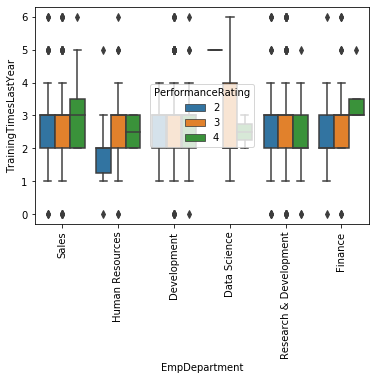

Boxplot for EmpDepartment and EmpWorkLifeBalance


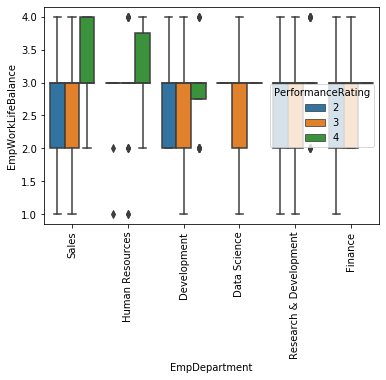

Boxplot for EmpDepartment and ExperienceYearsAtThisCompany


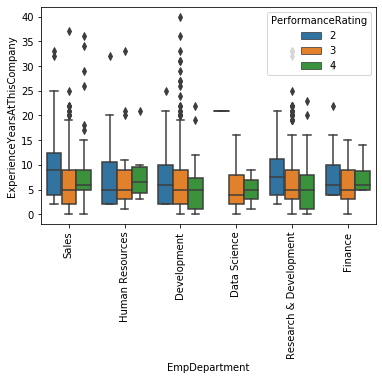

Boxplot for EmpDepartment and ExperienceYearsInCurrentRole


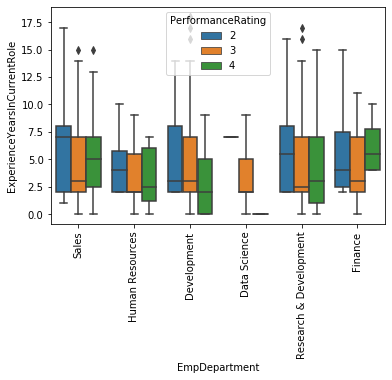

Boxplot for EmpDepartment and YearsSinceLastPromotion


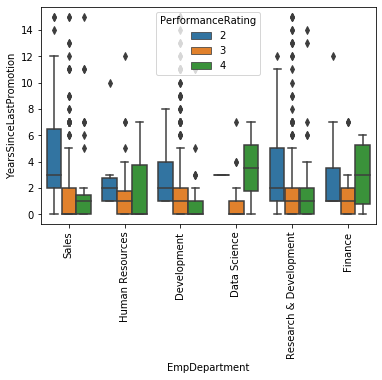

Boxplot for EmpDepartment and YearsWithCurrManager


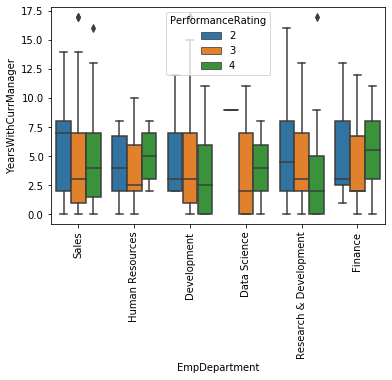

Boxplot for EmpDepartment and PerformanceRating


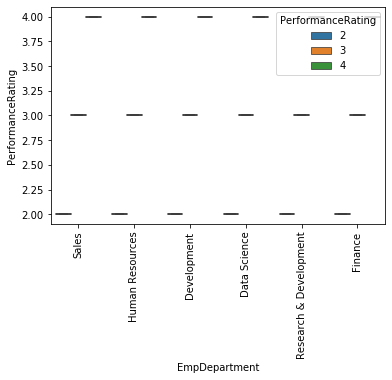

Boxplot for EmpJobRole and Age


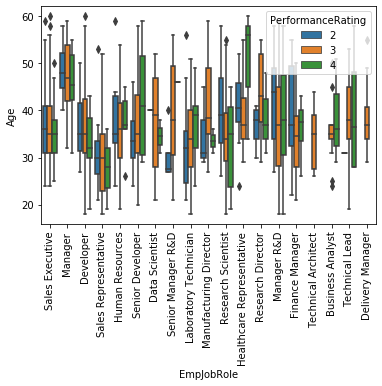

Boxplot for EmpJobRole and DistanceFromHome


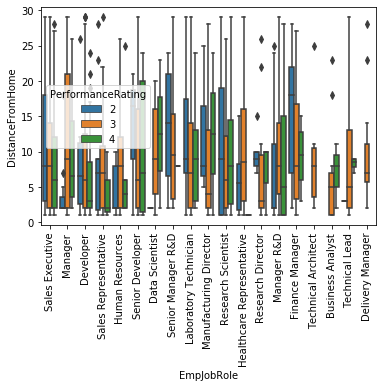

Boxplot for EmpJobRole and EmpEducationLevel


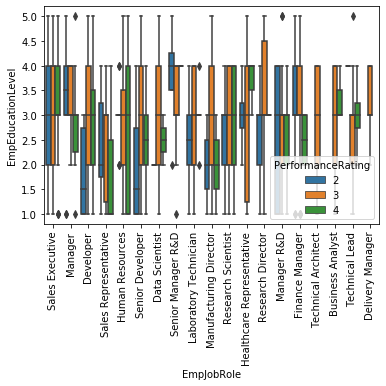

Boxplot for EmpJobRole and EmpEnvironmentSatisfaction


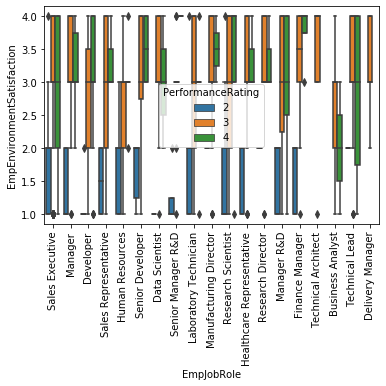

Boxplot for EmpJobRole and EmpHourlyRate


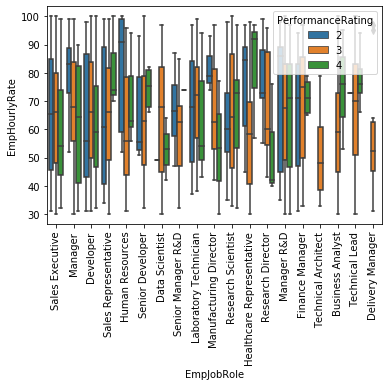

Boxplot for EmpJobRole and EmpJobInvolvement


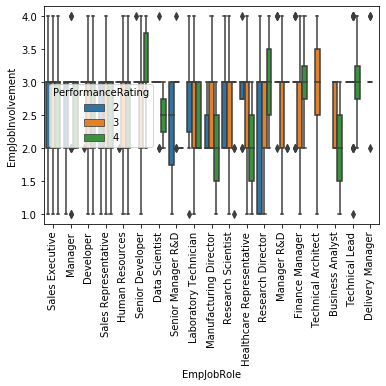

Boxplot for EmpJobRole and EmpJobLevel


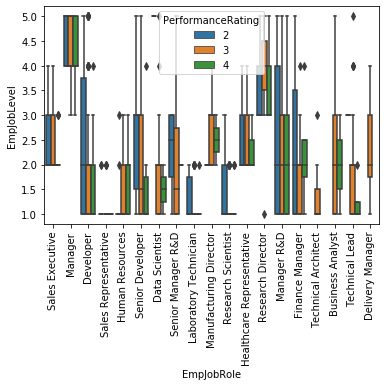

Boxplot for EmpJobRole and EmpJobSatisfaction


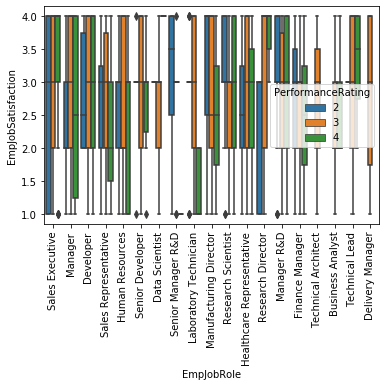

Boxplot for EmpJobRole and NumCompaniesWorked


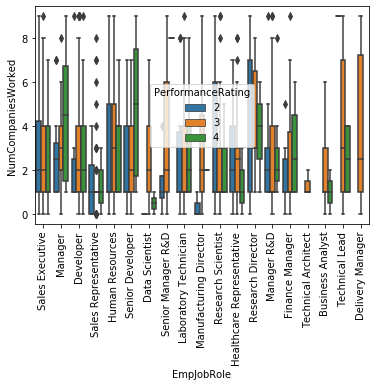

Boxplot for EmpJobRole and EmpLastSalaryHikePercent


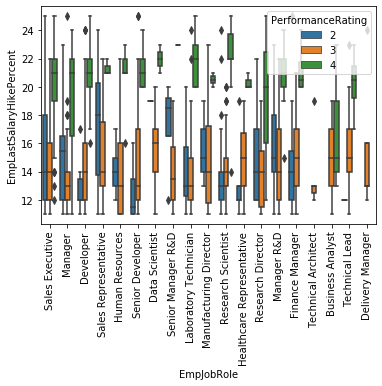

Boxplot for EmpJobRole and EmpRelationshipSatisfaction


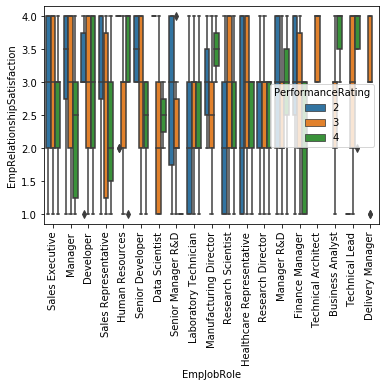

Boxplot for EmpJobRole and TotalWorkExperienceInYears


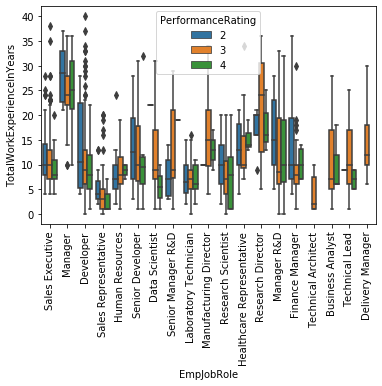

Boxplot for EmpJobRole and TrainingTimesLastYear


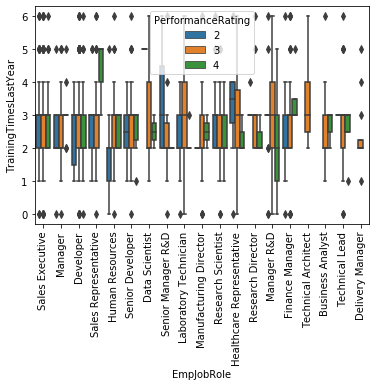

Boxplot for EmpJobRole and EmpWorkLifeBalance


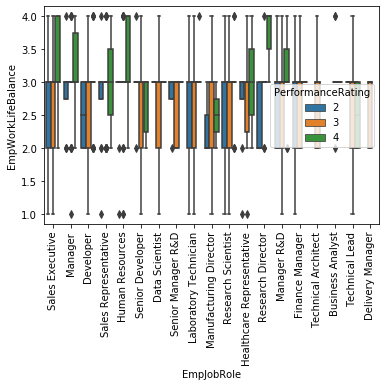

Boxplot for EmpJobRole and ExperienceYearsAtThisCompany


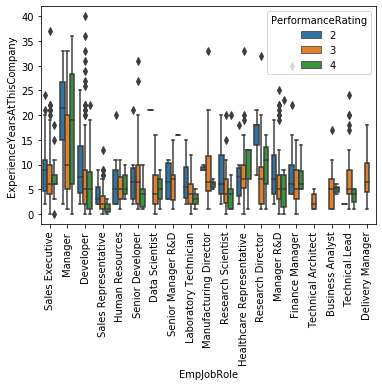

Boxplot for EmpJobRole and ExperienceYearsInCurrentRole


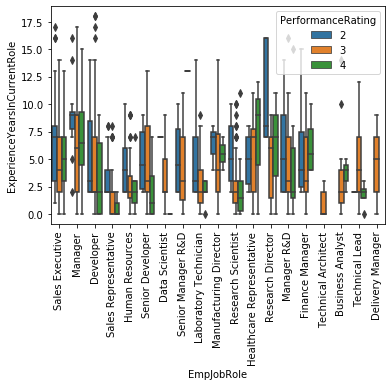

Boxplot for EmpJobRole and YearsSinceLastPromotion


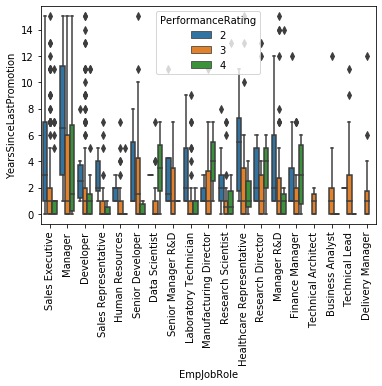

Boxplot for EmpJobRole and YearsWithCurrManager


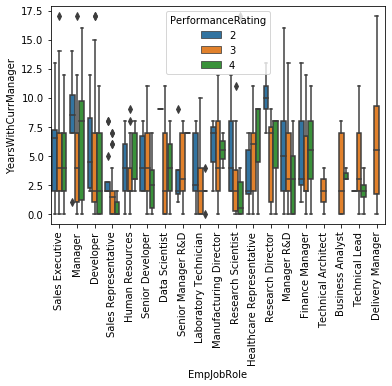

Boxplot for EmpJobRole and PerformanceRating


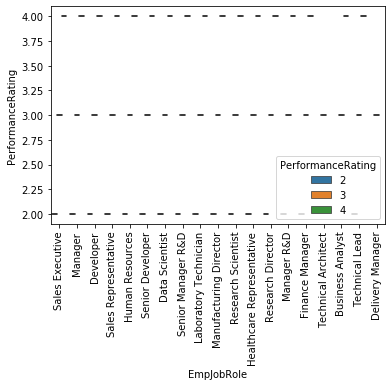

Boxplot for BusinessTravelFrequency and Age


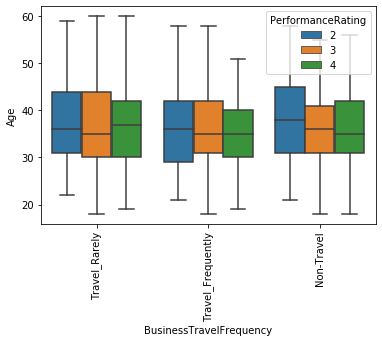

Boxplot for BusinessTravelFrequency and DistanceFromHome


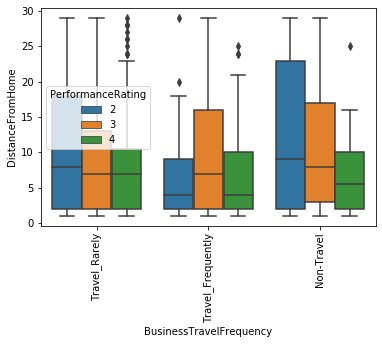

Boxplot for BusinessTravelFrequency and EmpEducationLevel


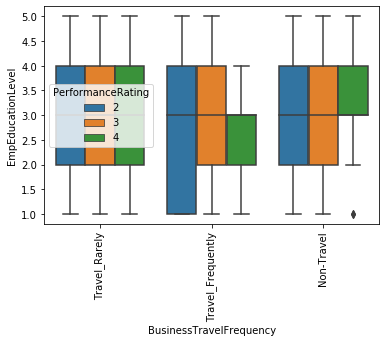

Boxplot for BusinessTravelFrequency and EmpEnvironmentSatisfaction


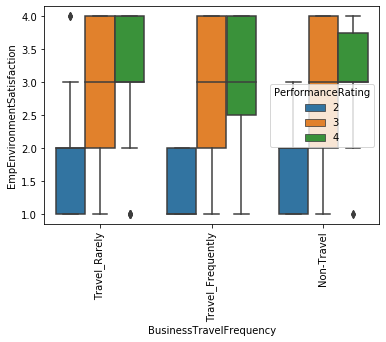

Boxplot for BusinessTravelFrequency and EmpHourlyRate


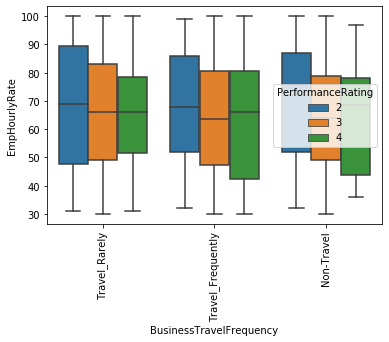

Boxplot for BusinessTravelFrequency and EmpJobInvolvement


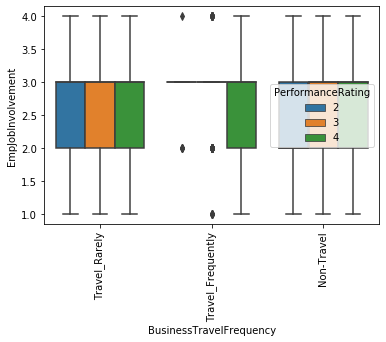

Boxplot for BusinessTravelFrequency and EmpJobLevel


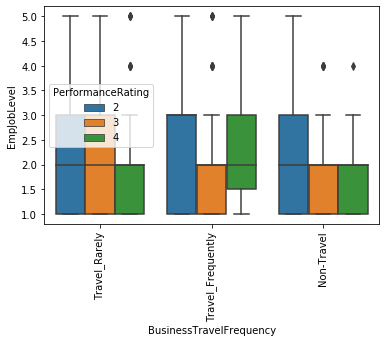

Boxplot for BusinessTravelFrequency and EmpJobSatisfaction


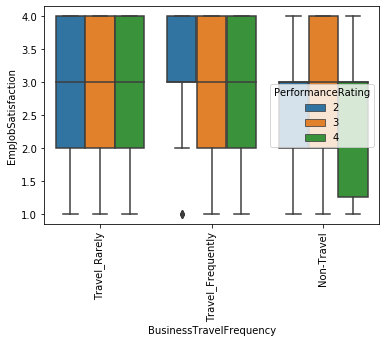

Boxplot for BusinessTravelFrequency and NumCompaniesWorked


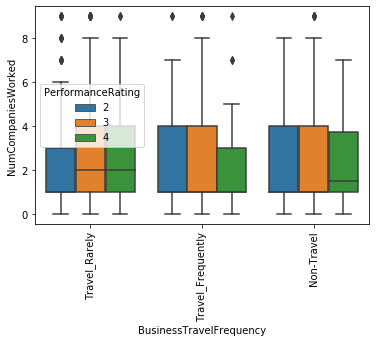

Boxplot for BusinessTravelFrequency and EmpLastSalaryHikePercent


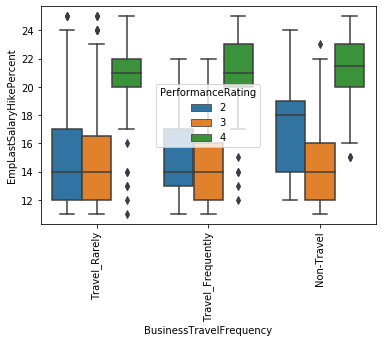

Boxplot for BusinessTravelFrequency and EmpRelationshipSatisfaction


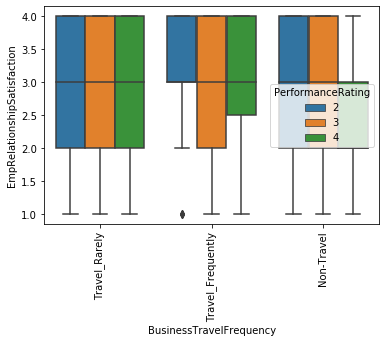

Boxplot for BusinessTravelFrequency and TotalWorkExperienceInYears


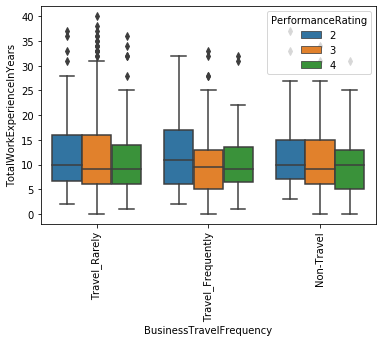

Boxplot for BusinessTravelFrequency and TrainingTimesLastYear


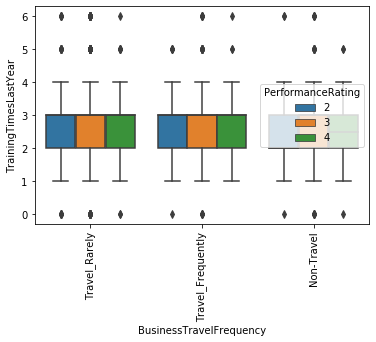

Boxplot for BusinessTravelFrequency and EmpWorkLifeBalance


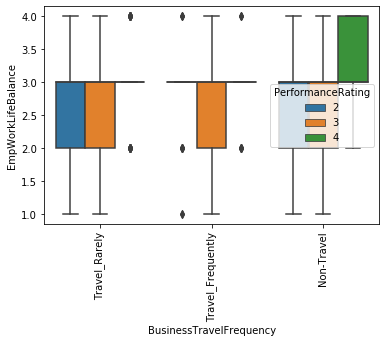

Boxplot for BusinessTravelFrequency and ExperienceYearsAtThisCompany


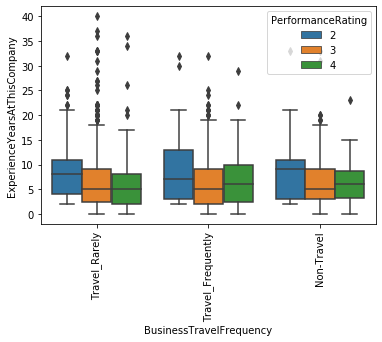

Boxplot for BusinessTravelFrequency and ExperienceYearsInCurrentRole


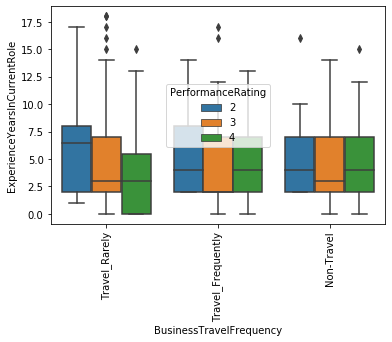

Boxplot for BusinessTravelFrequency and YearsSinceLastPromotion


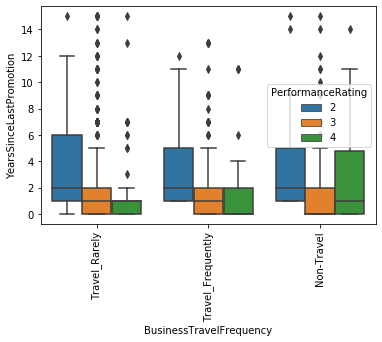

Boxplot for BusinessTravelFrequency and YearsWithCurrManager


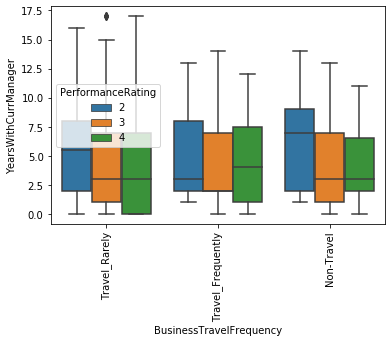

Boxplot for BusinessTravelFrequency and PerformanceRating


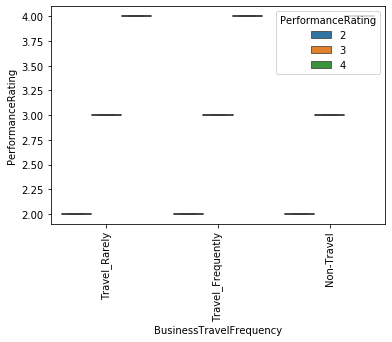

Boxplot for OverTime and Age


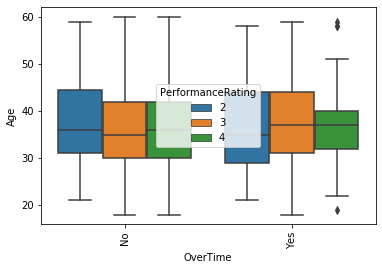

Boxplot for OverTime and DistanceFromHome


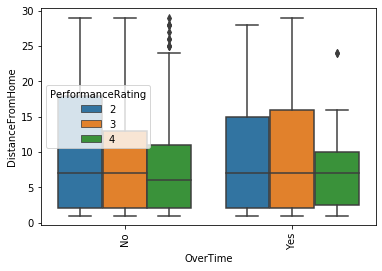

Boxplot for OverTime and EmpEducationLevel


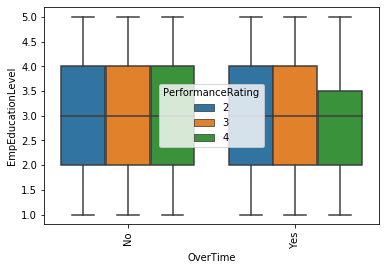

Boxplot for OverTime and EmpEnvironmentSatisfaction


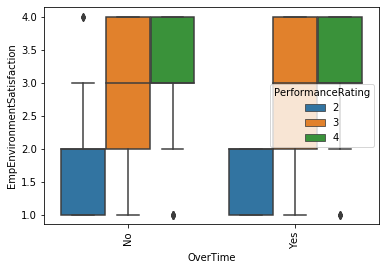

Boxplot for OverTime and EmpHourlyRate


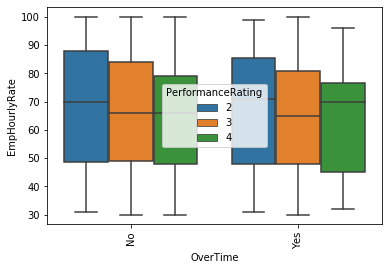

Boxplot for OverTime and EmpJobInvolvement


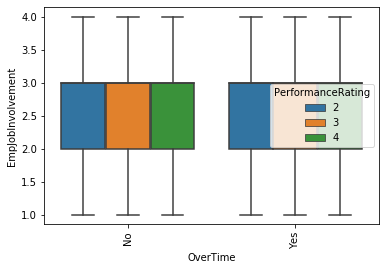

Boxplot for OverTime and EmpJobLevel


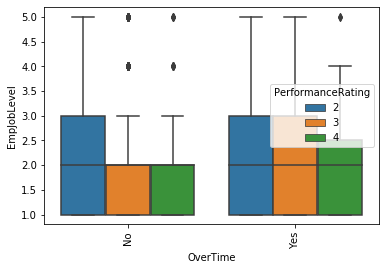

Boxplot for OverTime and EmpJobSatisfaction


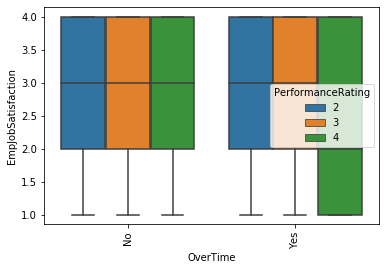

Boxplot for OverTime and NumCompaniesWorked


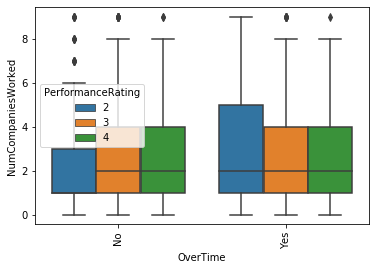

Boxplot for OverTime and EmpLastSalaryHikePercent


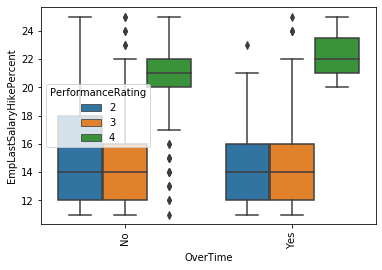

Boxplot for OverTime and EmpRelationshipSatisfaction


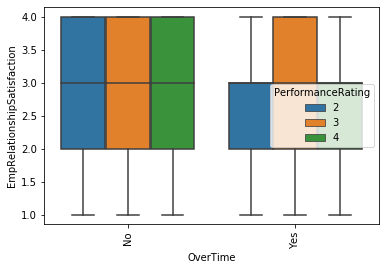

Boxplot for OverTime and TotalWorkExperienceInYears


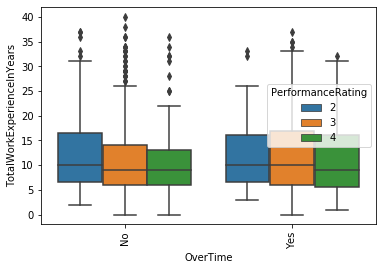

Boxplot for OverTime and TrainingTimesLastYear


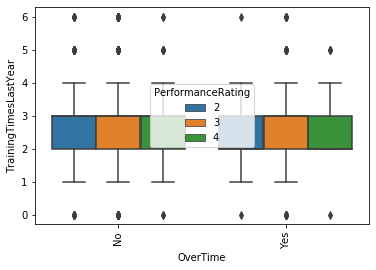

Boxplot for OverTime and EmpWorkLifeBalance


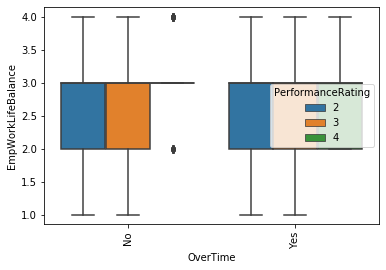

Boxplot for OverTime and ExperienceYearsAtThisCompany


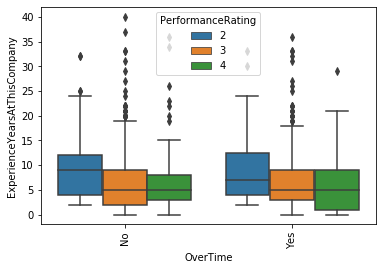

Boxplot for OverTime and ExperienceYearsInCurrentRole


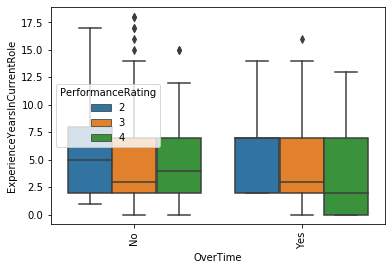

Boxplot for OverTime and YearsSinceLastPromotion


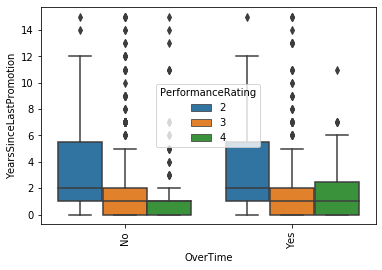

Boxplot for OverTime and YearsWithCurrManager


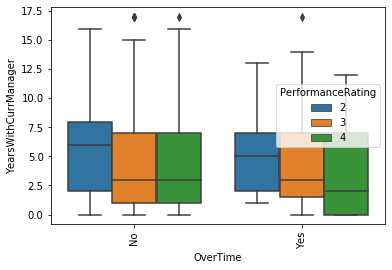

Boxplot for OverTime and PerformanceRating


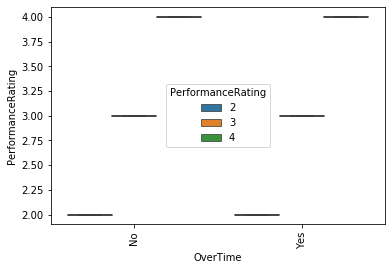

Boxplot for Attrition and Age


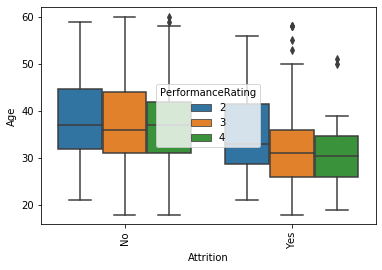

Boxplot for Attrition and DistanceFromHome


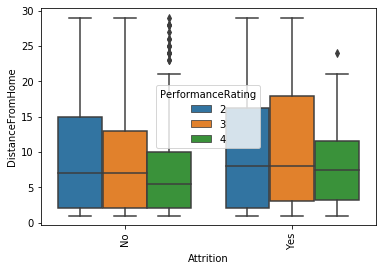

Boxplot for Attrition and EmpEducationLevel


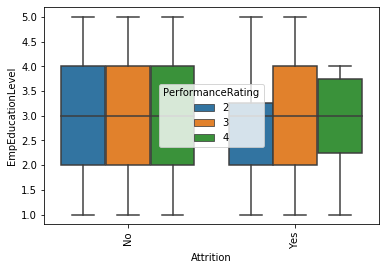

Boxplot for Attrition and EmpEnvironmentSatisfaction


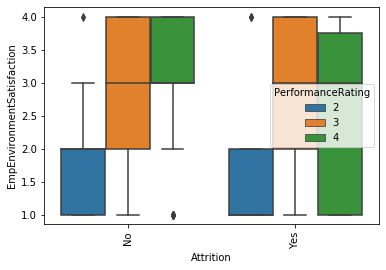

Boxplot for Attrition and EmpHourlyRate


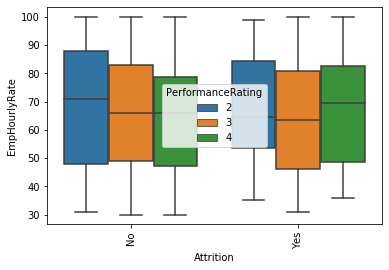

Boxplot for Attrition and EmpJobInvolvement


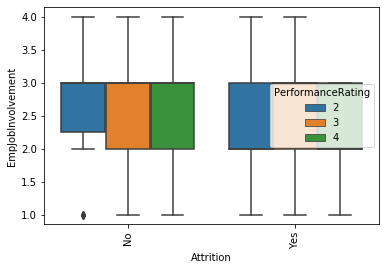

Boxplot for Attrition and EmpJobLevel


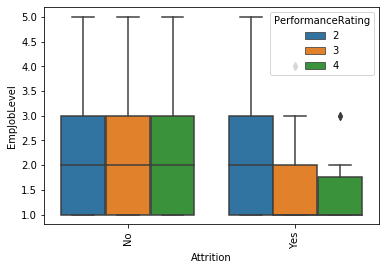

Boxplot for Attrition and EmpJobSatisfaction


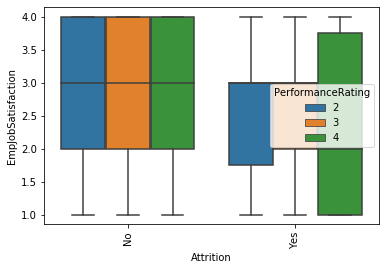

Boxplot for Attrition and NumCompaniesWorked


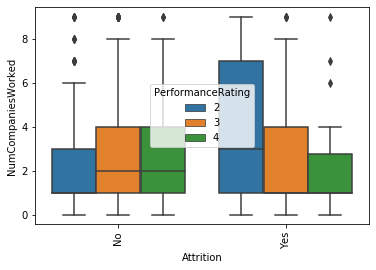

Boxplot for Attrition and EmpLastSalaryHikePercent


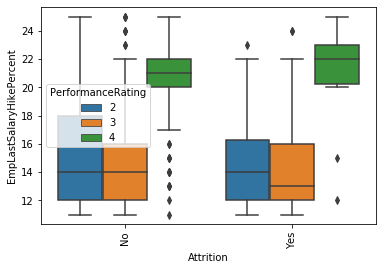

Boxplot for Attrition and EmpRelationshipSatisfaction


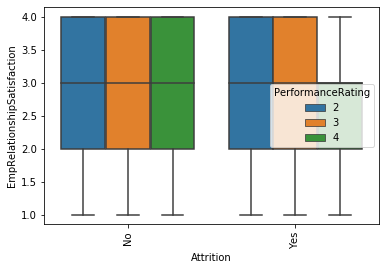

Boxplot for Attrition and TotalWorkExperienceInYears


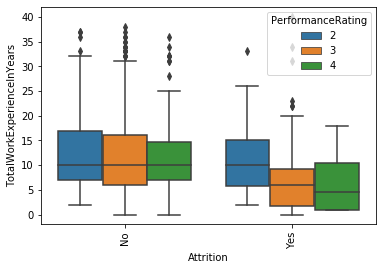

Boxplot for Attrition and TrainingTimesLastYear


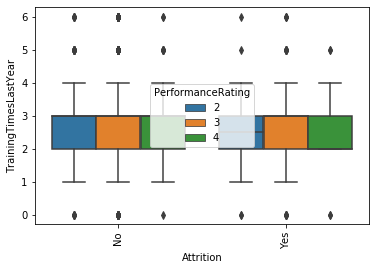

Boxplot for Attrition and EmpWorkLifeBalance


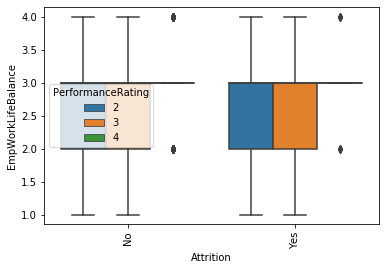

Boxplot for Attrition and ExperienceYearsAtThisCompany


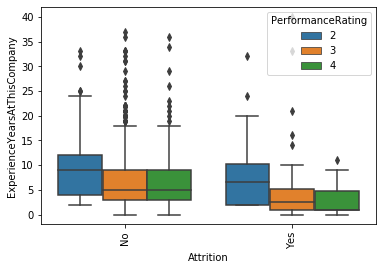

Boxplot for Attrition and ExperienceYearsInCurrentRole


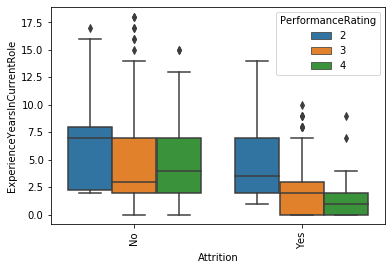

Boxplot for Attrition and YearsSinceLastPromotion


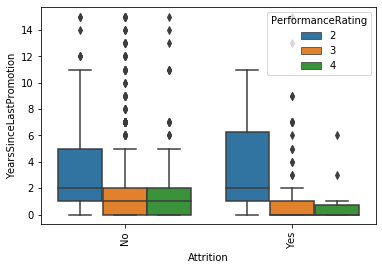

Boxplot for Attrition and YearsWithCurrManager


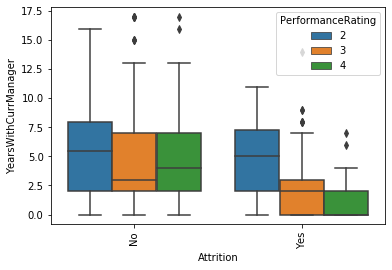

Boxplot for Attrition and PerformanceRating


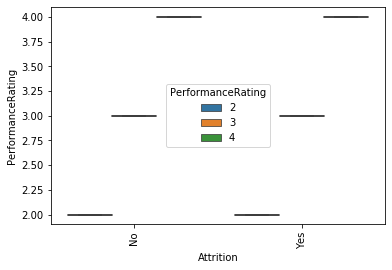

In [17]:
for i in categorical:
    for j in numerical:
        if i != j:
            print ( "Boxplot for {} and {}" .format ( i , j ) )
            sns.boxplot ( data [ i ] , data [ j ] , hue = data [ "PerformanceRating" ] )
            plt.xticks ( rotation = 90 )
            plt.show ( )

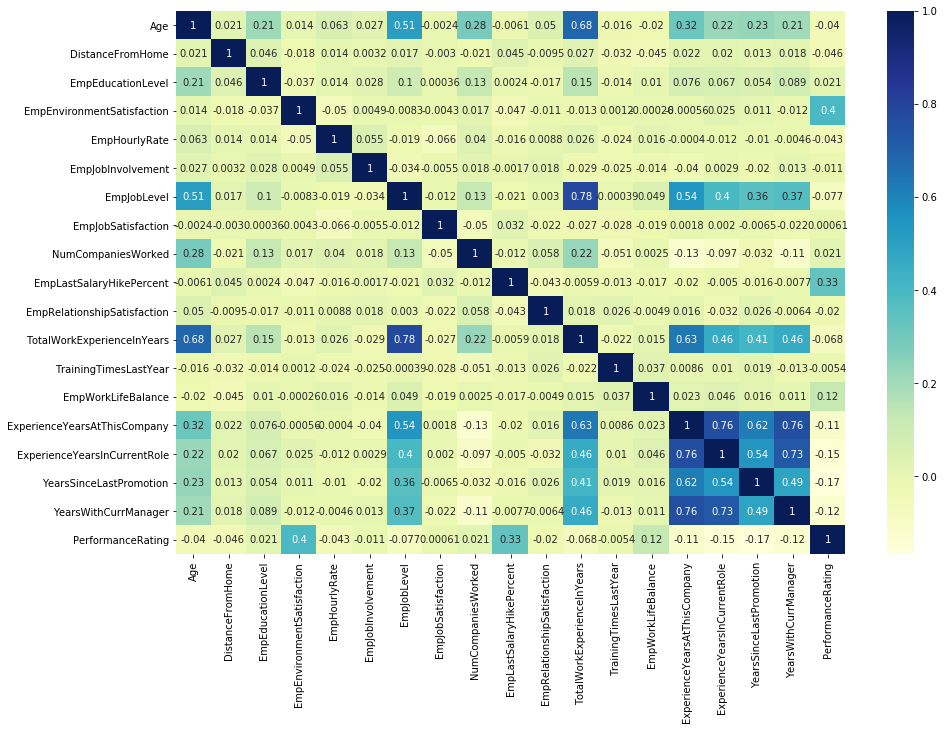

In [18]:
f , ax = plt.subplots ( figsize = ( 15 , 10 ) )
sns.heatmap ( data.corr ( ) , annot = True , cmap = "YlGnBu" )

## 2.

In [19]:
corr = data.corr ( )
corr = corr [ 'PerformanceRating' ]
corr.sort_values ( ascending = False ).head ( 4 )

PerformanceRating             1.000000
EmpEnvironmentSatisfaction    0.395561
EmpLastSalaryHikePercent      0.333722
EmpWorkLifeBalance            0.124429
Name: PerformanceRating, dtype: float64

EmpEnvironmentSatisfaction  , EmpLastSalaryHikePercent and EmpWorkLifeBalance are the top 3 factors affecting the Performance.

In [20]:
for i in categorical:
    le = LabelEncoder ( )
    data [ i ] = le.fit_transform ( data [ i ] )

In [21]:
X = data.drop ( "Attrition" , axis = 1 )
y = data [ "Attrition" ]

In [22]:
X_train , X_test , y_train , y_test = train_test_split ( X , y , test_size = 0.3 , random_state = 37 )

## 3.

In [23]:
models = { "Logistic Regression" : LogisticRegression ( ) , 
         "Decision Tree Classifier" : DecisionTreeClassifier ( ) , 
         "Random Forest Classifier" : RandomForestClassifier ( ) , 
         "K Nearest Neighbors" : KNeighborsClassifier ( ) , 
         "Gaussian Naive Bayes" : GaussianNB ( ) }
model_name , accuracy , correct , incorrect , type1 , type2 , roc , sens = [ ] , [ ] , [ ] , [ ] , [ ] , [ ] , [ ] , [ ] 
for k , v in models.items ( ):
    model = v
    model.fit ( X_train , y_train )
    predict = model.predict ( X_test )
    model_name.append ( k )
    accuracy.append ( round ( accuracy_score ( y_test , predict ) , 2 ) )
    cm = confusion_matrix ( y_test , predict )
    correct.append ( cm [ 0 , 0 ] + cm [ 1 , 1 ] )
    incorrect.append ( cm [ 0 , 1 ] + cm [ 1 , 0 ] )
    type1.append ( cm [ 0 , 1 ] )
    type2.append ( cm [ 1 , 0 ] )
    sens.append ( round ( cm [ 1 , 1 ] / ( cm [ 1 , 1 ] + cm [ 1 , 0 ] ) , 2 ) )
    roc.append ( round ( roc_auc_score ( y_test , model.predict_proba ( X_test ) [ : , 1 ] ) , 2 ) )
df = pd.DataFrame ( { "Model" : model_name , 
                    "Accuracy" : accuracy , 
                    "Correct" : correct , 
                    "Incorrect" : incorrect , 
                    "Type-I Error" : type1 , 
                    "Type-II Error" : type2 , 
                     "Sensitivity" : sens ,
                    "ROC AUC Score" : roc } )
df

,Model,Accuracy,Correct,Incorrect,Type-I Error,Type-II Error,Sensitivity,ROC AUC Score
0,Logistic Regression,0.91,329,31,8,23,0.44,0.84
1,Decision Tree Classifier,0.82,294,66,39,27,0.34,0.61
2,Random Forest Classifier,0.88,316,44,9,35,0.15,0.77
3,K Nearest Neighbors,0.86,311,49,11,38,0.07,0.62
4,Gaussian Naive Bayes,0.82,295,65,50,15,0.63,0.84


## 4.

- Logistic Regression is the best among all the models that have been implemented.
- More females should be hired whose home is nearer to work location.
- Employee Salary Hike plays a crucial role.
- People with Technical Degrees should be hired more.
- Singles with a lesser hourly rate tend to do better.
- Hike in salary can cause an increased performance.
- Promotions should be more frequent.
- Environment Satisfaction plays a good role.
- Employees with No travel enjoy the best work life balance and hence get the best performance.
- Attrition at lesser age is more frequent.